# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

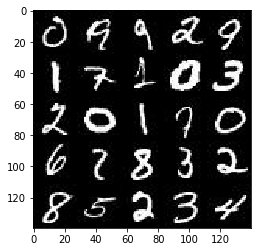

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

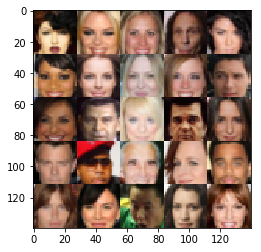

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_dim = (image_width, image_height, image_channels)
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    learning_rate = tf.placeholder(tf.float32, None, name='learning_rate')

    return inputs_real, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [6]:
def LeakyReLU(x, alpha=0.2):
    return tf.maximum(alpha * x, x)

In [19]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    # Using dropouts in discrimnator so as to weaken it's learning model for the data distribution 
    # as well as help generalise better.
    keep_probability = 0.7
    
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x1 for MNIST or 28x28x3 for CelebA
        # This is the 1st layer
        # No batch normalization on first layer
        x1 = tf.layers.conv2d(images, 128, 4, strides=2, padding='same', 
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        x1 = tf.nn.dropout(x1, keep_probability)
        relu1 = LeakyReLU(x1)
        # 14x14x64 now
        #print('discriminator x1 shape ', x1.shape)
        
        # This is the 2nd layer
        x2 = tf.layers.conv2d(relu1, 256, 4, strides=2, padding='same', 
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.nn.dropout(x2, keep_probability)
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = LeakyReLU(bn2)
        # 7x7x128 now
        #print('discriminator x2 shape ', x2.shape)
        
        # This is the 3rd layer
        x3 = tf.layers.conv2d(relu2, 512, 5, strides=2, padding='same', 
                              kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.nn.dropout(x3, keep_probability)
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = LeakyReLU(bn3)
        # 4x4x256 now
        #print('discriminator x3 shape ', x3.shape)

        # This is the 4th fully-connected layer
        # Flatten it
        #flat = tf.reshape(relu2, (-1, 7*7*128)) before adding additional layer
        flat = tf.reshape(relu3, (-1, 4*4*512))
        logits = tf.layers.dense(flat, 1, kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        logits = tf.nn.dropout(logits, keep_probability)
        out = tf.sigmoid(logits)
    
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [23]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    keep_probability = 0.9 # eliminating dropout weakens generalization in Generator
    # print(out_channel_dim) <- value of 5 in unit test
    #output_dim = (28, 28, out_channel_dim)
    
    with tf.variable_scope('generator', reuse=not is_train): # <- not sure if reuse during training
        # 1st fully connected layer
        x1 = tf.layers.dense(z, 2*2*512, kernel_initializer=tf.truncated_normal_initializer(stddev=0.02))
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 2, 2, 256))
        #x1 = tf.nn.dropout(x1, keep_probability)
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = LeakyReLU(x1)
        # 2x2x512 now
        
        # This is the 2nd layer
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='valid', 
                                        kernel_initializer=tf.contrib.layers.xavier_initializer())
        #x2 = tf.nn.dropout(x2, keep_probability)
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = LeakyReLU(x2)
        # 7x7x256 now
        
        # This is the 3rd layer
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same', 
                                        kernel_initializer=tf.contrib.layers.xavier_initializer())
        #x3 = tf.nn.dropout(x3, keep_probability)
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = LeakyReLU(x3)
        # 14x14x128 now
        
        # This is the 4th, output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same', 
                                            kernel_initializer=tf.contrib.layers.xavier_initializer())
        #logits = tf.nn.dropout(logits, keep_probability)
        # 28x28xout_channel_dim now        
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [10]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [12]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [24]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #print(data_shape) # <- (6000, 28, 28, 1) for MNIST training
    #print(data_image_mode) # <- "L" for MNIST training
    
    if (data_image_mode == "L"):
        out_channel_dim=1
    else:
        out_channel_dim=3
    
    #tf.reset_default_graph()
    # model_inputs(image_width, image_height, image_channels, z_dim)
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    lr = learning_rate
    d_loss, g_loss = model_loss(input_real, input_z, out_channel_dim)
    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    print_every=10
    show_every=100
    samples, losses = [], []
    steps=0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                # print(batch_images.shape) # <- (128, 28, 28, 1) for MNIST
                #batch_images = batch_images.reshape(batch_size, data_shape[1], data_shape[2], data_shape[3])
                # The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5
                #  of 28x28 dimensional images.
                batch_images = batch_images * 2
                
                # Sample random noise for G
                batch_z=np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})
                #_ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images}) saw suggestion to run 2x
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f} ...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    #show_generator_output(sess, 1, input_z, data_shape[3], data_image_mode)
                    show_generator_output(sess, 16, input_z, data_shape[3], data_image_mode)
                    
        # show images at end of training
        #show_generator_output(sess, 1, input_z, data_shape[3], data_image_mode)
        show_generator_output(sess, 16, input_z, data_shape[3], data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 4.7615 ... Generator Loss: 5.1129
Epoch 1/2... Discriminator Loss: 1.3808 ... Generator Loss: 3.0070
Epoch 1/2... Discriminator Loss: 2.8253 ... Generator Loss: 3.2584
Epoch 1/2... Discriminator Loss: 1.3761 ... Generator Loss: 2.6995
Epoch 1/2... Discriminator Loss: 1.5157 ... Generator Loss: 2.9021
Epoch 1/2... Discriminator Loss: 2.6343 ... Generator Loss: 4.6886
Epoch 1/2... Discriminator Loss: 2.3150 ... Generator Loss: 4.6777
Epoch 1/2... Discriminator Loss: 2.5694 ... Generator Loss: 0.2765
Epoch 1/2... Discriminator Loss: 2.5155 ... Generator Loss: 0.2690
Epoch 1/2... Discriminator Loss: 3.3115 ... Generator Loss: 0.2737


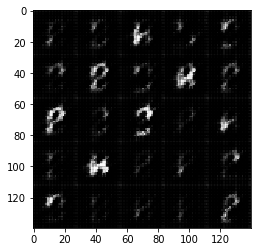

Epoch 1/2... Discriminator Loss: 3.0182 ... Generator Loss: 0.2463
Epoch 1/2... Discriminator Loss: 2.6777 ... Generator Loss: 0.2736
Epoch 1/2... Discriminator Loss: 2.2750 ... Generator Loss: 0.3328
Epoch 1/2... Discriminator Loss: 1.9153 ... Generator Loss: 0.3540
Epoch 1/2... Discriminator Loss: 1.6862 ... Generator Loss: 1.3582
Epoch 1/2... Discriminator Loss: 2.2520 ... Generator Loss: 2.5251
Epoch 1/2... Discriminator Loss: 2.3524 ... Generator Loss: 0.3854
Epoch 1/2... Discriminator Loss: 1.9345 ... Generator Loss: 0.3731
Epoch 1/2... Discriminator Loss: 1.9763 ... Generator Loss: 0.4266
Epoch 1/2... Discriminator Loss: 2.3555 ... Generator Loss: 2.1997


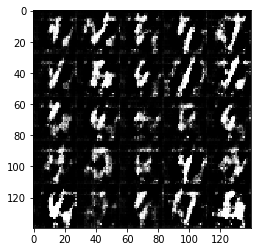

Epoch 1/2... Discriminator Loss: 2.5344 ... Generator Loss: 3.0456
Epoch 1/2... Discriminator Loss: 2.1634 ... Generator Loss: 2.3779
Epoch 1/2... Discriminator Loss: 1.6003 ... Generator Loss: 0.6896
Epoch 1/2... Discriminator Loss: 1.6385 ... Generator Loss: 0.4659
Epoch 1/2... Discriminator Loss: 1.8472 ... Generator Loss: 0.4145
Epoch 1/2... Discriminator Loss: 2.0950 ... Generator Loss: 0.3442
Epoch 1/2... Discriminator Loss: 1.3401 ... Generator Loss: 1.3402
Epoch 1/2... Discriminator Loss: 1.1148 ... Generator Loss: 1.2017
Epoch 1/2... Discriminator Loss: 1.0984 ... Generator Loss: 1.0628
Epoch 1/2... Discriminator Loss: 1.6558 ... Generator Loss: 1.2099


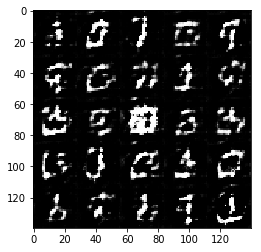

Epoch 1/2... Discriminator Loss: 1.4437 ... Generator Loss: 0.5523
Epoch 1/2... Discriminator Loss: 2.0894 ... Generator Loss: 0.3267
Epoch 1/2... Discriminator Loss: 1.3158 ... Generator Loss: 0.6884
Epoch 1/2... Discriminator Loss: 1.3882 ... Generator Loss: 1.2526
Epoch 1/2... Discriminator Loss: 1.2675 ... Generator Loss: 1.2973
Epoch 1/2... Discriminator Loss: 1.1859 ... Generator Loss: 0.8672
Epoch 1/2... Discriminator Loss: 1.6335 ... Generator Loss: 1.4997
Epoch 1/2... Discriminator Loss: 1.6393 ... Generator Loss: 0.4424
Epoch 1/2... Discriminator Loss: 2.3762 ... Generator Loss: 0.3055
Epoch 1/2... Discriminator Loss: 1.8978 ... Generator Loss: 1.8626


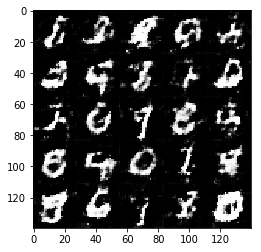

Epoch 1/2... Discriminator Loss: 1.7063 ... Generator Loss: 1.7407
Epoch 1/2... Discriminator Loss: 1.5403 ... Generator Loss: 1.5046
Epoch 1/2... Discriminator Loss: 2.1266 ... Generator Loss: 2.2369
Epoch 1/2... Discriminator Loss: 1.5159 ... Generator Loss: 1.6565
Epoch 1/2... Discriminator Loss: 1.2184 ... Generator Loss: 0.9725
Epoch 1/2... Discriminator Loss: 1.8905 ... Generator Loss: 0.5131
Epoch 1/2... Discriminator Loss: 1.3851 ... Generator Loss: 0.8066
Epoch 1/2... Discriminator Loss: 1.5227 ... Generator Loss: 0.5297
Epoch 1/2... Discriminator Loss: 1.3801 ... Generator Loss: 0.6788
Epoch 1/2... Discriminator Loss: 1.4191 ... Generator Loss: 0.9421


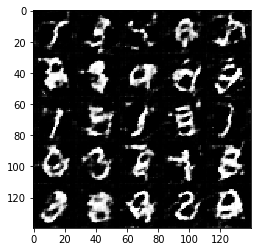

Epoch 1/2... Discriminator Loss: 1.6692 ... Generator Loss: 1.5815
Epoch 1/2... Discriminator Loss: 1.4583 ... Generator Loss: 0.7945
Epoch 1/2... Discriminator Loss: 1.4236 ... Generator Loss: 0.6344
Epoch 1/2... Discriminator Loss: 1.3312 ... Generator Loss: 0.9746
Epoch 1/2... Discriminator Loss: 1.7853 ... Generator Loss: 1.5748
Epoch 1/2... Discriminator Loss: 1.5302 ... Generator Loss: 1.2967
Epoch 1/2... Discriminator Loss: 1.7528 ... Generator Loss: 1.1959
Epoch 1/2... Discriminator Loss: 1.3483 ... Generator Loss: 0.7990
Epoch 1/2... Discriminator Loss: 1.5377 ... Generator Loss: 0.8090
Epoch 1/2... Discriminator Loss: 1.3362 ... Generator Loss: 0.9682


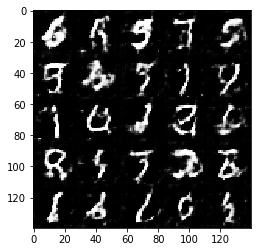

Epoch 1/2... Discriminator Loss: 1.4189 ... Generator Loss: 1.0597
Epoch 1/2... Discriminator Loss: 1.8668 ... Generator Loss: 0.4820
Epoch 1/2... Discriminator Loss: 1.3656 ... Generator Loss: 0.5910
Epoch 1/2... Discriminator Loss: 1.3836 ... Generator Loss: 0.7301
Epoch 1/2... Discriminator Loss: 1.3854 ... Generator Loss: 0.7909
Epoch 1/2... Discriminator Loss: 1.6554 ... Generator Loss: 0.4325
Epoch 1/2... Discriminator Loss: 1.4343 ... Generator Loss: 0.6403
Epoch 1/2... Discriminator Loss: 1.4962 ... Generator Loss: 0.9248
Epoch 1/2... Discriminator Loss: 1.4310 ... Generator Loss: 0.4955
Epoch 1/2... Discriminator Loss: 1.4991 ... Generator Loss: 0.5661


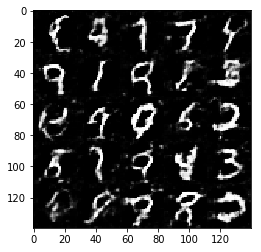

Epoch 1/2... Discriminator Loss: 1.8361 ... Generator Loss: 0.3150
Epoch 1/2... Discriminator Loss: 1.5326 ... Generator Loss: 0.4605
Epoch 1/2... Discriminator Loss: 1.4517 ... Generator Loss: 0.5847
Epoch 1/2... Discriminator Loss: 1.4066 ... Generator Loss: 1.2708
Epoch 1/2... Discriminator Loss: 1.4457 ... Generator Loss: 0.5235
Epoch 1/2... Discriminator Loss: 1.6944 ... Generator Loss: 0.4156
Epoch 1/2... Discriminator Loss: 1.5165 ... Generator Loss: 0.6382
Epoch 1/2... Discriminator Loss: 1.3965 ... Generator Loss: 0.8165
Epoch 1/2... Discriminator Loss: 1.4098 ... Generator Loss: 0.5544
Epoch 1/2... Discriminator Loss: 2.2002 ... Generator Loss: 1.9311


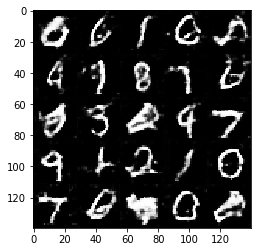

Epoch 1/2... Discriminator Loss: 1.5285 ... Generator Loss: 1.1711
Epoch 1/2... Discriminator Loss: 1.5131 ... Generator Loss: 0.4518
Epoch 1/2... Discriminator Loss: 1.3453 ... Generator Loss: 0.8211
Epoch 1/2... Discriminator Loss: 1.6493 ... Generator Loss: 0.5298
Epoch 1/2... Discriminator Loss: 1.3900 ... Generator Loss: 0.6846
Epoch 1/2... Discriminator Loss: 1.6075 ... Generator Loss: 0.4387
Epoch 1/2... Discriminator Loss: 1.3683 ... Generator Loss: 0.6308
Epoch 1/2... Discriminator Loss: 1.9781 ... Generator Loss: 0.3339
Epoch 1/2... Discriminator Loss: 1.4166 ... Generator Loss: 0.6695
Epoch 1/2... Discriminator Loss: 1.4567 ... Generator Loss: 0.5532


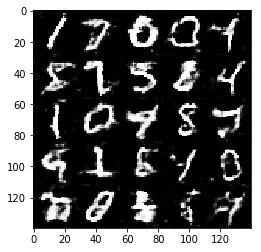

Epoch 1/2... Discriminator Loss: 1.3630 ... Generator Loss: 0.6771
Epoch 1/2... Discriminator Loss: 2.2419 ... Generator Loss: 0.2897
Epoch 1/2... Discriminator Loss: 1.4317 ... Generator Loss: 0.7215
Epoch 2/2... Discriminator Loss: 1.4688 ... Generator Loss: 0.4908
Epoch 2/2... Discriminator Loss: 1.5012 ... Generator Loss: 0.5123
Epoch 2/2... Discriminator Loss: 1.3757 ... Generator Loss: 0.6024
Epoch 2/2... Discriminator Loss: 1.3286 ... Generator Loss: 0.9059
Epoch 2/2... Discriminator Loss: 1.5255 ... Generator Loss: 0.8293
Epoch 2/2... Discriminator Loss: 1.6874 ... Generator Loss: 0.3987
Epoch 2/2... Discriminator Loss: 1.3894 ... Generator Loss: 0.5030


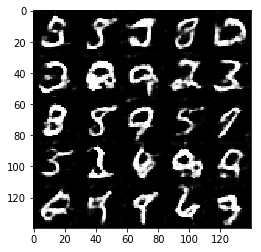

Epoch 2/2... Discriminator Loss: 1.4273 ... Generator Loss: 0.5247
Epoch 2/2... Discriminator Loss: 1.7289 ... Generator Loss: 0.4187
Epoch 2/2... Discriminator Loss: 1.3715 ... Generator Loss: 0.7285
Epoch 2/2... Discriminator Loss: 1.3036 ... Generator Loss: 0.8187
Epoch 2/2... Discriminator Loss: 1.3984 ... Generator Loss: 0.6461
Epoch 2/2... Discriminator Loss: 1.4285 ... Generator Loss: 0.6178
Epoch 2/2... Discriminator Loss: 1.3566 ... Generator Loss: 0.6974
Epoch 2/2... Discriminator Loss: 1.3523 ... Generator Loss: 0.7000
Epoch 2/2... Discriminator Loss: 1.3143 ... Generator Loss: 0.6851
Epoch 2/2... Discriminator Loss: 1.5948 ... Generator Loss: 0.4770


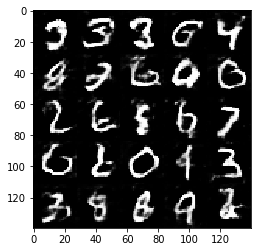

Epoch 2/2... Discriminator Loss: 1.3569 ... Generator Loss: 1.1020
Epoch 2/2... Discriminator Loss: 1.4626 ... Generator Loss: 0.9006
Epoch 2/2... Discriminator Loss: 1.5156 ... Generator Loss: 1.1546
Epoch 2/2... Discriminator Loss: 1.9050 ... Generator Loss: 0.5951
Epoch 2/2... Discriminator Loss: 1.4639 ... Generator Loss: 0.4856
Epoch 2/2... Discriminator Loss: 1.3757 ... Generator Loss: 0.7976
Epoch 2/2... Discriminator Loss: 1.1931 ... Generator Loss: 0.7302
Epoch 2/2... Discriminator Loss: 1.4162 ... Generator Loss: 1.0390
Epoch 2/2... Discriminator Loss: 1.6054 ... Generator Loss: 1.4214
Epoch 2/2... Discriminator Loss: 1.5904 ... Generator Loss: 0.4471


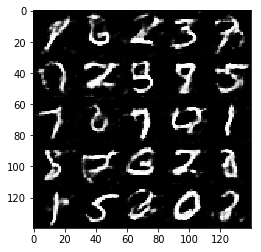

Epoch 2/2... Discriminator Loss: 1.4916 ... Generator Loss: 1.1314
Epoch 2/2... Discriminator Loss: 1.3395 ... Generator Loss: 1.0116
Epoch 2/2... Discriminator Loss: 1.3276 ... Generator Loss: 0.7367
Epoch 2/2... Discriminator Loss: 1.5028 ... Generator Loss: 0.9305
Epoch 2/2... Discriminator Loss: 1.6069 ... Generator Loss: 0.4584
Epoch 2/2... Discriminator Loss: 1.2951 ... Generator Loss: 0.8417
Epoch 2/2... Discriminator Loss: 1.3066 ... Generator Loss: 0.8825
Epoch 2/2... Discriminator Loss: 1.3844 ... Generator Loss: 0.5433
Epoch 2/2... Discriminator Loss: 1.3505 ... Generator Loss: 0.8215
Epoch 2/2... Discriminator Loss: 1.2858 ... Generator Loss: 0.8565


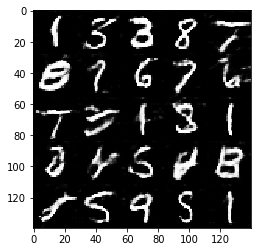

Epoch 2/2... Discriminator Loss: 1.5596 ... Generator Loss: 1.4250
Epoch 2/2... Discriminator Loss: 1.4886 ... Generator Loss: 1.2134
Epoch 2/2... Discriminator Loss: 1.6480 ... Generator Loss: 0.5266
Epoch 2/2... Discriminator Loss: 1.7501 ... Generator Loss: 0.4209
Epoch 2/2... Discriminator Loss: 1.5758 ... Generator Loss: 0.4579
Epoch 2/2... Discriminator Loss: 1.4766 ... Generator Loss: 1.2046
Epoch 2/2... Discriminator Loss: 1.4675 ... Generator Loss: 0.5252
Epoch 2/2... Discriminator Loss: 1.4048 ... Generator Loss: 0.4995
Epoch 2/2... Discriminator Loss: 1.3662 ... Generator Loss: 0.7853
Epoch 2/2... Discriminator Loss: 1.5461 ... Generator Loss: 1.4446


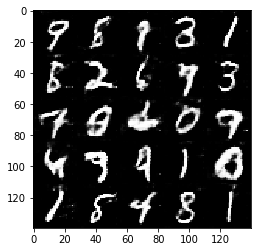

Epoch 2/2... Discriminator Loss: 1.3331 ... Generator Loss: 0.7053
Epoch 2/2... Discriminator Loss: 1.6168 ... Generator Loss: 0.5430
Epoch 2/2... Discriminator Loss: 1.4394 ... Generator Loss: 0.8074
Epoch 2/2... Discriminator Loss: 1.3096 ... Generator Loss: 0.8258
Epoch 2/2... Discriminator Loss: 1.3226 ... Generator Loss: 0.6465
Epoch 2/2... Discriminator Loss: 1.2621 ... Generator Loss: 0.6397
Epoch 2/2... Discriminator Loss: 1.5247 ... Generator Loss: 0.5202
Epoch 2/2... Discriminator Loss: 1.4046 ... Generator Loss: 0.9111
Epoch 2/2... Discriminator Loss: 1.3064 ... Generator Loss: 0.8819
Epoch 2/2... Discriminator Loss: 1.5350 ... Generator Loss: 0.5635


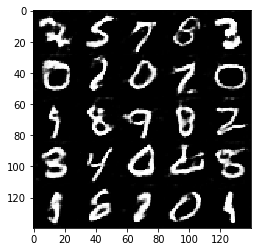

Epoch 2/2... Discriminator Loss: 1.5631 ... Generator Loss: 1.1935
Epoch 2/2... Discriminator Loss: 1.4521 ... Generator Loss: 1.1832
Epoch 2/2... Discriminator Loss: 1.3277 ... Generator Loss: 0.6328
Epoch 2/2... Discriminator Loss: 1.3569 ... Generator Loss: 0.6671
Epoch 2/2... Discriminator Loss: 1.2796 ... Generator Loss: 0.6488
Epoch 2/2... Discriminator Loss: 1.3168 ... Generator Loss: 1.0082
Epoch 2/2... Discriminator Loss: 1.4328 ... Generator Loss: 0.4646
Epoch 2/2... Discriminator Loss: 1.2815 ... Generator Loss: 0.6534
Epoch 2/2... Discriminator Loss: 1.3181 ... Generator Loss: 0.8209
Epoch 2/2... Discriminator Loss: 1.4985 ... Generator Loss: 0.4501


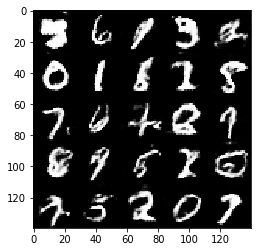

Epoch 2/2... Discriminator Loss: 1.3646 ... Generator Loss: 0.5319
Epoch 2/2... Discriminator Loss: 1.3392 ... Generator Loss: 0.7077
Epoch 2/2... Discriminator Loss: 1.4411 ... Generator Loss: 1.0616
Epoch 2/2... Discriminator Loss: 1.2276 ... Generator Loss: 0.7989
Epoch 2/2... Discriminator Loss: 1.3091 ... Generator Loss: 1.0430
Epoch 2/2... Discriminator Loss: 1.3481 ... Generator Loss: 0.7424
Epoch 2/2... Discriminator Loss: 1.4691 ... Generator Loss: 1.2004
Epoch 2/2... Discriminator Loss: 1.3193 ... Generator Loss: 0.6171
Epoch 2/2... Discriminator Loss: 1.3012 ... Generator Loss: 1.0477
Epoch 2/2... Discriminator Loss: 1.3791 ... Generator Loss: 0.6945


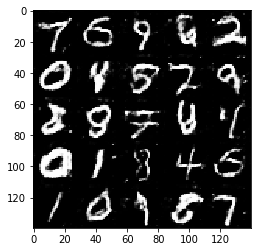

Epoch 2/2... Discriminator Loss: 1.4232 ... Generator Loss: 0.7999
Epoch 2/2... Discriminator Loss: 1.2945 ... Generator Loss: 1.1515
Epoch 2/2... Discriminator Loss: 1.5378 ... Generator Loss: 1.1821
Epoch 2/2... Discriminator Loss: 1.4099 ... Generator Loss: 1.1899
Epoch 2/2... Discriminator Loss: 1.7764 ... Generator Loss: 1.5644
Epoch 2/2... Discriminator Loss: 1.2644 ... Generator Loss: 0.7865
Epoch 2/2... Discriminator Loss: 1.3636 ... Generator Loss: 0.7412
Epoch 2/2... Discriminator Loss: 1.4243 ... Generator Loss: 0.4984
Epoch 2/2... Discriminator Loss: 1.3078 ... Generator Loss: 0.6517
Epoch 2/2... Discriminator Loss: 1.3730 ... Generator Loss: 0.7102


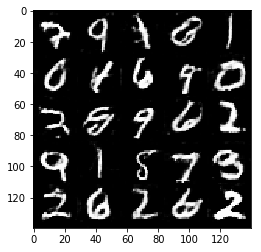

Epoch 2/2... Discriminator Loss: 1.4349 ... Generator Loss: 0.6539
Epoch 2/2... Discriminator Loss: 1.3573 ... Generator Loss: 1.3143
Epoch 2/2... Discriminator Loss: 1.4752 ... Generator Loss: 0.9159
Epoch 2/2... Discriminator Loss: 1.3727 ... Generator Loss: 0.8778
Epoch 2/2... Discriminator Loss: 1.3442 ... Generator Loss: 0.7236
Epoch 2/2... Discriminator Loss: 1.3233 ... Generator Loss: 1.1622
Epoch 2/2... Discriminator Loss: 1.3105 ... Generator Loss: 1.0535


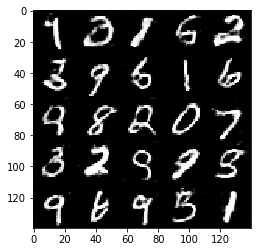

In [25]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.1

# https://discussions.udacity.com/t/project-facegeneration-indexerror-list-index-out-of-range/246401
tf.reset_default_graph()

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/7... Discriminator Loss: 2.3826 ... Generator Loss: 6.1279
Epoch 1/7... Discriminator Loss: 2.8509 ... Generator Loss: 7.5265
Epoch 1/7... Discriminator Loss: 2.1837 ... Generator Loss: 0.4122
Epoch 1/7... Discriminator Loss: 2.0256 ... Generator Loss: 0.4613
Epoch 1/7... Discriminator Loss: 0.8225 ... Generator Loss: 4.5436
Epoch 1/7... Discriminator Loss: 2.1783 ... Generator Loss: 10.2546
Epoch 1/7... Discriminator Loss: 0.7377 ... Generator Loss: 4.0551
Epoch 1/7... Discriminator Loss: 0.9421 ... Generator Loss: 1.1513
Epoch 1/7... Discriminator Loss: 1.4168 ... Generator Loss: 4.7634
Epoch 1/7... Discriminator Loss: 1.1221 ... Generator Loss: 1.6562


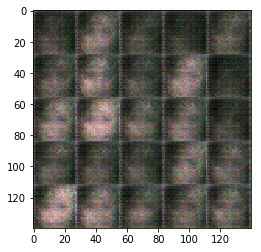

Epoch 1/7... Discriminator Loss: 1.3470 ... Generator Loss: 2.3797
Epoch 1/7... Discriminator Loss: 1.3924 ... Generator Loss: 1.7030
Epoch 1/7... Discriminator Loss: 1.7950 ... Generator Loss: 3.5015
Epoch 1/7... Discriminator Loss: 1.6547 ... Generator Loss: 2.8793
Epoch 1/7... Discriminator Loss: 1.9603 ... Generator Loss: 3.7500
Epoch 1/7... Discriminator Loss: 1.2141 ... Generator Loss: 1.4755
Epoch 1/7... Discriminator Loss: 1.0179 ... Generator Loss: 1.3395
Epoch 1/7... Discriminator Loss: 1.6813 ... Generator Loss: 0.5757
Epoch 1/7... Discriminator Loss: 1.2759 ... Generator Loss: 0.8400
Epoch 1/7... Discriminator Loss: 1.2466 ... Generator Loss: 0.8477


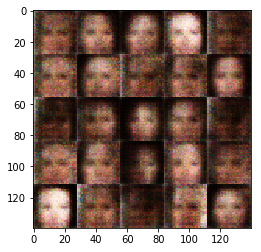

Epoch 1/7... Discriminator Loss: 1.7114 ... Generator Loss: 0.6457
Epoch 1/7... Discriminator Loss: 1.4242 ... Generator Loss: 0.7253
Epoch 1/7... Discriminator Loss: 1.1886 ... Generator Loss: 0.9024
Epoch 1/7... Discriminator Loss: 1.4863 ... Generator Loss: 1.9745
Epoch 1/7... Discriminator Loss: 1.5548 ... Generator Loss: 2.3807
Epoch 1/7... Discriminator Loss: 1.6472 ... Generator Loss: 2.5005
Epoch 1/7... Discriminator Loss: 1.5836 ... Generator Loss: 1.5684
Epoch 1/7... Discriminator Loss: 1.5558 ... Generator Loss: 2.2312
Epoch 1/7... Discriminator Loss: 1.5970 ... Generator Loss: 1.9763
Epoch 1/7... Discriminator Loss: 1.5265 ... Generator Loss: 0.6326


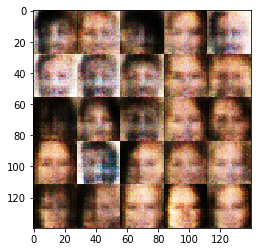

Epoch 1/7... Discriminator Loss: 1.2515 ... Generator Loss: 1.5361
Epoch 1/7... Discriminator Loss: 1.2534 ... Generator Loss: 0.9873
Epoch 1/7... Discriminator Loss: 1.6102 ... Generator Loss: 2.1902
Epoch 1/7... Discriminator Loss: 1.2080 ... Generator Loss: 1.6880
Epoch 1/7... Discriminator Loss: 1.8611 ... Generator Loss: 2.5843
Epoch 1/7... Discriminator Loss: 1.1188 ... Generator Loss: 2.1446
Epoch 1/7... Discriminator Loss: 1.4294 ... Generator Loss: 1.8414
Epoch 1/7... Discriminator Loss: 1.0246 ... Generator Loss: 1.6543
Epoch 1/7... Discriminator Loss: 1.1729 ... Generator Loss: 1.8983
Epoch 1/7... Discriminator Loss: 1.2938 ... Generator Loss: 2.3779


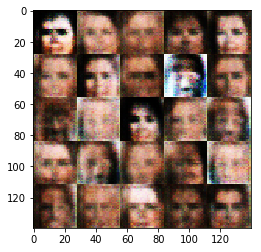

Epoch 1/7... Discriminator Loss: 1.6057 ... Generator Loss: 2.3633
Epoch 1/7... Discriminator Loss: 1.0809 ... Generator Loss: 1.3467
Epoch 1/7... Discriminator Loss: 1.1635 ... Generator Loss: 1.7253
Epoch 1/7... Discriminator Loss: 1.3835 ... Generator Loss: 1.3895
Epoch 1/7... Discriminator Loss: 1.6308 ... Generator Loss: 2.7316
Epoch 1/7... Discriminator Loss: 1.4934 ... Generator Loss: 2.3900
Epoch 1/7... Discriminator Loss: 1.0079 ... Generator Loss: 0.9891
Epoch 1/7... Discriminator Loss: 1.1383 ... Generator Loss: 0.9945
Epoch 1/7... Discriminator Loss: 0.9400 ... Generator Loss: 1.4737
Epoch 1/7... Discriminator Loss: 1.2582 ... Generator Loss: 1.9942


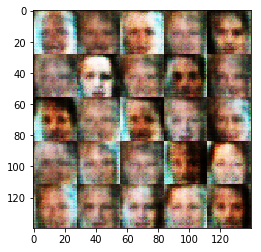

Epoch 1/7... Discriminator Loss: 1.7721 ... Generator Loss: 3.0134
Epoch 1/7... Discriminator Loss: 1.3943 ... Generator Loss: 0.7143
Epoch 1/7... Discriminator Loss: 1.3931 ... Generator Loss: 0.5807
Epoch 1/7... Discriminator Loss: 1.2857 ... Generator Loss: 2.0513
Epoch 1/7... Discriminator Loss: 1.2465 ... Generator Loss: 1.5578
Epoch 1/7... Discriminator Loss: 1.1193 ... Generator Loss: 1.1498
Epoch 1/7... Discriminator Loss: 1.0771 ... Generator Loss: 1.2967
Epoch 1/7... Discriminator Loss: 1.1519 ... Generator Loss: 1.3081
Epoch 1/7... Discriminator Loss: 1.1065 ... Generator Loss: 1.1982
Epoch 1/7... Discriminator Loss: 1.1060 ... Generator Loss: 2.0239


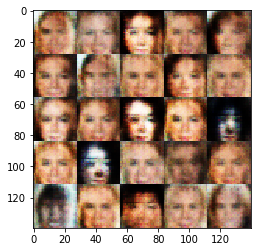

Epoch 1/7... Discriminator Loss: 1.7080 ... Generator Loss: 0.4198
Epoch 1/7... Discriminator Loss: 1.3111 ... Generator Loss: 1.6910
Epoch 1/7... Discriminator Loss: 1.3686 ... Generator Loss: 1.3963
Epoch 1/7... Discriminator Loss: 1.0047 ... Generator Loss: 1.0539
Epoch 1/7... Discriminator Loss: 1.4815 ... Generator Loss: 2.0747
Epoch 1/7... Discriminator Loss: 1.2775 ... Generator Loss: 0.5231
Epoch 1/7... Discriminator Loss: 1.2947 ... Generator Loss: 0.5903
Epoch 1/7... Discriminator Loss: 1.2641 ... Generator Loss: 0.8798
Epoch 1/7... Discriminator Loss: 1.1812 ... Generator Loss: 1.5293
Epoch 1/7... Discriminator Loss: 1.0180 ... Generator Loss: 1.1169


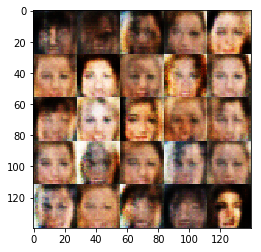

Epoch 1/7... Discriminator Loss: 1.2635 ... Generator Loss: 1.2200
Epoch 1/7... Discriminator Loss: 1.2623 ... Generator Loss: 0.9674
Epoch 1/7... Discriminator Loss: 1.3722 ... Generator Loss: 0.6588
Epoch 1/7... Discriminator Loss: 1.4531 ... Generator Loss: 0.6438
Epoch 1/7... Discriminator Loss: 1.2006 ... Generator Loss: 1.3689
Epoch 1/7... Discriminator Loss: 1.2956 ... Generator Loss: 0.7575
Epoch 1/7... Discriminator Loss: 1.3042 ... Generator Loss: 0.5072
Epoch 1/7... Discriminator Loss: 1.3971 ... Generator Loss: 1.7820
Epoch 1/7... Discriminator Loss: 1.0890 ... Generator Loss: 1.1853
Epoch 1/7... Discriminator Loss: 1.1328 ... Generator Loss: 0.8539


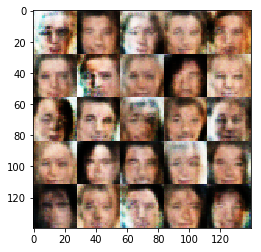

Epoch 1/7... Discriminator Loss: 1.1372 ... Generator Loss: 0.9900
Epoch 1/7... Discriminator Loss: 1.8016 ... Generator Loss: 0.4605
Epoch 1/7... Discriminator Loss: 1.0586 ... Generator Loss: 0.9986
Epoch 1/7... Discriminator Loss: 1.3416 ... Generator Loss: 1.2634
Epoch 1/7... Discriminator Loss: 1.3438 ... Generator Loss: 1.8722
Epoch 1/7... Discriminator Loss: 1.0658 ... Generator Loss: 1.2723
Epoch 1/7... Discriminator Loss: 1.2622 ... Generator Loss: 1.3003
Epoch 1/7... Discriminator Loss: 1.1962 ... Generator Loss: 0.8554
Epoch 1/7... Discriminator Loss: 1.5040 ... Generator Loss: 1.8099
Epoch 1/7... Discriminator Loss: 1.4171 ... Generator Loss: 1.5642


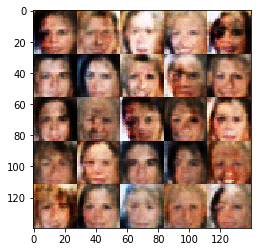

Epoch 1/7... Discriminator Loss: 0.9962 ... Generator Loss: 1.2661
Epoch 1/7... Discriminator Loss: 1.5700 ... Generator Loss: 2.1363
Epoch 1/7... Discriminator Loss: 1.2664 ... Generator Loss: 1.0421
Epoch 1/7... Discriminator Loss: 1.2926 ... Generator Loss: 0.6138
Epoch 1/7... Discriminator Loss: 1.0994 ... Generator Loss: 0.9157
Epoch 1/7... Discriminator Loss: 1.4260 ... Generator Loss: 1.6618
Epoch 1/7... Discriminator Loss: 1.1533 ... Generator Loss: 0.7036
Epoch 1/7... Discriminator Loss: 1.5417 ... Generator Loss: 0.4998
Epoch 1/7... Discriminator Loss: 1.1919 ... Generator Loss: 0.8630
Epoch 1/7... Discriminator Loss: 1.0895 ... Generator Loss: 1.3953


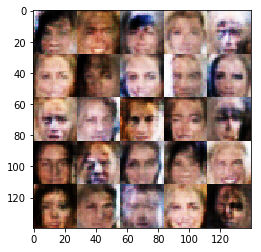

Epoch 1/7... Discriminator Loss: 1.0610 ... Generator Loss: 1.3746
Epoch 1/7... Discriminator Loss: 1.1725 ... Generator Loss: 1.6116
Epoch 1/7... Discriminator Loss: 1.4193 ... Generator Loss: 1.5528
Epoch 1/7... Discriminator Loss: 1.2845 ... Generator Loss: 1.4382
Epoch 1/7... Discriminator Loss: 1.0314 ... Generator Loss: 1.5358
Epoch 1/7... Discriminator Loss: 1.0543 ... Generator Loss: 1.1262
Epoch 1/7... Discriminator Loss: 1.0028 ... Generator Loss: 1.2645
Epoch 1/7... Discriminator Loss: 1.2992 ... Generator Loss: 0.8026
Epoch 1/7... Discriminator Loss: 1.1828 ... Generator Loss: 1.8468
Epoch 1/7... Discriminator Loss: 1.0995 ... Generator Loss: 1.0239


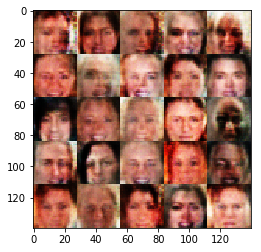

Epoch 1/7... Discriminator Loss: 1.3223 ... Generator Loss: 0.5828
Epoch 1/7... Discriminator Loss: 1.6398 ... Generator Loss: 0.4136
Epoch 1/7... Discriminator Loss: 1.8672 ... Generator Loss: 0.3919
Epoch 1/7... Discriminator Loss: 1.7769 ... Generator Loss: 0.3979
Epoch 1/7... Discriminator Loss: 1.2350 ... Generator Loss: 0.9032
Epoch 1/7... Discriminator Loss: 1.5360 ... Generator Loss: 0.4937
Epoch 1/7... Discriminator Loss: 1.2919 ... Generator Loss: 0.6230
Epoch 1/7... Discriminator Loss: 1.4056 ... Generator Loss: 0.5576
Epoch 1/7... Discriminator Loss: 1.6548 ... Generator Loss: 0.4516
Epoch 1/7... Discriminator Loss: 1.4183 ... Generator Loss: 0.4820


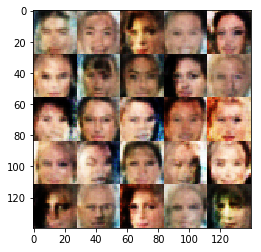

Epoch 1/7... Discriminator Loss: 1.5235 ... Generator Loss: 0.5008
Epoch 1/7... Discriminator Loss: 1.4880 ... Generator Loss: 0.5220
Epoch 1/7... Discriminator Loss: 1.2506 ... Generator Loss: 0.5543
Epoch 1/7... Discriminator Loss: 1.5600 ... Generator Loss: 0.4279
Epoch 1/7... Discriminator Loss: 1.2182 ... Generator Loss: 0.7768
Epoch 1/7... Discriminator Loss: 1.0177 ... Generator Loss: 1.3768
Epoch 1/7... Discriminator Loss: 1.2252 ... Generator Loss: 2.3515
Epoch 1/7... Discriminator Loss: 1.4577 ... Generator Loss: 2.1735
Epoch 1/7... Discriminator Loss: 1.1122 ... Generator Loss: 0.8290
Epoch 1/7... Discriminator Loss: 1.5002 ... Generator Loss: 0.4792


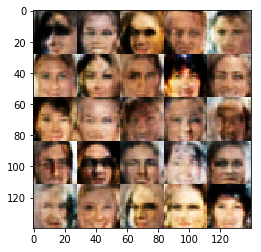

Epoch 1/7... Discriminator Loss: 1.4009 ... Generator Loss: 0.5659
Epoch 1/7... Discriminator Loss: 0.9488 ... Generator Loss: 1.3331
Epoch 1/7... Discriminator Loss: 0.9730 ... Generator Loss: 1.6146
Epoch 1/7... Discriminator Loss: 1.1973 ... Generator Loss: 1.7205
Epoch 1/7... Discriminator Loss: 0.9868 ... Generator Loss: 1.6033
Epoch 1/7... Discriminator Loss: 1.0796 ... Generator Loss: 1.8925
Epoch 1/7... Discriminator Loss: 1.4335 ... Generator Loss: 0.4889
Epoch 1/7... Discriminator Loss: 1.0446 ... Generator Loss: 0.8551
Epoch 1/7... Discriminator Loss: 1.0118 ... Generator Loss: 0.8694
Epoch 1/7... Discriminator Loss: 1.5064 ... Generator Loss: 0.4403


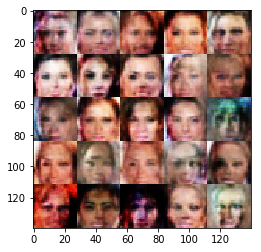

Epoch 1/7... Discriminator Loss: 1.2964 ... Generator Loss: 0.6544
Epoch 1/7... Discriminator Loss: 1.2970 ... Generator Loss: 2.5957
Epoch 1/7... Discriminator Loss: 1.3115 ... Generator Loss: 0.5459
Epoch 1/7... Discriminator Loss: 1.0868 ... Generator Loss: 1.7902
Epoch 1/7... Discriminator Loss: 1.0218 ... Generator Loss: 1.3648
Epoch 1/7... Discriminator Loss: 1.3438 ... Generator Loss: 0.5758
Epoch 1/7... Discriminator Loss: 1.4833 ... Generator Loss: 0.4400
Epoch 1/7... Discriminator Loss: 1.2595 ... Generator Loss: 0.6069
Epoch 1/7... Discriminator Loss: 1.3553 ... Generator Loss: 0.5552
Epoch 1/7... Discriminator Loss: 1.0354 ... Generator Loss: 1.7648


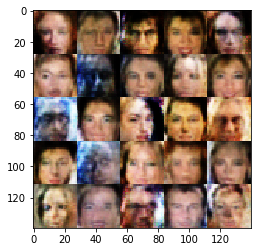

Epoch 1/7... Discriminator Loss: 1.1544 ... Generator Loss: 1.2948
Epoch 1/7... Discriminator Loss: 1.1850 ... Generator Loss: 1.8452
Epoch 1/7... Discriminator Loss: 1.5967 ... Generator Loss: 0.4197
Epoch 1/7... Discriminator Loss: 1.2503 ... Generator Loss: 0.6830
Epoch 1/7... Discriminator Loss: 1.4741 ... Generator Loss: 0.4443
Epoch 1/7... Discriminator Loss: 1.3391 ... Generator Loss: 0.4802
Epoch 1/7... Discriminator Loss: 1.0782 ... Generator Loss: 2.1059
Epoch 1/7... Discriminator Loss: 1.1248 ... Generator Loss: 1.1192
Epoch 1/7... Discriminator Loss: 1.4729 ... Generator Loss: 1.7328
Epoch 1/7... Discriminator Loss: 1.1376 ... Generator Loss: 1.5845


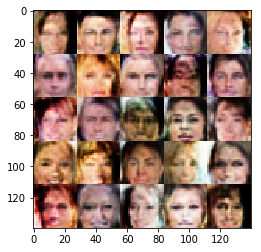

Epoch 1/7... Discriminator Loss: 1.2478 ... Generator Loss: 0.8696
Epoch 1/7... Discriminator Loss: 1.3853 ... Generator Loss: 0.5276
Epoch 1/7... Discriminator Loss: 1.6322 ... Generator Loss: 0.4499
Epoch 1/7... Discriminator Loss: 1.2535 ... Generator Loss: 0.6318
Epoch 1/7... Discriminator Loss: 1.4278 ... Generator Loss: 0.5078
Epoch 1/7... Discriminator Loss: 1.5399 ... Generator Loss: 0.4540
Epoch 1/7... Discriminator Loss: 0.9207 ... Generator Loss: 1.4414
Epoch 1/7... Discriminator Loss: 1.2121 ... Generator Loss: 2.0827
Epoch 1/7... Discriminator Loss: 1.3906 ... Generator Loss: 0.5903
Epoch 1/7... Discriminator Loss: 1.2699 ... Generator Loss: 0.6282


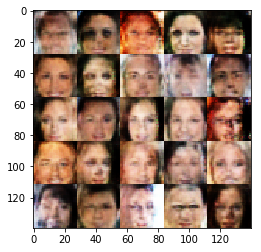

Epoch 1/7... Discriminator Loss: 1.0159 ... Generator Loss: 1.2947
Epoch 1/7... Discriminator Loss: 0.9786 ... Generator Loss: 1.2486
Epoch 1/7... Discriminator Loss: 1.1388 ... Generator Loss: 1.4118
Epoch 1/7... Discriminator Loss: 1.1958 ... Generator Loss: 0.8754
Epoch 1/7... Discriminator Loss: 1.6532 ... Generator Loss: 0.3967
Epoch 1/7... Discriminator Loss: 1.2358 ... Generator Loss: 0.5848
Epoch 1/7... Discriminator Loss: 1.3566 ... Generator Loss: 1.9069
Epoch 1/7... Discriminator Loss: 1.2030 ... Generator Loss: 1.7110
Epoch 1/7... Discriminator Loss: 1.1663 ... Generator Loss: 1.5041
Epoch 1/7... Discriminator Loss: 1.1828 ... Generator Loss: 0.8458


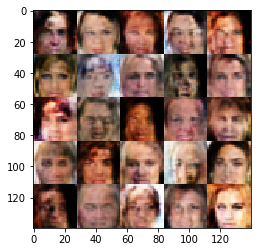

Epoch 1/7... Discriminator Loss: 1.2858 ... Generator Loss: 0.5801
Epoch 1/7... Discriminator Loss: 1.3449 ... Generator Loss: 2.1334
Epoch 1/7... Discriminator Loss: 1.0998 ... Generator Loss: 1.3809
Epoch 1/7... Discriminator Loss: 1.2066 ... Generator Loss: 1.7828
Epoch 1/7... Discriminator Loss: 1.0556 ... Generator Loss: 0.9369
Epoch 1/7... Discriminator Loss: 1.3777 ... Generator Loss: 0.4975
Epoch 1/7... Discriminator Loss: 1.0483 ... Generator Loss: 1.4218
Epoch 1/7... Discriminator Loss: 1.1862 ... Generator Loss: 0.7418
Epoch 1/7... Discriminator Loss: 0.9730 ... Generator Loss: 1.2921
Epoch 1/7... Discriminator Loss: 1.2391 ... Generator Loss: 1.5563


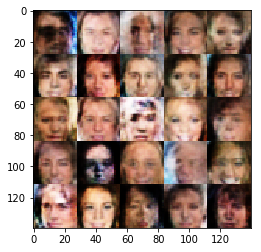

Epoch 1/7... Discriminator Loss: 1.5126 ... Generator Loss: 0.4561
Epoch 1/7... Discriminator Loss: 1.5069 ... Generator Loss: 0.5084
Epoch 1/7... Discriminator Loss: 1.2389 ... Generator Loss: 1.8377
Epoch 1/7... Discriminator Loss: 0.9312 ... Generator Loss: 1.0984
Epoch 1/7... Discriminator Loss: 1.4934 ... Generator Loss: 0.5084
Epoch 1/7... Discriminator Loss: 1.1850 ... Generator Loss: 0.8327
Epoch 1/7... Discriminator Loss: 1.6563 ... Generator Loss: 0.4355
Epoch 1/7... Discriminator Loss: 1.2142 ... Generator Loss: 0.6561
Epoch 1/7... Discriminator Loss: 1.1261 ... Generator Loss: 0.9005
Epoch 1/7... Discriminator Loss: 1.3363 ... Generator Loss: 0.5905


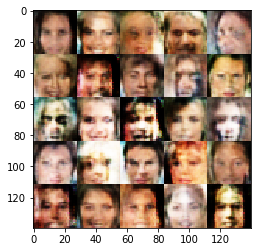

Epoch 1/7... Discriminator Loss: 1.5555 ... Generator Loss: 0.3946
Epoch 1/7... Discriminator Loss: 0.9187 ... Generator Loss: 1.4497
Epoch 1/7... Discriminator Loss: 1.1644 ... Generator Loss: 1.1630
Epoch 1/7... Discriminator Loss: 1.4393 ... Generator Loss: 2.0371
Epoch 1/7... Discriminator Loss: 1.2843 ... Generator Loss: 1.5074
Epoch 1/7... Discriminator Loss: 1.0716 ... Generator Loss: 0.9898
Epoch 1/7... Discriminator Loss: 1.1254 ... Generator Loss: 1.4743
Epoch 1/7... Discriminator Loss: 1.1384 ... Generator Loss: 0.8134
Epoch 1/7... Discriminator Loss: 1.2794 ... Generator Loss: 0.5936
Epoch 1/7... Discriminator Loss: 1.2885 ... Generator Loss: 1.1195


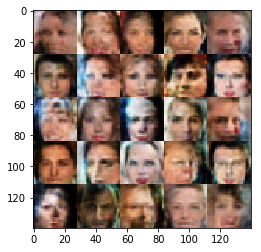

Epoch 1/7... Discriminator Loss: 1.5770 ... Generator Loss: 2.0689
Epoch 1/7... Discriminator Loss: 1.0926 ... Generator Loss: 1.3907
Epoch 1/7... Discriminator Loss: 0.9645 ... Generator Loss: 1.8448
Epoch 1/7... Discriminator Loss: 1.3514 ... Generator Loss: 1.5689
Epoch 1/7... Discriminator Loss: 0.9511 ... Generator Loss: 1.2697
Epoch 1/7... Discriminator Loss: 1.1277 ... Generator Loss: 0.9129
Epoch 1/7... Discriminator Loss: 1.3512 ... Generator Loss: 0.6382
Epoch 1/7... Discriminator Loss: 1.0159 ... Generator Loss: 1.1610
Epoch 1/7... Discriminator Loss: 1.1419 ... Generator Loss: 1.2316
Epoch 1/7... Discriminator Loss: 1.1712 ... Generator Loss: 0.7900


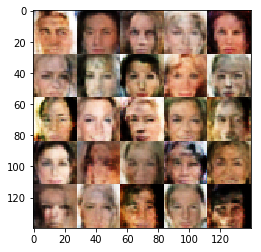

Epoch 1/7... Discriminator Loss: 1.4339 ... Generator Loss: 0.5069
Epoch 1/7... Discriminator Loss: 1.2579 ... Generator Loss: 0.7044
Epoch 1/7... Discriminator Loss: 1.2335 ... Generator Loss: 0.6075
Epoch 1/7... Discriminator Loss: 1.2955 ... Generator Loss: 0.6277
Epoch 1/7... Discriminator Loss: 1.4226 ... Generator Loss: 0.4302
Epoch 1/7... Discriminator Loss: 1.1313 ... Generator Loss: 0.8598
Epoch 1/7... Discriminator Loss: 1.3749 ... Generator Loss: 0.5313
Epoch 1/7... Discriminator Loss: 1.3437 ... Generator Loss: 0.5220
Epoch 1/7... Discriminator Loss: 1.3941 ... Generator Loss: 0.4311
Epoch 1/7... Discriminator Loss: 1.4072 ... Generator Loss: 0.6217


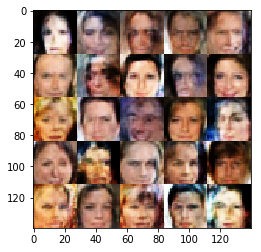

Epoch 1/7... Discriminator Loss: 1.0816 ... Generator Loss: 0.7982
Epoch 1/7... Discriminator Loss: 1.4568 ... Generator Loss: 0.5380
Epoch 1/7... Discriminator Loss: 1.4093 ... Generator Loss: 0.5879
Epoch 1/7... Discriminator Loss: 1.2254 ... Generator Loss: 0.7622
Epoch 1/7... Discriminator Loss: 1.8592 ... Generator Loss: 0.4225
Epoch 1/7... Discriminator Loss: 1.3063 ... Generator Loss: 0.6692
Epoch 1/7... Discriminator Loss: 1.4167 ... Generator Loss: 0.4539
Epoch 1/7... Discriminator Loss: 0.9418 ... Generator Loss: 1.9415
Epoch 1/7... Discriminator Loss: 1.0531 ... Generator Loss: 1.4295
Epoch 1/7... Discriminator Loss: 1.1047 ... Generator Loss: 0.7991


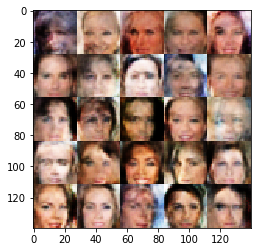

Epoch 1/7... Discriminator Loss: 1.3277 ... Generator Loss: 0.6082
Epoch 1/7... Discriminator Loss: 1.1892 ... Generator Loss: 0.6694
Epoch 1/7... Discriminator Loss: 1.5314 ... Generator Loss: 0.4502
Epoch 1/7... Discriminator Loss: 1.1622 ... Generator Loss: 0.7025
Epoch 1/7... Discriminator Loss: 1.5732 ... Generator Loss: 0.5111
Epoch 1/7... Discriminator Loss: 0.9768 ... Generator Loss: 1.1911
Epoch 1/7... Discriminator Loss: 1.3948 ... Generator Loss: 0.5657
Epoch 1/7... Discriminator Loss: 0.9785 ... Generator Loss: 1.1940
Epoch 1/7... Discriminator Loss: 1.1374 ... Generator Loss: 0.6997
Epoch 1/7... Discriminator Loss: 1.7441 ... Generator Loss: 0.4258


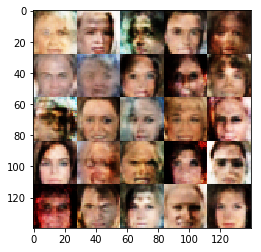

Epoch 1/7... Discriminator Loss: 0.9547 ... Generator Loss: 1.1738
Epoch 1/7... Discriminator Loss: 1.4059 ... Generator Loss: 0.4319
Epoch 1/7... Discriminator Loss: 1.1427 ... Generator Loss: 0.7922
Epoch 1/7... Discriminator Loss: 1.1857 ... Generator Loss: 0.6394
Epoch 1/7... Discriminator Loss: 1.1995 ... Generator Loss: 0.6632
Epoch 1/7... Discriminator Loss: 1.4428 ... Generator Loss: 0.5255
Epoch 1/7... Discriminator Loss: 1.0032 ... Generator Loss: 0.8945
Epoch 1/7... Discriminator Loss: 1.1533 ... Generator Loss: 0.7125
Epoch 1/7... Discriminator Loss: 1.3623 ... Generator Loss: 0.5046
Epoch 1/7... Discriminator Loss: 1.3128 ... Generator Loss: 0.5894


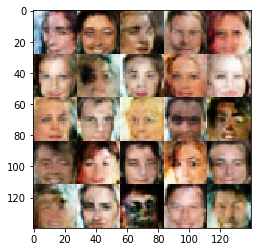

Epoch 1/7... Discriminator Loss: 1.2245 ... Generator Loss: 0.5643
Epoch 1/7... Discriminator Loss: 1.1044 ... Generator Loss: 0.7981
Epoch 1/7... Discriminator Loss: 1.1168 ... Generator Loss: 0.9314
Epoch 1/7... Discriminator Loss: 1.4457 ... Generator Loss: 1.9923
Epoch 1/7... Discriminator Loss: 1.0852 ... Generator Loss: 0.9078
Epoch 1/7... Discriminator Loss: 1.2496 ... Generator Loss: 0.6435
Epoch 1/7... Discriminator Loss: 1.0601 ... Generator Loss: 1.4718
Epoch 1/7... Discriminator Loss: 1.4700 ... Generator Loss: 0.4481
Epoch 1/7... Discriminator Loss: 1.3097 ... Generator Loss: 0.5902
Epoch 1/7... Discriminator Loss: 1.2447 ... Generator Loss: 0.6638


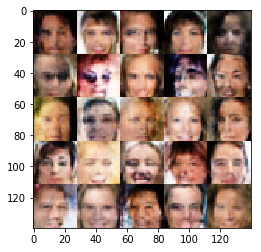

Epoch 1/7... Discriminator Loss: 1.3450 ... Generator Loss: 0.5219
Epoch 1/7... Discriminator Loss: 1.0372 ... Generator Loss: 1.1021
Epoch 1/7... Discriminator Loss: 1.5299 ... Generator Loss: 0.4350
Epoch 1/7... Discriminator Loss: 1.6500 ... Generator Loss: 0.4271
Epoch 1/7... Discriminator Loss: 1.3841 ... Generator Loss: 0.5195
Epoch 1/7... Discriminator Loss: 1.6621 ... Generator Loss: 0.4144
Epoch 1/7... Discriminator Loss: 1.3529 ... Generator Loss: 0.6047
Epoch 1/7... Discriminator Loss: 1.3156 ... Generator Loss: 0.6255
Epoch 1/7... Discriminator Loss: 1.0995 ... Generator Loss: 1.0109
Epoch 1/7... Discriminator Loss: 0.9420 ... Generator Loss: 1.0611


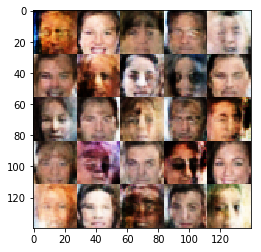

Epoch 1/7... Discriminator Loss: 1.1840 ... Generator Loss: 1.8162
Epoch 1/7... Discriminator Loss: 1.4622 ... Generator Loss: 1.6161
Epoch 1/7... Discriminator Loss: 1.0690 ... Generator Loss: 1.3578
Epoch 1/7... Discriminator Loss: 1.0798 ... Generator Loss: 1.8742
Epoch 1/7... Discriminator Loss: 1.4670 ... Generator Loss: 0.4936
Epoch 1/7... Discriminator Loss: 1.2825 ... Generator Loss: 0.5928
Epoch 1/7... Discriminator Loss: 1.3681 ... Generator Loss: 0.5715
Epoch 1/7... Discriminator Loss: 0.9200 ... Generator Loss: 1.7357
Epoch 1/7... Discriminator Loss: 1.0859 ... Generator Loss: 0.8649
Epoch 1/7... Discriminator Loss: 1.4455 ... Generator Loss: 0.5392


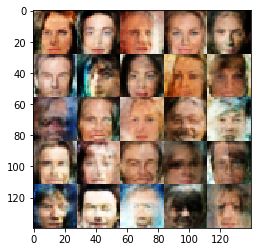

Epoch 1/7... Discriminator Loss: 1.3408 ... Generator Loss: 1.4520
Epoch 1/7... Discriminator Loss: 1.1086 ... Generator Loss: 1.2124
Epoch 1/7... Discriminator Loss: 1.9887 ... Generator Loss: 1.7929
Epoch 1/7... Discriminator Loss: 0.9802 ... Generator Loss: 1.8225
Epoch 1/7... Discriminator Loss: 1.0385 ... Generator Loss: 0.9243
Epoch 1/7... Discriminator Loss: 1.1910 ... Generator Loss: 0.7079
Epoch 1/7... Discriminator Loss: 1.0828 ... Generator Loss: 0.7632
Epoch 1/7... Discriminator Loss: 1.5014 ... Generator Loss: 0.4832
Epoch 1/7... Discriminator Loss: 1.2303 ... Generator Loss: 0.7493
Epoch 1/7... Discriminator Loss: 1.4707 ... Generator Loss: 0.4483


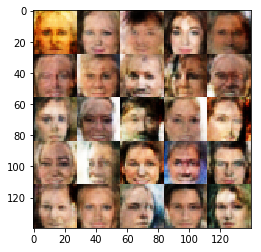

Epoch 1/7... Discriminator Loss: 1.3865 ... Generator Loss: 0.5391
Epoch 1/7... Discriminator Loss: 1.0029 ... Generator Loss: 0.8805
Epoch 1/7... Discriminator Loss: 1.2039 ... Generator Loss: 0.7115
Epoch 1/7... Discriminator Loss: 0.9102 ... Generator Loss: 1.4743
Epoch 1/7... Discriminator Loss: 0.9486 ... Generator Loss: 1.6335
Epoch 1/7... Discriminator Loss: 1.2939 ... Generator Loss: 0.6709
Epoch 1/7... Discriminator Loss: 1.2666 ... Generator Loss: 0.6694
Epoch 1/7... Discriminator Loss: 1.0727 ... Generator Loss: 1.0022
Epoch 1/7... Discriminator Loss: 1.1750 ... Generator Loss: 0.5988
Epoch 1/7... Discriminator Loss: 1.3290 ... Generator Loss: 0.5751


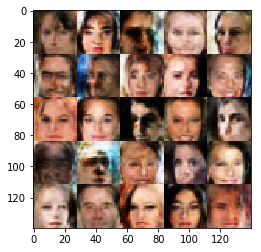

Epoch 1/7... Discriminator Loss: 1.0640 ... Generator Loss: 0.8099
Epoch 1/7... Discriminator Loss: 1.0673 ... Generator Loss: 0.8773
Epoch 1/7... Discriminator Loss: 1.0614 ... Generator Loss: 0.8727
Epoch 1/7... Discriminator Loss: 1.3711 ... Generator Loss: 0.5518
Epoch 1/7... Discriminator Loss: 1.4426 ... Generator Loss: 0.4796
Epoch 1/7... Discriminator Loss: 1.0934 ... Generator Loss: 1.2145
Epoch 2/7... Discriminator Loss: 1.3423 ... Generator Loss: 1.2559
Epoch 2/7... Discriminator Loss: 1.2316 ... Generator Loss: 1.9353
Epoch 2/7... Discriminator Loss: 1.1678 ... Generator Loss: 0.8570
Epoch 2/7... Discriminator Loss: 1.0009 ... Generator Loss: 1.0049


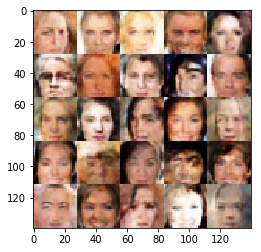

Epoch 2/7... Discriminator Loss: 1.2436 ... Generator Loss: 2.0762
Epoch 2/7... Discriminator Loss: 1.0645 ... Generator Loss: 1.0012
Epoch 2/7... Discriminator Loss: 1.3345 ... Generator Loss: 0.5422
Epoch 2/7... Discriminator Loss: 0.9249 ... Generator Loss: 1.4481
Epoch 2/7... Discriminator Loss: 1.1567 ... Generator Loss: 1.5435
Epoch 2/7... Discriminator Loss: 1.7624 ... Generator Loss: 2.4857
Epoch 2/7... Discriminator Loss: 1.2928 ... Generator Loss: 0.9179
Epoch 2/7... Discriminator Loss: 1.1360 ... Generator Loss: 0.8957
Epoch 2/7... Discriminator Loss: 1.1561 ... Generator Loss: 0.8421
Epoch 2/7... Discriminator Loss: 1.4709 ... Generator Loss: 0.4266


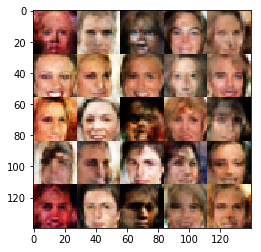

Epoch 2/7... Discriminator Loss: 1.2708 ... Generator Loss: 2.0265
Epoch 2/7... Discriminator Loss: 0.9249 ... Generator Loss: 1.0950
Epoch 2/7... Discriminator Loss: 1.1345 ... Generator Loss: 0.6704
Epoch 2/7... Discriminator Loss: 1.2701 ... Generator Loss: 1.6305
Epoch 2/7... Discriminator Loss: 0.8870 ... Generator Loss: 2.0514
Epoch 2/7... Discriminator Loss: 1.1338 ... Generator Loss: 1.6974
Epoch 2/7... Discriminator Loss: 1.5192 ... Generator Loss: 1.4978
Epoch 2/7... Discriminator Loss: 1.2779 ... Generator Loss: 1.0692
Epoch 2/7... Discriminator Loss: 1.1958 ... Generator Loss: 0.6779
Epoch 2/7... Discriminator Loss: 1.0660 ... Generator Loss: 1.2015


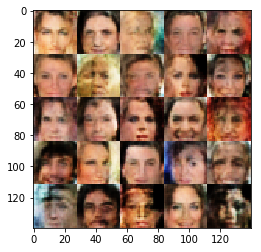

Epoch 2/7... Discriminator Loss: 1.0695 ... Generator Loss: 0.7506
Epoch 2/7... Discriminator Loss: 1.5283 ... Generator Loss: 1.9750
Epoch 2/7... Discriminator Loss: 0.9432 ... Generator Loss: 1.6982
Epoch 2/7... Discriminator Loss: 1.0232 ... Generator Loss: 1.2464
Epoch 2/7... Discriminator Loss: 0.8759 ... Generator Loss: 1.4121
Epoch 2/7... Discriminator Loss: 1.2371 ... Generator Loss: 1.6063
Epoch 2/7... Discriminator Loss: 1.1304 ... Generator Loss: 1.1528
Epoch 2/7... Discriminator Loss: 1.0180 ... Generator Loss: 0.9941
Epoch 2/7... Discriminator Loss: 1.4466 ... Generator Loss: 0.5339
Epoch 2/7... Discriminator Loss: 0.9848 ... Generator Loss: 1.3649


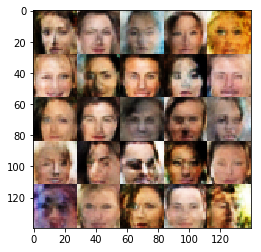

Epoch 2/7... Discriminator Loss: 1.1875 ... Generator Loss: 1.4222
Epoch 2/7... Discriminator Loss: 1.3870 ... Generator Loss: 0.5169
Epoch 2/7... Discriminator Loss: 1.1394 ... Generator Loss: 0.8471
Epoch 2/7... Discriminator Loss: 1.2946 ... Generator Loss: 0.4850
Epoch 2/7... Discriminator Loss: 1.3176 ... Generator Loss: 0.7217
Epoch 2/7... Discriminator Loss: 1.2397 ... Generator Loss: 0.6323
Epoch 2/7... Discriminator Loss: 1.4280 ... Generator Loss: 0.5552
Epoch 2/7... Discriminator Loss: 1.0804 ... Generator Loss: 0.7355
Epoch 2/7... Discriminator Loss: 1.2226 ... Generator Loss: 0.6573
Epoch 2/7... Discriminator Loss: 1.2295 ... Generator Loss: 0.5872


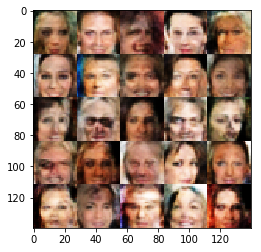

Epoch 2/7... Discriminator Loss: 0.9109 ... Generator Loss: 1.1869
Epoch 2/7... Discriminator Loss: 0.9958 ... Generator Loss: 1.5899
Epoch 2/7... Discriminator Loss: 1.3499 ... Generator Loss: 1.6586
Epoch 2/7... Discriminator Loss: 1.0662 ... Generator Loss: 1.2336
Epoch 2/7... Discriminator Loss: 1.2063 ... Generator Loss: 1.5386
Epoch 2/7... Discriminator Loss: 1.0731 ... Generator Loss: 1.0046
Epoch 2/7... Discriminator Loss: 1.2479 ... Generator Loss: 0.5597
Epoch 2/7... Discriminator Loss: 1.2146 ... Generator Loss: 0.6168
Epoch 2/7... Discriminator Loss: 1.1684 ... Generator Loss: 0.7881
Epoch 2/7... Discriminator Loss: 1.0358 ... Generator Loss: 1.0477


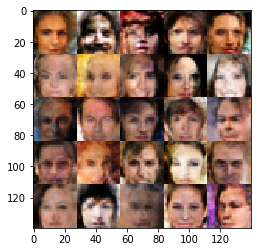

Epoch 2/7... Discriminator Loss: 1.1178 ... Generator Loss: 0.6378
Epoch 2/7... Discriminator Loss: 1.3453 ... Generator Loss: 0.5871
Epoch 2/7... Discriminator Loss: 1.1494 ... Generator Loss: 0.9887
Epoch 2/7... Discriminator Loss: 0.9146 ... Generator Loss: 1.5742
Epoch 2/7... Discriminator Loss: 1.0380 ... Generator Loss: 0.8966
Epoch 2/7... Discriminator Loss: 1.3972 ... Generator Loss: 0.4755
Epoch 2/7... Discriminator Loss: 1.1162 ... Generator Loss: 1.2549
Epoch 2/7... Discriminator Loss: 1.2934 ... Generator Loss: 0.5451
Epoch 2/7... Discriminator Loss: 1.1956 ... Generator Loss: 0.7509
Epoch 2/7... Discriminator Loss: 1.0541 ... Generator Loss: 0.6852


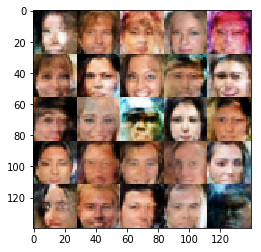

Epoch 2/7... Discriminator Loss: 1.1133 ... Generator Loss: 1.0622
Epoch 2/7... Discriminator Loss: 0.9601 ... Generator Loss: 1.0695
Epoch 2/7... Discriminator Loss: 1.3200 ... Generator Loss: 0.5216
Epoch 2/7... Discriminator Loss: 1.0244 ... Generator Loss: 0.9452
Epoch 2/7... Discriminator Loss: 1.0967 ... Generator Loss: 0.8883
Epoch 2/7... Discriminator Loss: 1.0192 ... Generator Loss: 0.8990
Epoch 2/7... Discriminator Loss: 1.1967 ... Generator Loss: 0.6901
Epoch 2/7... Discriminator Loss: 0.9269 ... Generator Loss: 1.2320
Epoch 2/7... Discriminator Loss: 1.0992 ... Generator Loss: 1.0972
Epoch 2/7... Discriminator Loss: 1.1044 ... Generator Loss: 2.1865


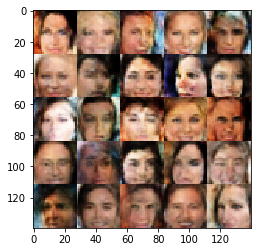

Epoch 2/7... Discriminator Loss: 1.2675 ... Generator Loss: 1.6059
Epoch 2/7... Discriminator Loss: 1.2065 ... Generator Loss: 1.2753
Epoch 2/7... Discriminator Loss: 1.0488 ... Generator Loss: 1.7586
Epoch 2/7... Discriminator Loss: 1.0841 ... Generator Loss: 1.2010
Epoch 2/7... Discriminator Loss: 1.0988 ... Generator Loss: 1.6474
Epoch 2/7... Discriminator Loss: 1.0374 ... Generator Loss: 1.2560
Epoch 2/7... Discriminator Loss: 1.0502 ... Generator Loss: 1.3990
Epoch 2/7... Discriminator Loss: 0.9730 ... Generator Loss: 1.4978
Epoch 2/7... Discriminator Loss: 0.8567 ... Generator Loss: 1.8620
Epoch 2/7... Discriminator Loss: 0.9639 ... Generator Loss: 1.9437


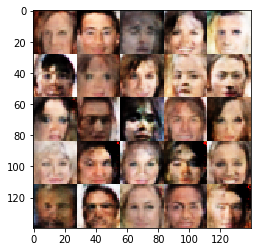

Epoch 2/7... Discriminator Loss: 1.2334 ... Generator Loss: 0.6018
Epoch 2/7... Discriminator Loss: 2.3914 ... Generator Loss: 0.2913
Epoch 2/7... Discriminator Loss: 1.0768 ... Generator Loss: 0.9628
Epoch 2/7... Discriminator Loss: 1.0839 ... Generator Loss: 0.8983
Epoch 2/7... Discriminator Loss: 1.2590 ... Generator Loss: 1.5322
Epoch 2/7... Discriminator Loss: 1.0526 ... Generator Loss: 1.2347
Epoch 2/7... Discriminator Loss: 1.0429 ... Generator Loss: 0.8722
Epoch 2/7... Discriminator Loss: 1.3960 ... Generator Loss: 1.6216
Epoch 2/7... Discriminator Loss: 1.0963 ... Generator Loss: 1.2625
Epoch 2/7... Discriminator Loss: 1.0452 ... Generator Loss: 1.1349


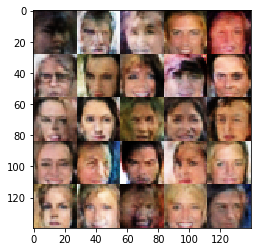

Epoch 2/7... Discriminator Loss: 1.1204 ... Generator Loss: 0.6942
Epoch 2/7... Discriminator Loss: 1.3050 ... Generator Loss: 0.7104
Epoch 2/7... Discriminator Loss: 1.1041 ... Generator Loss: 0.6437
Epoch 2/7... Discriminator Loss: 1.1229 ... Generator Loss: 0.6246
Epoch 2/7... Discriminator Loss: 1.0729 ... Generator Loss: 1.3539
Epoch 2/7... Discriminator Loss: 0.7526 ... Generator Loss: 2.0290
Epoch 2/7... Discriminator Loss: 1.4514 ... Generator Loss: 1.8908
Epoch 2/7... Discriminator Loss: 1.0518 ... Generator Loss: 0.9603
Epoch 2/7... Discriminator Loss: 1.0261 ... Generator Loss: 1.2723
Epoch 2/7... Discriminator Loss: 1.3190 ... Generator Loss: 1.3903


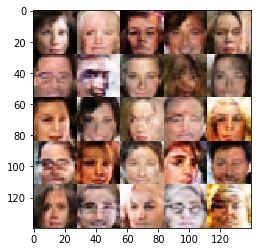

Epoch 2/7... Discriminator Loss: 0.9412 ... Generator Loss: 1.5930
Epoch 2/7... Discriminator Loss: 1.0425 ... Generator Loss: 1.4052
Epoch 2/7... Discriminator Loss: 1.0168 ... Generator Loss: 0.8045
Epoch 2/7... Discriminator Loss: 1.9070 ... Generator Loss: 1.8236
Epoch 2/7... Discriminator Loss: 1.2080 ... Generator Loss: 1.8373
Epoch 2/7... Discriminator Loss: 1.1295 ... Generator Loss: 1.3578
Epoch 2/7... Discriminator Loss: 1.2865 ... Generator Loss: 1.7624
Epoch 2/7... Discriminator Loss: 1.0615 ... Generator Loss: 0.8098
Epoch 2/7... Discriminator Loss: 1.0640 ... Generator Loss: 1.5789
Epoch 2/7... Discriminator Loss: 1.3108 ... Generator Loss: 0.4938


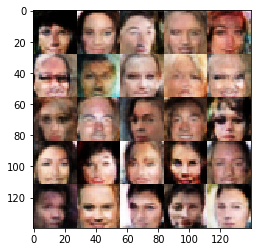

Epoch 2/7... Discriminator Loss: 0.9805 ... Generator Loss: 1.4414
Epoch 2/7... Discriminator Loss: 1.1471 ... Generator Loss: 1.5060
Epoch 2/7... Discriminator Loss: 1.2983 ... Generator Loss: 0.5471
Epoch 2/7... Discriminator Loss: 1.0322 ... Generator Loss: 0.9673
Epoch 2/7... Discriminator Loss: 1.0111 ... Generator Loss: 0.9212
Epoch 2/7... Discriminator Loss: 1.2167 ... Generator Loss: 0.5996
Epoch 2/7... Discriminator Loss: 1.3021 ... Generator Loss: 0.5745
Epoch 2/7... Discriminator Loss: 1.2506 ... Generator Loss: 0.6308
Epoch 2/7... Discriminator Loss: 1.2165 ... Generator Loss: 0.7324
Epoch 2/7... Discriminator Loss: 0.9681 ... Generator Loss: 0.9115


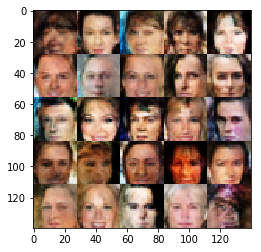

Epoch 2/7... Discriminator Loss: 1.4921 ... Generator Loss: 0.4722
Epoch 2/7... Discriminator Loss: 1.0681 ... Generator Loss: 0.8574
Epoch 2/7... Discriminator Loss: 1.4205 ... Generator Loss: 0.5299
Epoch 2/7... Discriminator Loss: 1.3004 ... Generator Loss: 0.5940
Epoch 2/7... Discriminator Loss: 1.0483 ... Generator Loss: 1.1066
Epoch 2/7... Discriminator Loss: 1.2780 ... Generator Loss: 1.5887
Epoch 2/7... Discriminator Loss: 0.9442 ... Generator Loss: 1.1900
Epoch 2/7... Discriminator Loss: 1.2208 ... Generator Loss: 1.8507
Epoch 2/7... Discriminator Loss: 1.0618 ... Generator Loss: 1.5227
Epoch 2/7... Discriminator Loss: 1.1817 ... Generator Loss: 1.5546


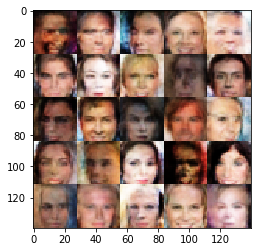

Epoch 2/7... Discriminator Loss: 1.2137 ... Generator Loss: 0.5755
Epoch 2/7... Discriminator Loss: 1.0985 ... Generator Loss: 1.8912
Epoch 2/7... Discriminator Loss: 0.9263 ... Generator Loss: 1.1417
Epoch 2/7... Discriminator Loss: 1.0983 ... Generator Loss: 1.1569
Epoch 2/7... Discriminator Loss: 1.0294 ... Generator Loss: 0.8310
Epoch 2/7... Discriminator Loss: 1.1269 ... Generator Loss: 0.5941
Epoch 2/7... Discriminator Loss: 1.3985 ... Generator Loss: 0.5415
Epoch 2/7... Discriminator Loss: 1.4120 ... Generator Loss: 1.7677
Epoch 2/7... Discriminator Loss: 0.9451 ... Generator Loss: 1.1926
Epoch 2/7... Discriminator Loss: 1.0270 ... Generator Loss: 1.0887


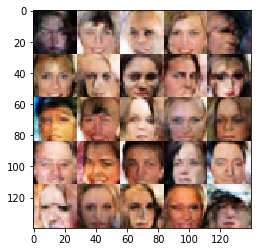

Epoch 2/7... Discriminator Loss: 1.0343 ... Generator Loss: 1.9976
Epoch 2/7... Discriminator Loss: 0.8235 ... Generator Loss: 1.6341
Epoch 2/7... Discriminator Loss: 1.1847 ... Generator Loss: 1.5414
Epoch 2/7... Discriminator Loss: 1.0667 ... Generator Loss: 1.2071
Epoch 2/7... Discriminator Loss: 1.2028 ... Generator Loss: 0.7211
Epoch 2/7... Discriminator Loss: 0.9653 ... Generator Loss: 0.8556
Epoch 2/7... Discriminator Loss: 1.0303 ... Generator Loss: 1.2261
Epoch 2/7... Discriminator Loss: 1.1356 ... Generator Loss: 0.6719
Epoch 2/7... Discriminator Loss: 0.9142 ... Generator Loss: 1.0073
Epoch 2/7... Discriminator Loss: 1.0882 ... Generator Loss: 0.6904


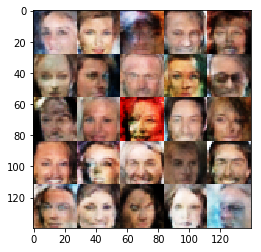

Epoch 2/7... Discriminator Loss: 1.5008 ... Generator Loss: 1.8172
Epoch 2/7... Discriminator Loss: 1.0722 ... Generator Loss: 1.7029
Epoch 2/7... Discriminator Loss: 1.1318 ... Generator Loss: 1.5359
Epoch 2/7... Discriminator Loss: 1.4345 ... Generator Loss: 2.2966
Epoch 2/7... Discriminator Loss: 0.9768 ... Generator Loss: 1.4153
Epoch 2/7... Discriminator Loss: 1.1495 ... Generator Loss: 1.2789
Epoch 2/7... Discriminator Loss: 1.0633 ... Generator Loss: 1.8104
Epoch 2/7... Discriminator Loss: 1.0910 ... Generator Loss: 1.5072
Epoch 2/7... Discriminator Loss: 1.2387 ... Generator Loss: 1.9865
Epoch 2/7... Discriminator Loss: 1.6370 ... Generator Loss: 0.4173


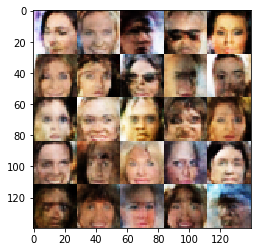

Epoch 2/7... Discriminator Loss: 1.2528 ... Generator Loss: 0.6122
Epoch 2/7... Discriminator Loss: 1.2898 ... Generator Loss: 0.5746
Epoch 2/7... Discriminator Loss: 1.1105 ... Generator Loss: 0.7123
Epoch 2/7... Discriminator Loss: 1.1812 ... Generator Loss: 0.7838
Epoch 2/7... Discriminator Loss: 1.0530 ... Generator Loss: 1.0099
Epoch 2/7... Discriminator Loss: 0.8875 ... Generator Loss: 1.0556
Epoch 2/7... Discriminator Loss: 1.4953 ... Generator Loss: 0.4778
Epoch 2/7... Discriminator Loss: 1.0914 ... Generator Loss: 0.8114
Epoch 2/7... Discriminator Loss: 1.1608 ... Generator Loss: 0.7085
Epoch 2/7... Discriminator Loss: 1.4378 ... Generator Loss: 0.4574


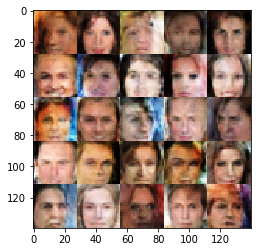

Epoch 2/7... Discriminator Loss: 1.0278 ... Generator Loss: 0.9393
Epoch 2/7... Discriminator Loss: 1.0707 ... Generator Loss: 0.8091
Epoch 2/7... Discriminator Loss: 1.0247 ... Generator Loss: 0.6892
Epoch 2/7... Discriminator Loss: 1.0842 ... Generator Loss: 0.8992
Epoch 2/7... Discriminator Loss: 1.3619 ... Generator Loss: 0.5995
Epoch 2/7... Discriminator Loss: 0.9564 ... Generator Loss: 0.8877
Epoch 2/7... Discriminator Loss: 1.0479 ... Generator Loss: 1.0877
Epoch 2/7... Discriminator Loss: 1.0652 ... Generator Loss: 1.6773
Epoch 2/7... Discriminator Loss: 1.0512 ... Generator Loss: 1.8758
Epoch 2/7... Discriminator Loss: 1.1401 ... Generator Loss: 1.2083


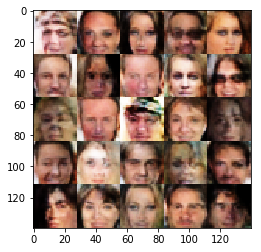

Epoch 2/7... Discriminator Loss: 1.0750 ... Generator Loss: 1.3478
Epoch 2/7... Discriminator Loss: 0.9719 ... Generator Loss: 1.7743
Epoch 2/7... Discriminator Loss: 0.9975 ... Generator Loss: 0.8130
Epoch 2/7... Discriminator Loss: 1.7518 ... Generator Loss: 0.4240
Epoch 2/7... Discriminator Loss: 1.0446 ... Generator Loss: 2.0149
Epoch 2/7... Discriminator Loss: 1.3149 ... Generator Loss: 2.2710
Epoch 2/7... Discriminator Loss: 1.0734 ... Generator Loss: 0.8590
Epoch 2/7... Discriminator Loss: 1.1793 ... Generator Loss: 0.6271
Epoch 2/7... Discriminator Loss: 0.9408 ... Generator Loss: 1.3733
Epoch 2/7... Discriminator Loss: 1.1175 ... Generator Loss: 1.0442


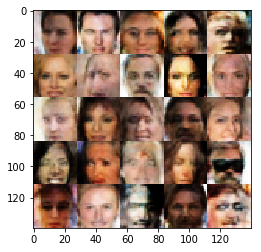

Epoch 2/7... Discriminator Loss: 1.0498 ... Generator Loss: 1.9348
Epoch 2/7... Discriminator Loss: 1.2524 ... Generator Loss: 2.1815
Epoch 2/7... Discriminator Loss: 1.0166 ... Generator Loss: 2.1692
Epoch 2/7... Discriminator Loss: 1.3351 ... Generator Loss: 1.7308
Epoch 2/7... Discriminator Loss: 1.0658 ... Generator Loss: 0.7317
Epoch 2/7... Discriminator Loss: 1.0667 ... Generator Loss: 1.5759
Epoch 2/7... Discriminator Loss: 1.0427 ... Generator Loss: 1.6982
Epoch 2/7... Discriminator Loss: 1.3568 ... Generator Loss: 0.4391
Epoch 2/7... Discriminator Loss: 1.1079 ... Generator Loss: 0.8256
Epoch 2/7... Discriminator Loss: 1.0782 ... Generator Loss: 1.7678


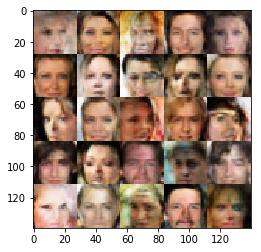

Epoch 2/7... Discriminator Loss: 0.8579 ... Generator Loss: 2.2673
Epoch 2/7... Discriminator Loss: 1.0302 ... Generator Loss: 1.1399
Epoch 2/7... Discriminator Loss: 1.1375 ... Generator Loss: 2.0117
Epoch 2/7... Discriminator Loss: 1.2830 ... Generator Loss: 1.5640
Epoch 2/7... Discriminator Loss: 0.9858 ... Generator Loss: 1.3723
Epoch 2/7... Discriminator Loss: 1.4916 ... Generator Loss: 0.4037
Epoch 2/7... Discriminator Loss: 0.9473 ... Generator Loss: 1.6137
Epoch 2/7... Discriminator Loss: 0.9484 ... Generator Loss: 1.2247
Epoch 2/7... Discriminator Loss: 1.1375 ... Generator Loss: 0.6541
Epoch 2/7... Discriminator Loss: 1.6615 ... Generator Loss: 2.4368


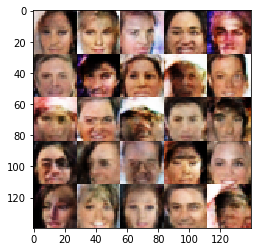

Epoch 2/7... Discriminator Loss: 0.8856 ... Generator Loss: 1.3114
Epoch 2/7... Discriminator Loss: 1.4356 ... Generator Loss: 0.5594
Epoch 2/7... Discriminator Loss: 0.9316 ... Generator Loss: 0.9261
Epoch 2/7... Discriminator Loss: 1.0420 ... Generator Loss: 0.9329
Epoch 2/7... Discriminator Loss: 1.0505 ... Generator Loss: 0.8958
Epoch 2/7... Discriminator Loss: 0.9160 ... Generator Loss: 0.9630
Epoch 2/7... Discriminator Loss: 1.2732 ... Generator Loss: 0.6016
Epoch 2/7... Discriminator Loss: 1.2194 ... Generator Loss: 0.6763
Epoch 2/7... Discriminator Loss: 1.3000 ... Generator Loss: 0.5136
Epoch 2/7... Discriminator Loss: 1.0087 ... Generator Loss: 1.5761


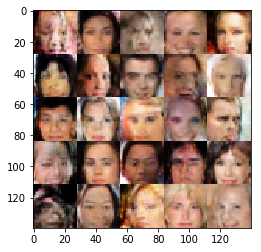

Epoch 2/7... Discriminator Loss: 0.9144 ... Generator Loss: 1.1053
Epoch 2/7... Discriminator Loss: 1.4033 ... Generator Loss: 2.4555
Epoch 2/7... Discriminator Loss: 0.8149 ... Generator Loss: 1.1887
Epoch 2/7... Discriminator Loss: 1.0693 ... Generator Loss: 1.6907
Epoch 2/7... Discriminator Loss: 0.8952 ... Generator Loss: 1.2145
Epoch 2/7... Discriminator Loss: 1.0908 ... Generator Loss: 1.6464
Epoch 2/7... Discriminator Loss: 1.2809 ... Generator Loss: 2.0277
Epoch 2/7... Discriminator Loss: 1.1009 ... Generator Loss: 1.0479
Epoch 2/7... Discriminator Loss: 0.7994 ... Generator Loss: 1.2549
Epoch 2/7... Discriminator Loss: 1.8007 ... Generator Loss: 2.5092


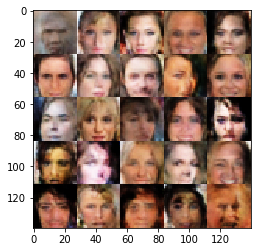

Epoch 2/7... Discriminator Loss: 0.9413 ... Generator Loss: 1.0106
Epoch 2/7... Discriminator Loss: 1.2561 ... Generator Loss: 0.6826
Epoch 2/7... Discriminator Loss: 1.0216 ... Generator Loss: 1.0971
Epoch 2/7... Discriminator Loss: 1.1086 ... Generator Loss: 0.6838
Epoch 2/7... Discriminator Loss: 0.9435 ... Generator Loss: 1.1404
Epoch 2/7... Discriminator Loss: 1.5496 ... Generator Loss: 0.4691
Epoch 2/7... Discriminator Loss: 1.2119 ... Generator Loss: 0.5350
Epoch 2/7... Discriminator Loss: 0.9782 ... Generator Loss: 2.4032
Epoch 2/7... Discriminator Loss: 1.0691 ... Generator Loss: 0.6490
Epoch 2/7... Discriminator Loss: 0.6636 ... Generator Loss: 2.2286


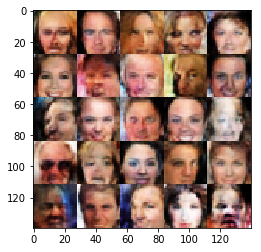

Epoch 2/7... Discriminator Loss: 1.8195 ... Generator Loss: 2.1998
Epoch 2/7... Discriminator Loss: 1.4076 ... Generator Loss: 0.4931
Epoch 2/7... Discriminator Loss: 0.9392 ... Generator Loss: 1.0953
Epoch 2/7... Discriminator Loss: 0.9457 ... Generator Loss: 1.3411
Epoch 2/7... Discriminator Loss: 1.1027 ... Generator Loss: 1.9438
Epoch 2/7... Discriminator Loss: 0.9328 ... Generator Loss: 1.0267
Epoch 2/7... Discriminator Loss: 1.4267 ... Generator Loss: 0.4904
Epoch 2/7... Discriminator Loss: 0.8359 ... Generator Loss: 1.0484
Epoch 2/7... Discriminator Loss: 1.0285 ... Generator Loss: 0.9401
Epoch 2/7... Discriminator Loss: 1.0927 ... Generator Loss: 2.4069


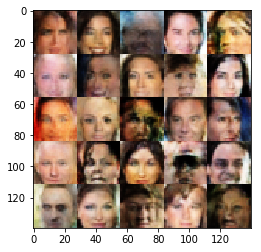

Epoch 2/7... Discriminator Loss: 1.1741 ... Generator Loss: 1.9671
Epoch 2/7... Discriminator Loss: 0.8038 ... Generator Loss: 1.5905
Epoch 2/7... Discriminator Loss: 0.9055 ... Generator Loss: 1.0659
Epoch 2/7... Discriminator Loss: 0.9613 ... Generator Loss: 2.4878
Epoch 2/7... Discriminator Loss: 1.1609 ... Generator Loss: 1.6463
Epoch 2/7... Discriminator Loss: 1.8931 ... Generator Loss: 0.3950
Epoch 2/7... Discriminator Loss: 0.9126 ... Generator Loss: 1.1354
Epoch 2/7... Discriminator Loss: 0.8462 ... Generator Loss: 1.1338
Epoch 2/7... Discriminator Loss: 0.9101 ... Generator Loss: 1.8800
Epoch 2/7... Discriminator Loss: 0.9369 ... Generator Loss: 1.2579


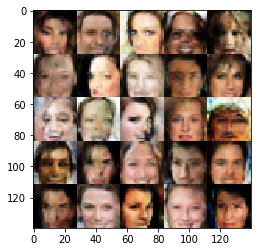

Epoch 2/7... Discriminator Loss: 1.0188 ... Generator Loss: 2.0338
Epoch 2/7... Discriminator Loss: 1.2007 ... Generator Loss: 1.6515
Epoch 2/7... Discriminator Loss: 1.2464 ... Generator Loss: 2.0374
Epoch 2/7... Discriminator Loss: 1.1694 ... Generator Loss: 0.6398
Epoch 2/7... Discriminator Loss: 0.9924 ... Generator Loss: 0.7681
Epoch 2/7... Discriminator Loss: 0.8361 ... Generator Loss: 1.7907
Epoch 2/7... Discriminator Loss: 1.0870 ... Generator Loss: 1.5514
Epoch 2/7... Discriminator Loss: 1.0122 ... Generator Loss: 0.8203
Epoch 2/7... Discriminator Loss: 0.9044 ... Generator Loss: 1.6969
Epoch 2/7... Discriminator Loss: 0.8139 ... Generator Loss: 1.2413


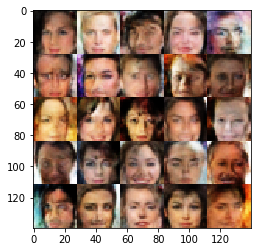

Epoch 2/7... Discriminator Loss: 0.8744 ... Generator Loss: 1.2355
Epoch 2/7... Discriminator Loss: 1.6666 ... Generator Loss: 2.7668
Epoch 2/7... Discriminator Loss: 1.1698 ... Generator Loss: 1.6159
Epoch 2/7... Discriminator Loss: 0.9112 ... Generator Loss: 1.2839
Epoch 2/7... Discriminator Loss: 0.9527 ... Generator Loss: 1.6035
Epoch 2/7... Discriminator Loss: 1.0837 ... Generator Loss: 1.5451
Epoch 2/7... Discriminator Loss: 1.1264 ... Generator Loss: 1.9251
Epoch 2/7... Discriminator Loss: 1.1201 ... Generator Loss: 1.5692
Epoch 2/7... Discriminator Loss: 1.1064 ... Generator Loss: 2.4586
Epoch 2/7... Discriminator Loss: 1.0314 ... Generator Loss: 1.0387


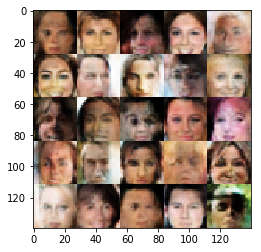

Epoch 2/7... Discriminator Loss: 0.9603 ... Generator Loss: 0.7211
Epoch 2/7... Discriminator Loss: 1.0187 ... Generator Loss: 0.7811
Epoch 2/7... Discriminator Loss: 0.7927 ... Generator Loss: 1.7434
Epoch 2/7... Discriminator Loss: 0.9623 ... Generator Loss: 0.8676
Epoch 2/7... Discriminator Loss: 1.3817 ... Generator Loss: 0.6045
Epoch 2/7... Discriminator Loss: 1.4444 ... Generator Loss: 0.5150
Epoch 2/7... Discriminator Loss: 0.8993 ... Generator Loss: 1.2947
Epoch 2/7... Discriminator Loss: 0.9699 ... Generator Loss: 1.4374
Epoch 2/7... Discriminator Loss: 0.9247 ... Generator Loss: 2.2056
Epoch 2/7... Discriminator Loss: 0.9987 ... Generator Loss: 1.9832


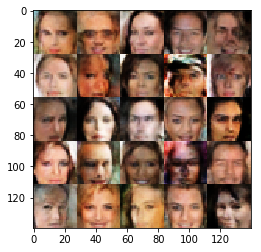

Epoch 2/7... Discriminator Loss: 0.8431 ... Generator Loss: 2.1401
Epoch 2/7... Discriminator Loss: 1.0887 ... Generator Loss: 1.4113
Epoch 2/7... Discriminator Loss: 1.4301 ... Generator Loss: 0.5169
Epoch 2/7... Discriminator Loss: 0.8407 ... Generator Loss: 1.6816
Epoch 2/7... Discriminator Loss: 0.9177 ... Generator Loss: 1.5338
Epoch 2/7... Discriminator Loss: 1.0065 ... Generator Loss: 0.8269
Epoch 2/7... Discriminator Loss: 1.3991 ... Generator Loss: 0.5600
Epoch 2/7... Discriminator Loss: 0.9091 ... Generator Loss: 1.2516
Epoch 2/7... Discriminator Loss: 0.8184 ... Generator Loss: 1.4193
Epoch 2/7... Discriminator Loss: 1.1383 ... Generator Loss: 0.7125


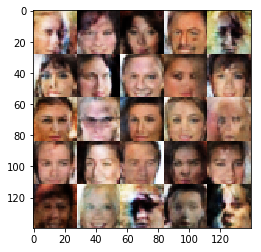

Epoch 2/7... Discriminator Loss: 0.8996 ... Generator Loss: 1.1272
Epoch 2/7... Discriminator Loss: 1.0965 ... Generator Loss: 0.6754
Epoch 2/7... Discriminator Loss: 0.8210 ... Generator Loss: 1.0276
Epoch 2/7... Discriminator Loss: 1.0618 ... Generator Loss: 1.7569
Epoch 2/7... Discriminator Loss: 0.9390 ... Generator Loss: 0.9508
Epoch 2/7... Discriminator Loss: 0.8297 ... Generator Loss: 2.1417
Epoch 2/7... Discriminator Loss: 1.1629 ... Generator Loss: 1.4297
Epoch 2/7... Discriminator Loss: 1.1772 ... Generator Loss: 0.8620
Epoch 2/7... Discriminator Loss: 0.9297 ... Generator Loss: 1.2418
Epoch 2/7... Discriminator Loss: 0.7544 ... Generator Loss: 1.6743


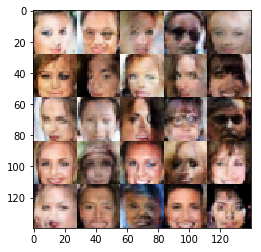

Epoch 2/7... Discriminator Loss: 0.7096 ... Generator Loss: 2.4292
Epoch 2/7... Discriminator Loss: 1.5668 ... Generator Loss: 2.9012
Epoch 2/7... Discriminator Loss: 0.6667 ... Generator Loss: 2.4718
Epoch 3/7... Discriminator Loss: 1.7308 ... Generator Loss: 0.3882
Epoch 3/7... Discriminator Loss: 1.0389 ... Generator Loss: 0.9262
Epoch 3/7... Discriminator Loss: 0.8642 ... Generator Loss: 1.4797
Epoch 3/7... Discriminator Loss: 1.7630 ... Generator Loss: 0.4285
Epoch 3/7... Discriminator Loss: 0.8797 ... Generator Loss: 1.0793
Epoch 3/7... Discriminator Loss: 0.5833 ... Generator Loss: 2.0508
Epoch 3/7... Discriminator Loss: 0.9675 ... Generator Loss: 0.7895


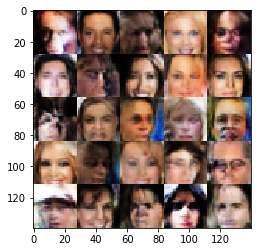

Epoch 3/7... Discriminator Loss: 0.8508 ... Generator Loss: 0.9447
Epoch 3/7... Discriminator Loss: 0.7971 ... Generator Loss: 1.7996
Epoch 3/7... Discriminator Loss: 0.6115 ... Generator Loss: 1.8705
Epoch 3/7... Discriminator Loss: 1.4895 ... Generator Loss: 0.5400
Epoch 3/7... Discriminator Loss: 0.8846 ... Generator Loss: 1.1855
Epoch 3/7... Discriminator Loss: 0.8737 ... Generator Loss: 1.3647
Epoch 3/7... Discriminator Loss: 1.5083 ... Generator Loss: 0.4924
Epoch 3/7... Discriminator Loss: 1.3522 ... Generator Loss: 0.6024
Epoch 3/7... Discriminator Loss: 1.4414 ... Generator Loss: 0.5314
Epoch 3/7... Discriminator Loss: 1.3806 ... Generator Loss: 0.5062


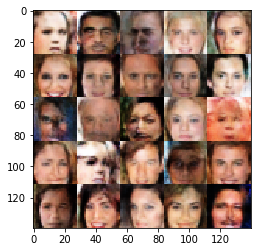

Epoch 3/7... Discriminator Loss: 1.1103 ... Generator Loss: 0.7036
Epoch 3/7... Discriminator Loss: 1.0410 ... Generator Loss: 2.0786
Epoch 3/7... Discriminator Loss: 0.8792 ... Generator Loss: 1.4323
Epoch 3/7... Discriminator Loss: 1.0038 ... Generator Loss: 1.8663
Epoch 3/7... Discriminator Loss: 1.3299 ... Generator Loss: 2.9192
Epoch 3/7... Discriminator Loss: 1.2390 ... Generator Loss: 2.2733
Epoch 3/7... Discriminator Loss: 1.0498 ... Generator Loss: 1.6940
Epoch 3/7... Discriminator Loss: 0.9836 ... Generator Loss: 1.5103
Epoch 3/7... Discriminator Loss: 0.7442 ... Generator Loss: 1.2381
Epoch 3/7... Discriminator Loss: 1.3114 ... Generator Loss: 0.6279


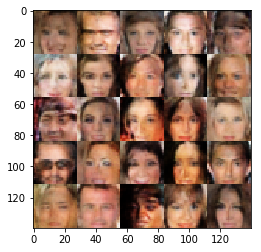

Epoch 3/7... Discriminator Loss: 0.7047 ... Generator Loss: 1.4279
Epoch 3/7... Discriminator Loss: 0.9132 ... Generator Loss: 0.9104
Epoch 3/7... Discriminator Loss: 1.1771 ... Generator Loss: 0.6621
Epoch 3/7... Discriminator Loss: 0.9849 ... Generator Loss: 1.2421
Epoch 3/7... Discriminator Loss: 0.8829 ... Generator Loss: 1.1386
Epoch 3/7... Discriminator Loss: 1.5571 ... Generator Loss: 2.3947
Epoch 3/7... Discriminator Loss: 0.8119 ... Generator Loss: 1.7755
Epoch 3/7... Discriminator Loss: 0.8535 ... Generator Loss: 2.9063
Epoch 3/7... Discriminator Loss: 0.9293 ... Generator Loss: 1.5583
Epoch 3/7... Discriminator Loss: 1.1867 ... Generator Loss: 2.7310


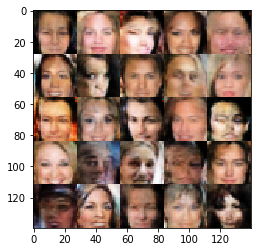

Epoch 3/7... Discriminator Loss: 1.0372 ... Generator Loss: 1.3976
Epoch 3/7... Discriminator Loss: 0.8105 ... Generator Loss: 1.1726
Epoch 3/7... Discriminator Loss: 1.1332 ... Generator Loss: 2.5354
Epoch 3/7... Discriminator Loss: 0.6979 ... Generator Loss: 1.8413
Epoch 3/7... Discriminator Loss: 0.8544 ... Generator Loss: 1.7500
Epoch 3/7... Discriminator Loss: 0.6363 ... Generator Loss: 2.6951
Epoch 3/7... Discriminator Loss: 2.1171 ... Generator Loss: 2.6663
Epoch 3/7... Discriminator Loss: 0.9834 ... Generator Loss: 1.2772
Epoch 3/7... Discriminator Loss: 0.7084 ... Generator Loss: 1.1548
Epoch 3/7... Discriminator Loss: 1.5559 ... Generator Loss: 0.4898


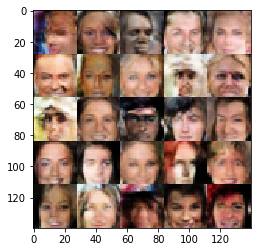

Epoch 3/7... Discriminator Loss: 0.8856 ... Generator Loss: 0.9171
Epoch 3/7... Discriminator Loss: 1.6069 ... Generator Loss: 0.4829
Epoch 3/7... Discriminator Loss: 0.7745 ... Generator Loss: 1.3159
Epoch 3/7... Discriminator Loss: 0.8814 ... Generator Loss: 0.9894
Epoch 3/7... Discriminator Loss: 1.1062 ... Generator Loss: 0.6522
Epoch 3/7... Discriminator Loss: 0.8599 ... Generator Loss: 1.0560
Epoch 3/7... Discriminator Loss: 0.7707 ... Generator Loss: 2.2391
Epoch 3/7... Discriminator Loss: 1.1603 ... Generator Loss: 2.3508
Epoch 3/7... Discriminator Loss: 0.7616 ... Generator Loss: 1.7565
Epoch 3/7... Discriminator Loss: 1.0138 ... Generator Loss: 2.3548


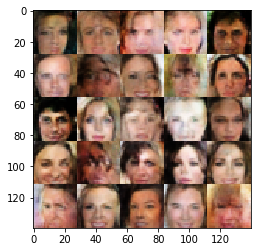

Epoch 3/7... Discriminator Loss: 1.0386 ... Generator Loss: 0.9977
Epoch 3/7... Discriminator Loss: 0.8725 ... Generator Loss: 2.0500
Epoch 3/7... Discriminator Loss: 1.2911 ... Generator Loss: 2.1812
Epoch 3/7... Discriminator Loss: 1.1908 ... Generator Loss: 2.0123
Epoch 3/7... Discriminator Loss: 2.3281 ... Generator Loss: 3.1879
Epoch 3/7... Discriminator Loss: 1.0453 ... Generator Loss: 1.8715
Epoch 3/7... Discriminator Loss: 0.8684 ... Generator Loss: 1.0893
Epoch 3/7... Discriminator Loss: 0.9689 ... Generator Loss: 1.0348
Epoch 3/7... Discriminator Loss: 0.8475 ... Generator Loss: 1.0988
Epoch 3/7... Discriminator Loss: 0.7648 ... Generator Loss: 1.5143


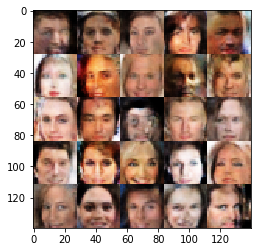

Epoch 3/7... Discriminator Loss: 1.1838 ... Generator Loss: 2.1379
Epoch 3/7... Discriminator Loss: 0.9443 ... Generator Loss: 2.5102
Epoch 3/7... Discriminator Loss: 0.9024 ... Generator Loss: 2.0127
Epoch 3/7... Discriminator Loss: 1.0078 ... Generator Loss: 0.8527
Epoch 3/7... Discriminator Loss: 1.4243 ... Generator Loss: 0.5111
Epoch 3/7... Discriminator Loss: 0.8135 ... Generator Loss: 1.1380
Epoch 3/7... Discriminator Loss: 1.2342 ... Generator Loss: 2.3397
Epoch 3/7... Discriminator Loss: 0.7529 ... Generator Loss: 1.4474
Epoch 3/7... Discriminator Loss: 0.8339 ... Generator Loss: 1.0967
Epoch 3/7... Discriminator Loss: 0.6913 ... Generator Loss: 1.3293


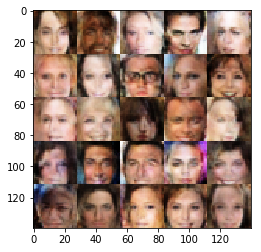

Epoch 3/7... Discriminator Loss: 2.1549 ... Generator Loss: 0.3232
Epoch 3/7... Discriminator Loss: 0.9504 ... Generator Loss: 0.8940
Epoch 3/7... Discriminator Loss: 1.0027 ... Generator Loss: 1.2455
Epoch 3/7... Discriminator Loss: 0.6935 ... Generator Loss: 1.7533
Epoch 3/7... Discriminator Loss: 1.6317 ... Generator Loss: 4.0017
Epoch 3/7... Discriminator Loss: 0.8323 ... Generator Loss: 1.2781
Epoch 3/7... Discriminator Loss: 0.9442 ... Generator Loss: 1.4357
Epoch 3/7... Discriminator Loss: 0.8197 ... Generator Loss: 1.7952
Epoch 3/7... Discriminator Loss: 0.8042 ... Generator Loss: 2.5580
Epoch 3/7... Discriminator Loss: 0.9813 ... Generator Loss: 2.6398


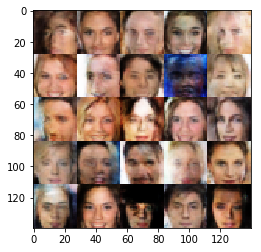

Epoch 3/7... Discriminator Loss: 0.9403 ... Generator Loss: 2.3357
Epoch 3/7... Discriminator Loss: 1.2855 ... Generator Loss: 0.6026
Epoch 3/7... Discriminator Loss: 0.6558 ... Generator Loss: 1.9609
Epoch 3/7... Discriminator Loss: 0.9162 ... Generator Loss: 1.7750
Epoch 3/7... Discriminator Loss: 0.8539 ... Generator Loss: 1.9708
Epoch 3/7... Discriminator Loss: 0.8935 ... Generator Loss: 1.6592
Epoch 3/7... Discriminator Loss: 0.8259 ... Generator Loss: 1.2672
Epoch 3/7... Discriminator Loss: 0.8069 ... Generator Loss: 1.6048
Epoch 3/7... Discriminator Loss: 0.9073 ... Generator Loss: 2.2733
Epoch 3/7... Discriminator Loss: 0.9980 ... Generator Loss: 0.7461


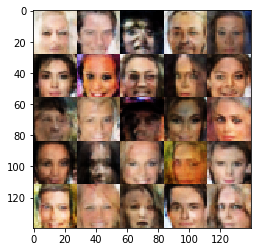

Epoch 3/7... Discriminator Loss: 0.9247 ... Generator Loss: 1.1553
Epoch 3/7... Discriminator Loss: 1.6501 ... Generator Loss: 3.0514
Epoch 3/7... Discriminator Loss: 1.0579 ... Generator Loss: 1.3344
Epoch 3/7... Discriminator Loss: 0.9465 ... Generator Loss: 0.8128
Epoch 3/7... Discriminator Loss: 0.9163 ... Generator Loss: 1.2703
Epoch 3/7... Discriminator Loss: 0.7973 ... Generator Loss: 1.4141
Epoch 3/7... Discriminator Loss: 0.8206 ... Generator Loss: 1.5860
Epoch 3/7... Discriminator Loss: 0.7837 ... Generator Loss: 1.7740
Epoch 3/7... Discriminator Loss: 1.0541 ... Generator Loss: 2.2681
Epoch 3/7... Discriminator Loss: 0.8146 ... Generator Loss: 1.9269


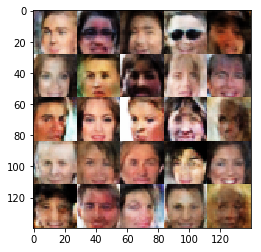

Epoch 3/7... Discriminator Loss: 0.9772 ... Generator Loss: 1.9148
Epoch 3/7... Discriminator Loss: 1.1873 ... Generator Loss: 2.2549
Epoch 3/7... Discriminator Loss: 0.9612 ... Generator Loss: 1.7632
Epoch 3/7... Discriminator Loss: 0.7709 ... Generator Loss: 1.7968
Epoch 3/7... Discriminator Loss: 0.7128 ... Generator Loss: 1.3716
Epoch 3/7... Discriminator Loss: 0.7745 ... Generator Loss: 1.3273
Epoch 3/7... Discriminator Loss: 1.0573 ... Generator Loss: 0.9172
Epoch 3/7... Discriminator Loss: 0.8004 ... Generator Loss: 1.3916
Epoch 3/7... Discriminator Loss: 1.0374 ... Generator Loss: 2.3442
Epoch 3/7... Discriminator Loss: 1.5983 ... Generator Loss: 2.3926


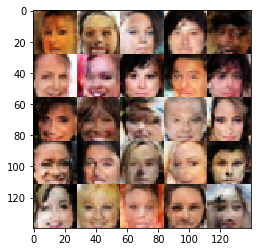

Epoch 3/7... Discriminator Loss: 0.8341 ... Generator Loss: 1.6698
Epoch 3/7... Discriminator Loss: 0.8793 ... Generator Loss: 1.2790
Epoch 3/7... Discriminator Loss: 0.9412 ... Generator Loss: 0.9995
Epoch 3/7... Discriminator Loss: 1.2635 ... Generator Loss: 0.6402
Epoch 3/7... Discriminator Loss: 0.8920 ... Generator Loss: 1.0355
Epoch 3/7... Discriminator Loss: 0.8168 ... Generator Loss: 1.5118
Epoch 3/7... Discriminator Loss: 0.8927 ... Generator Loss: 1.8366
Epoch 3/7... Discriminator Loss: 0.8208 ... Generator Loss: 2.2981
Epoch 3/7... Discriminator Loss: 0.8811 ... Generator Loss: 1.6696
Epoch 3/7... Discriminator Loss: 0.8898 ... Generator Loss: 2.1881


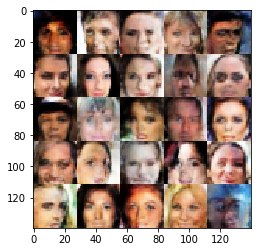

Epoch 3/7... Discriminator Loss: 3.1533 ... Generator Loss: 3.4016
Epoch 3/7... Discriminator Loss: 1.0425 ... Generator Loss: 0.9220
Epoch 3/7... Discriminator Loss: 1.0154 ... Generator Loss: 1.5766
Epoch 3/7... Discriminator Loss: 0.7698 ... Generator Loss: 1.6892
Epoch 3/7... Discriminator Loss: 0.8082 ... Generator Loss: 1.4505
Epoch 3/7... Discriminator Loss: 0.7025 ... Generator Loss: 1.4540
Epoch 3/7... Discriminator Loss: 0.7855 ... Generator Loss: 0.8118
Epoch 3/7... Discriminator Loss: 0.8472 ... Generator Loss: 1.0831
Epoch 3/7... Discriminator Loss: 1.4144 ... Generator Loss: 0.5304
Epoch 3/7... Discriminator Loss: 1.2291 ... Generator Loss: 0.5993


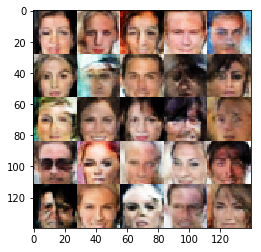

Epoch 3/7... Discriminator Loss: 0.8282 ... Generator Loss: 1.1024
Epoch 3/7... Discriminator Loss: 1.4839 ... Generator Loss: 2.5989
Epoch 3/7... Discriminator Loss: 0.9534 ... Generator Loss: 1.8682
Epoch 3/7... Discriminator Loss: 0.6270 ... Generator Loss: 1.7981
Epoch 3/7... Discriminator Loss: 0.6406 ... Generator Loss: 1.3777
Epoch 3/7... Discriminator Loss: 1.0634 ... Generator Loss: 0.8475
Epoch 3/7... Discriminator Loss: 2.3903 ... Generator Loss: 0.2945
Epoch 3/7... Discriminator Loss: 0.9648 ... Generator Loss: 0.9707
Epoch 3/7... Discriminator Loss: 0.8082 ... Generator Loss: 1.7630
Epoch 3/7... Discriminator Loss: 0.9696 ... Generator Loss: 2.5305


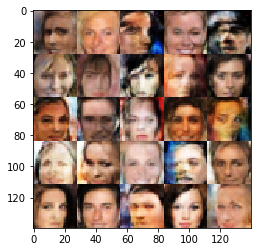

Epoch 3/7... Discriminator Loss: 0.7295 ... Generator Loss: 1.8966
Epoch 3/7... Discriminator Loss: 1.0601 ... Generator Loss: 1.9346
Epoch 3/7... Discriminator Loss: 0.7458 ... Generator Loss: 1.6432
Epoch 3/7... Discriminator Loss: 0.9379 ... Generator Loss: 1.0162
Epoch 3/7... Discriminator Loss: 0.8852 ... Generator Loss: 0.9238
Epoch 3/7... Discriminator Loss: 0.8247 ... Generator Loss: 2.1004
Epoch 3/7... Discriminator Loss: 0.7215 ... Generator Loss: 1.7789
Epoch 3/7... Discriminator Loss: 0.7957 ... Generator Loss: 1.4573
Epoch 3/7... Discriminator Loss: 0.9206 ... Generator Loss: 2.3313
Epoch 3/7... Discriminator Loss: 0.7237 ... Generator Loss: 1.5330


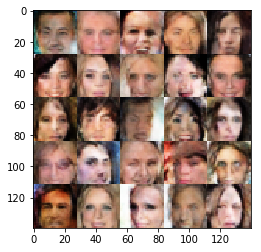

Epoch 3/7... Discriminator Loss: 1.0710 ... Generator Loss: 0.7351
Epoch 3/7... Discriminator Loss: 0.9809 ... Generator Loss: 0.8245
Epoch 3/7... Discriminator Loss: 2.8128 ... Generator Loss: 0.2297
Epoch 3/7... Discriminator Loss: 1.1846 ... Generator Loss: 0.6962
Epoch 3/7... Discriminator Loss: 1.1153 ... Generator Loss: 1.9749
Epoch 3/7... Discriminator Loss: 0.9394 ... Generator Loss: 2.7348
Epoch 3/7... Discriminator Loss: 0.8546 ... Generator Loss: 1.9048
Epoch 3/7... Discriminator Loss: 1.9631 ... Generator Loss: 0.3932
Epoch 3/7... Discriminator Loss: 0.9473 ... Generator Loss: 1.0045
Epoch 3/7... Discriminator Loss: 0.7878 ... Generator Loss: 1.5321


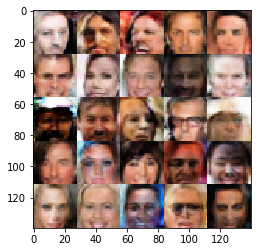

Epoch 3/7... Discriminator Loss: 0.8036 ... Generator Loss: 1.6864
Epoch 3/7... Discriminator Loss: 0.8314 ... Generator Loss: 1.4051
Epoch 3/7... Discriminator Loss: 0.8066 ... Generator Loss: 1.8512
Epoch 3/7... Discriminator Loss: 0.7500 ... Generator Loss: 2.5191
Epoch 3/7... Discriminator Loss: 0.8286 ... Generator Loss: 2.7740
Epoch 3/7... Discriminator Loss: 0.8856 ... Generator Loss: 1.6735
Epoch 3/7... Discriminator Loss: 0.7494 ... Generator Loss: 1.8940
Epoch 3/7... Discriminator Loss: 1.0400 ... Generator Loss: 2.7722
Epoch 3/7... Discriminator Loss: 1.0461 ... Generator Loss: 2.5814
Epoch 3/7... Discriminator Loss: 1.8070 ... Generator Loss: 2.3568


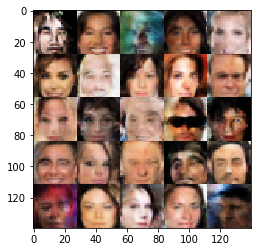

Epoch 3/7... Discriminator Loss: 0.8680 ... Generator Loss: 1.4383
Epoch 3/7... Discriminator Loss: 0.8875 ... Generator Loss: 1.8015
Epoch 3/7... Discriminator Loss: 0.8270 ... Generator Loss: 0.9665
Epoch 3/7... Discriminator Loss: 0.6850 ... Generator Loss: 1.5949
Epoch 3/7... Discriminator Loss: 2.3916 ... Generator Loss: 3.6429
Epoch 3/7... Discriminator Loss: 0.7912 ... Generator Loss: 1.2301
Epoch 3/7... Discriminator Loss: 0.6450 ... Generator Loss: 2.1773
Epoch 3/7... Discriminator Loss: 1.1694 ... Generator Loss: 2.1981
Epoch 3/7... Discriminator Loss: 0.7935 ... Generator Loss: 1.7677
Epoch 3/7... Discriminator Loss: 0.7804 ... Generator Loss: 2.6605


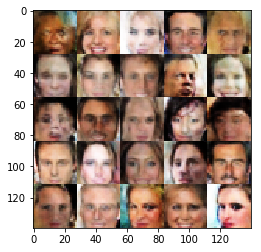

Epoch 3/7... Discriminator Loss: 0.7044 ... Generator Loss: 1.5984
Epoch 3/7... Discriminator Loss: 1.0708 ... Generator Loss: 0.8974
Epoch 3/7... Discriminator Loss: 1.3512 ... Generator Loss: 0.5563
Epoch 3/7... Discriminator Loss: 0.8567 ... Generator Loss: 1.0062
Epoch 3/7... Discriminator Loss: 0.8600 ... Generator Loss: 1.6541
Epoch 3/7... Discriminator Loss: 1.0000 ... Generator Loss: 2.4089
Epoch 3/7... Discriminator Loss: 0.7029 ... Generator Loss: 1.6257
Epoch 3/7... Discriminator Loss: 0.6587 ... Generator Loss: 1.8426
Epoch 3/7... Discriminator Loss: 0.8117 ... Generator Loss: 1.0059
Epoch 3/7... Discriminator Loss: 1.4336 ... Generator Loss: 0.5145


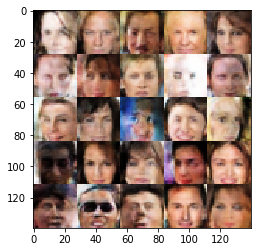

Epoch 3/7... Discriminator Loss: 0.9567 ... Generator Loss: 0.7683
Epoch 3/7... Discriminator Loss: 1.1372 ... Generator Loss: 0.5817
Epoch 3/7... Discriminator Loss: 1.1548 ... Generator Loss: 0.7419
Epoch 3/7... Discriminator Loss: 0.7282 ... Generator Loss: 1.2988
Epoch 3/7... Discriminator Loss: 0.7273 ... Generator Loss: 2.0688
Epoch 3/7... Discriminator Loss: 0.7174 ... Generator Loss: 2.2638
Epoch 3/7... Discriminator Loss: 1.2831 ... Generator Loss: 2.5963
Epoch 3/7... Discriminator Loss: 0.7628 ... Generator Loss: 1.1434
Epoch 3/7... Discriminator Loss: 0.9554 ... Generator Loss: 0.8274
Epoch 3/7... Discriminator Loss: 0.7767 ... Generator Loss: 1.1698


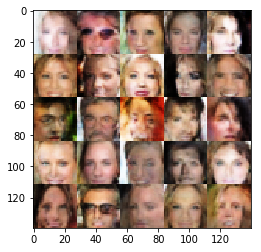

Epoch 3/7... Discriminator Loss: 0.7371 ... Generator Loss: 1.3858
Epoch 3/7... Discriminator Loss: 0.7202 ... Generator Loss: 1.8004
Epoch 3/7... Discriminator Loss: 0.7931 ... Generator Loss: 1.3264
Epoch 3/7... Discriminator Loss: 0.6365 ... Generator Loss: 1.5934
Epoch 3/7... Discriminator Loss: 1.1351 ... Generator Loss: 2.5302
Epoch 3/7... Discriminator Loss: 0.7911 ... Generator Loss: 1.4317
Epoch 3/7... Discriminator Loss: 0.8199 ... Generator Loss: 1.0350
Epoch 3/7... Discriminator Loss: 0.6460 ... Generator Loss: 1.8862
Epoch 3/7... Discriminator Loss: 0.8411 ... Generator Loss: 1.7163
Epoch 3/7... Discriminator Loss: 0.8375 ... Generator Loss: 1.6307


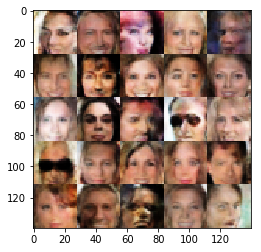

Epoch 3/7... Discriminator Loss: 0.8164 ... Generator Loss: 1.1925
Epoch 3/7... Discriminator Loss: 0.7595 ... Generator Loss: 2.3783
Epoch 3/7... Discriminator Loss: 0.9660 ... Generator Loss: 2.4628
Epoch 3/7... Discriminator Loss: 0.7922 ... Generator Loss: 1.4326
Epoch 3/7... Discriminator Loss: 0.9293 ... Generator Loss: 3.2389
Epoch 3/7... Discriminator Loss: 0.6893 ... Generator Loss: 1.1507
Epoch 3/7... Discriminator Loss: 0.8118 ... Generator Loss: 1.0204
Epoch 3/7... Discriminator Loss: 0.7688 ... Generator Loss: 1.4712
Epoch 3/7... Discriminator Loss: 0.7764 ... Generator Loss: 1.3111
Epoch 3/7... Discriminator Loss: 3.4606 ... Generator Loss: 0.2603


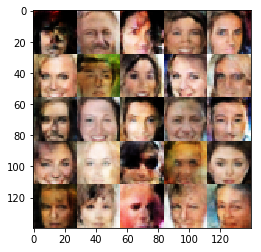

Epoch 3/7... Discriminator Loss: 0.9173 ... Generator Loss: 1.4119
Epoch 3/7... Discriminator Loss: 1.2681 ... Generator Loss: 0.6697
Epoch 3/7... Discriminator Loss: 0.9700 ... Generator Loss: 0.9378
Epoch 3/7... Discriminator Loss: 0.7411 ... Generator Loss: 1.5466
Epoch 3/7... Discriminator Loss: 0.7385 ... Generator Loss: 1.1328
Epoch 3/7... Discriminator Loss: 0.6890 ... Generator Loss: 1.8828
Epoch 3/7... Discriminator Loss: 3.1197 ... Generator Loss: 3.7872
Epoch 3/7... Discriminator Loss: 0.7152 ... Generator Loss: 1.7779
Epoch 3/7... Discriminator Loss: 0.7619 ... Generator Loss: 1.5594
Epoch 3/7... Discriminator Loss: 0.8052 ... Generator Loss: 1.3557


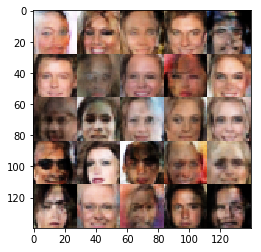

Epoch 3/7... Discriminator Loss: 0.5334 ... Generator Loss: 2.2361
Epoch 3/7... Discriminator Loss: 0.7599 ... Generator Loss: 1.7455
Epoch 3/7... Discriminator Loss: 1.5933 ... Generator Loss: 0.4276
Epoch 3/7... Discriminator Loss: 1.0113 ... Generator Loss: 0.8521
Epoch 3/7... Discriminator Loss: 0.6615 ... Generator Loss: 1.6806
Epoch 3/7... Discriminator Loss: 0.7264 ... Generator Loss: 1.5295
Epoch 3/7... Discriminator Loss: 0.7395 ... Generator Loss: 2.0361
Epoch 3/7... Discriminator Loss: 0.7915 ... Generator Loss: 1.1883
Epoch 3/7... Discriminator Loss: 1.0947 ... Generator Loss: 2.6827
Epoch 3/7... Discriminator Loss: 0.4978 ... Generator Loss: 2.2774


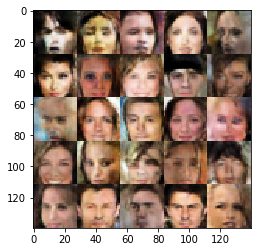

Epoch 3/7... Discriminator Loss: 2.4731 ... Generator Loss: 3.6541
Epoch 3/7... Discriminator Loss: 1.0421 ... Generator Loss: 1.0180
Epoch 3/7... Discriminator Loss: 0.8823 ... Generator Loss: 1.1730
Epoch 3/7... Discriminator Loss: 0.6612 ... Generator Loss: 1.6294
Epoch 3/7... Discriminator Loss: 0.7016 ... Generator Loss: 1.6222
Epoch 3/7... Discriminator Loss: 1.5369 ... Generator Loss: 0.4440
Epoch 3/7... Discriminator Loss: 0.8036 ... Generator Loss: 1.6109
Epoch 3/7... Discriminator Loss: 1.3238 ... Generator Loss: 0.7050
Epoch 3/7... Discriminator Loss: 0.6006 ... Generator Loss: 1.7892
Epoch 3/7... Discriminator Loss: 2.0241 ... Generator Loss: 2.6570


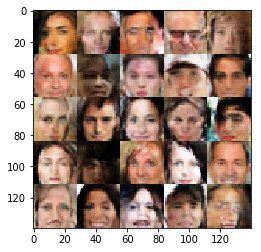

Epoch 3/7... Discriminator Loss: 0.6572 ... Generator Loss: 2.1582
Epoch 3/7... Discriminator Loss: 0.8523 ... Generator Loss: 1.2334
Epoch 3/7... Discriminator Loss: 0.8569 ... Generator Loss: 0.9627
Epoch 3/7... Discriminator Loss: 0.7042 ... Generator Loss: 1.1039
Epoch 3/7... Discriminator Loss: 0.9897 ... Generator Loss: 0.9154
Epoch 3/7... Discriminator Loss: 0.7677 ... Generator Loss: 1.9891
Epoch 3/7... Discriminator Loss: 0.8818 ... Generator Loss: 1.1913
Epoch 3/7... Discriminator Loss: 0.8118 ... Generator Loss: 1.6845
Epoch 3/7... Discriminator Loss: 0.8304 ... Generator Loss: 3.2293
Epoch 3/7... Discriminator Loss: 2.6458 ... Generator Loss: 3.1029


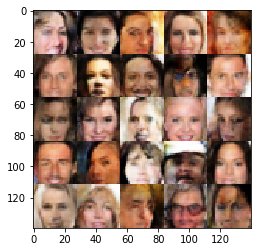

Epoch 3/7... Discriminator Loss: 0.6802 ... Generator Loss: 2.1368
Epoch 3/7... Discriminator Loss: 1.3587 ... Generator Loss: 3.3072
Epoch 3/7... Discriminator Loss: 0.8551 ... Generator Loss: 1.2114
Epoch 3/7... Discriminator Loss: 0.7300 ... Generator Loss: 1.2330
Epoch 3/7... Discriminator Loss: 0.7720 ... Generator Loss: 1.6492
Epoch 3/7... Discriminator Loss: 0.6811 ... Generator Loss: 1.6470
Epoch 3/7... Discriminator Loss: 0.6860 ... Generator Loss: 1.7982
Epoch 3/7... Discriminator Loss: 0.6835 ... Generator Loss: 1.9467
Epoch 3/7... Discriminator Loss: 1.0831 ... Generator Loss: 2.0029
Epoch 3/7... Discriminator Loss: 1.0281 ... Generator Loss: 2.5337


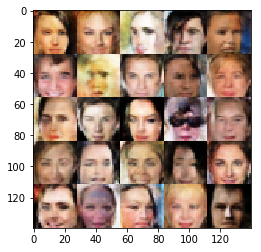

Epoch 3/7... Discriminator Loss: 0.6523 ... Generator Loss: 2.0057
Epoch 3/7... Discriminator Loss: 0.6542 ... Generator Loss: 1.8881
Epoch 3/7... Discriminator Loss: 1.2804 ... Generator Loss: 3.3220
Epoch 3/7... Discriminator Loss: 0.8918 ... Generator Loss: 1.1239
Epoch 3/7... Discriminator Loss: 1.1336 ... Generator Loss: 0.7909
Epoch 3/7... Discriminator Loss: 0.7969 ... Generator Loss: 2.4516
Epoch 3/7... Discriminator Loss: 0.7497 ... Generator Loss: 1.5257
Epoch 3/7... Discriminator Loss: 0.7259 ... Generator Loss: 2.9311
Epoch 3/7... Discriminator Loss: 3.2150 ... Generator Loss: 3.7093
Epoch 3/7... Discriminator Loss: 0.9552 ... Generator Loss: 1.1041


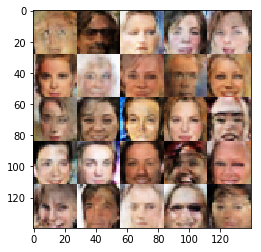

Epoch 3/7... Discriminator Loss: 0.6568 ... Generator Loss: 1.4856
Epoch 3/7... Discriminator Loss: 1.1772 ... Generator Loss: 0.5748
Epoch 3/7... Discriminator Loss: 0.7939 ... Generator Loss: 1.5363
Epoch 3/7... Discriminator Loss: 0.9949 ... Generator Loss: 0.9765
Epoch 3/7... Discriminator Loss: 1.1003 ... Generator Loss: 2.1346
Epoch 3/7... Discriminator Loss: 0.8362 ... Generator Loss: 2.1920
Epoch 3/7... Discriminator Loss: 2.1427 ... Generator Loss: 2.8349
Epoch 3/7... Discriminator Loss: 0.9086 ... Generator Loss: 0.9862
Epoch 3/7... Discriminator Loss: 0.8228 ... Generator Loss: 1.3397
Epoch 3/7... Discriminator Loss: 0.7151 ... Generator Loss: 2.2386


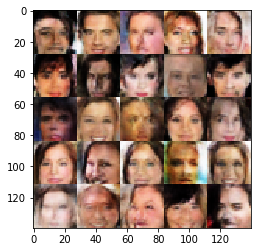

Epoch 3/7... Discriminator Loss: 0.7352 ... Generator Loss: 1.4735
Epoch 3/7... Discriminator Loss: 0.7868 ... Generator Loss: 1.1018
Epoch 3/7... Discriminator Loss: 0.6121 ... Generator Loss: 1.8886
Epoch 3/7... Discriminator Loss: 0.9261 ... Generator Loss: 1.0921
Epoch 3/7... Discriminator Loss: 0.7861 ... Generator Loss: 1.1395
Epoch 3/7... Discriminator Loss: 0.5681 ... Generator Loss: 2.3302
Epoch 3/7... Discriminator Loss: 0.5599 ... Generator Loss: 2.9602
Epoch 3/7... Discriminator Loss: 0.4788 ... Generator Loss: 2.0750
Epoch 3/7... Discriminator Loss: 0.5750 ... Generator Loss: 1.9416
Epoch 3/7... Discriminator Loss: 0.5221 ... Generator Loss: 2.6636


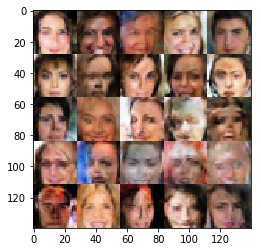

Epoch 3/7... Discriminator Loss: 0.6518 ... Generator Loss: 3.6492
Epoch 3/7... Discriminator Loss: 1.2314 ... Generator Loss: 1.3987
Epoch 3/7... Discriminator Loss: 0.7323 ... Generator Loss: 1.5665
Epoch 3/7... Discriminator Loss: 0.6689 ... Generator Loss: 2.1498
Epoch 3/7... Discriminator Loss: 0.6709 ... Generator Loss: 1.6019
Epoch 3/7... Discriminator Loss: 0.5538 ... Generator Loss: 2.1840
Epoch 3/7... Discriminator Loss: 0.5701 ... Generator Loss: 2.2470
Epoch 3/7... Discriminator Loss: 0.5541 ... Generator Loss: 2.5593
Epoch 3/7... Discriminator Loss: 0.5028 ... Generator Loss: 2.4211
Epoch 4/7... Discriminator Loss: 0.4560 ... Generator Loss: 2.1467


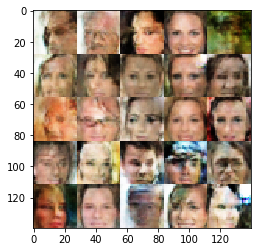

Epoch 4/7... Discriminator Loss: 0.5668 ... Generator Loss: 2.1308
Epoch 4/7... Discriminator Loss: 0.5574 ... Generator Loss: 2.7714
Epoch 4/7... Discriminator Loss: 2.2543 ... Generator Loss: 0.3659
Epoch 4/7... Discriminator Loss: 0.7488 ... Generator Loss: 1.4397
Epoch 4/7... Discriminator Loss: 1.3933 ... Generator Loss: 0.6853
Epoch 4/7... Discriminator Loss: 0.6867 ... Generator Loss: 1.6891
Epoch 4/7... Discriminator Loss: 1.1304 ... Generator Loss: 0.6740
Epoch 4/7... Discriminator Loss: 0.6125 ... Generator Loss: 2.4492
Epoch 4/7... Discriminator Loss: 0.6938 ... Generator Loss: 2.7839
Epoch 4/7... Discriminator Loss: 0.7194 ... Generator Loss: 1.9660


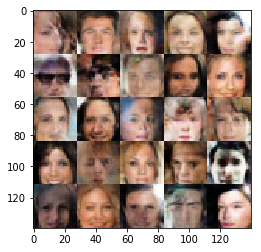

Epoch 4/7... Discriminator Loss: 0.9397 ... Generator Loss: 2.0471
Epoch 4/7... Discriminator Loss: 0.7437 ... Generator Loss: 1.6911
Epoch 4/7... Discriminator Loss: 0.6963 ... Generator Loss: 1.8834
Epoch 4/7... Discriminator Loss: 1.1515 ... Generator Loss: 0.8854
Epoch 4/7... Discriminator Loss: 0.5785 ... Generator Loss: 2.1542
Epoch 4/7... Discriminator Loss: 0.6529 ... Generator Loss: 1.8539
Epoch 4/7... Discriminator Loss: 1.8308 ... Generator Loss: 2.6293
Epoch 4/7... Discriminator Loss: 0.7144 ... Generator Loss: 1.2975
Epoch 4/7... Discriminator Loss: 0.7784 ... Generator Loss: 1.1875
Epoch 4/7... Discriminator Loss: 0.9649 ... Generator Loss: 0.9159


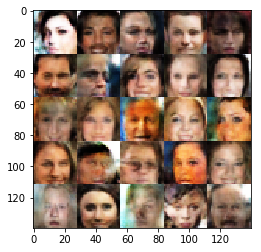

Epoch 4/7... Discriminator Loss: 0.6626 ... Generator Loss: 1.8146
Epoch 4/7... Discriminator Loss: 0.7598 ... Generator Loss: 2.4116
Epoch 4/7... Discriminator Loss: 0.7122 ... Generator Loss: 1.3886
Epoch 4/7... Discriminator Loss: 0.6703 ... Generator Loss: 1.3680
Epoch 4/7... Discriminator Loss: 0.8709 ... Generator Loss: 1.2139
Epoch 4/7... Discriminator Loss: 1.0650 ... Generator Loss: 0.9580
Epoch 4/7... Discriminator Loss: 1.1654 ... Generator Loss: 0.6307
Epoch 4/7... Discriminator Loss: 0.5761 ... Generator Loss: 1.6347
Epoch 4/7... Discriminator Loss: 0.8703 ... Generator Loss: 2.0080
Epoch 4/7... Discriminator Loss: 0.7446 ... Generator Loss: 1.6541


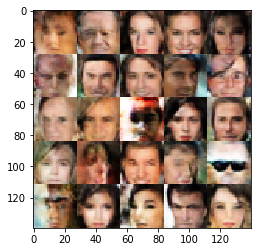

Epoch 4/7... Discriminator Loss: 0.6893 ... Generator Loss: 2.2489
Epoch 4/7... Discriminator Loss: 0.8385 ... Generator Loss: 1.0975
Epoch 4/7... Discriminator Loss: 0.5263 ... Generator Loss: 2.0744
Epoch 4/7... Discriminator Loss: 0.6292 ... Generator Loss: 1.5118
Epoch 4/7... Discriminator Loss: 1.6622 ... Generator Loss: 0.6326
Epoch 4/7... Discriminator Loss: 0.7336 ... Generator Loss: 1.4394
Epoch 4/7... Discriminator Loss: 0.7854 ... Generator Loss: 2.0630
Epoch 4/7... Discriminator Loss: 0.5705 ... Generator Loss: 2.6179
Epoch 4/7... Discriminator Loss: 0.7071 ... Generator Loss: 1.1801
Epoch 4/7... Discriminator Loss: 0.6005 ... Generator Loss: 1.8226


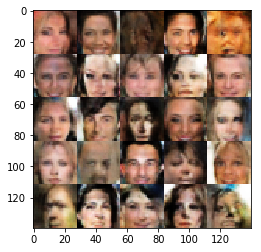

Epoch 4/7... Discriminator Loss: 0.5841 ... Generator Loss: 2.2148
Epoch 4/7... Discriminator Loss: 1.0718 ... Generator Loss: 1.0745
Epoch 4/7... Discriminator Loss: 0.5529 ... Generator Loss: 2.7567
Epoch 4/7... Discriminator Loss: 0.7075 ... Generator Loss: 1.8163
Epoch 4/7... Discriminator Loss: 1.2529 ... Generator Loss: 0.8381
Epoch 4/7... Discriminator Loss: 0.5451 ... Generator Loss: 1.8464
Epoch 4/7... Discriminator Loss: 1.5741 ... Generator Loss: 0.4729
Epoch 4/7... Discriminator Loss: 1.1121 ... Generator Loss: 0.7413
Epoch 4/7... Discriminator Loss: 0.6629 ... Generator Loss: 2.1934
Epoch 4/7... Discriminator Loss: 0.6816 ... Generator Loss: 1.2734


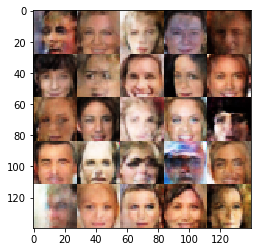

Epoch 4/7... Discriminator Loss: 0.9832 ... Generator Loss: 3.9342
Epoch 4/7... Discriminator Loss: 0.5222 ... Generator Loss: 2.5780
Epoch 4/7... Discriminator Loss: 0.6216 ... Generator Loss: 1.8651
Epoch 4/7... Discriminator Loss: 0.5268 ... Generator Loss: 1.8926
Epoch 4/7... Discriminator Loss: 2.0675 ... Generator Loss: 0.2937
Epoch 4/7... Discriminator Loss: 1.1668 ... Generator Loss: 0.7297
Epoch 4/7... Discriminator Loss: 0.6947 ... Generator Loss: 2.0694
Epoch 4/7... Discriminator Loss: 0.5839 ... Generator Loss: 3.0494
Epoch 4/7... Discriminator Loss: 0.6706 ... Generator Loss: 1.4386
Epoch 4/7... Discriminator Loss: 0.6424 ... Generator Loss: 2.0103


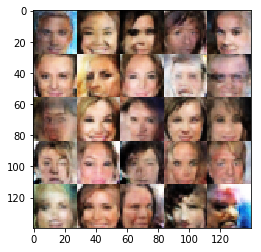

Epoch 4/7... Discriminator Loss: 0.8823 ... Generator Loss: 2.5343
Epoch 4/7... Discriminator Loss: 0.5772 ... Generator Loss: 2.3203
Epoch 4/7... Discriminator Loss: 0.6593 ... Generator Loss: 1.8884
Epoch 4/7... Discriminator Loss: 0.5774 ... Generator Loss: 2.5936
Epoch 4/7... Discriminator Loss: 1.0337 ... Generator Loss: 1.0773
Epoch 4/7... Discriminator Loss: 0.7764 ... Generator Loss: 1.1429
Epoch 4/7... Discriminator Loss: 0.7332 ... Generator Loss: 2.5926
Epoch 4/7... Discriminator Loss: 2.5224 ... Generator Loss: 0.2854
Epoch 4/7... Discriminator Loss: 0.8882 ... Generator Loss: 2.1628
Epoch 4/7... Discriminator Loss: 0.7264 ... Generator Loss: 2.3194


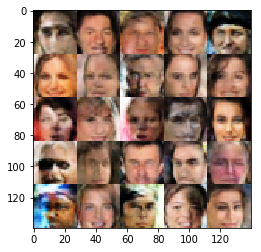

Epoch 4/7... Discriminator Loss: 0.6196 ... Generator Loss: 1.8158
Epoch 4/7... Discriminator Loss: 1.1630 ... Generator Loss: 0.7600
Epoch 4/7... Discriminator Loss: 0.6715 ... Generator Loss: 1.3960
Epoch 4/7... Discriminator Loss: 0.8590 ... Generator Loss: 2.2958
Epoch 4/7... Discriminator Loss: 0.7330 ... Generator Loss: 2.2004
Epoch 4/7... Discriminator Loss: 0.8901 ... Generator Loss: 1.1665
Epoch 4/7... Discriminator Loss: 0.5462 ... Generator Loss: 2.6572
Epoch 4/7... Discriminator Loss: 0.6719 ... Generator Loss: 2.4528
Epoch 4/7... Discriminator Loss: 0.5445 ... Generator Loss: 2.4574
Epoch 4/7... Discriminator Loss: 0.6132 ... Generator Loss: 2.2185


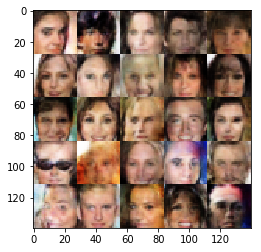

Epoch 4/7... Discriminator Loss: 0.7663 ... Generator Loss: 1.2128
Epoch 4/7... Discriminator Loss: 1.5344 ... Generator Loss: 0.4675
Epoch 4/7... Discriminator Loss: 1.0590 ... Generator Loss: 2.5426
Epoch 4/7... Discriminator Loss: 0.7084 ... Generator Loss: 1.2080
Epoch 4/7... Discriminator Loss: 1.8324 ... Generator Loss: 3.5072
Epoch 4/7... Discriminator Loss: 0.6550 ... Generator Loss: 1.7392
Epoch 4/7... Discriminator Loss: 1.1746 ... Generator Loss: 0.6869
Epoch 4/7... Discriminator Loss: 0.7261 ... Generator Loss: 1.5864
Epoch 4/7... Discriminator Loss: 0.6512 ... Generator Loss: 2.4656
Epoch 4/7... Discriminator Loss: 0.6873 ... Generator Loss: 1.8696


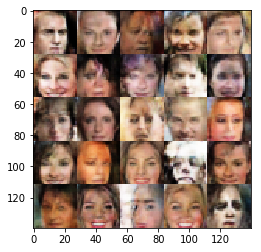

Epoch 4/7... Discriminator Loss: 0.8281 ... Generator Loss: 1.6573
Epoch 4/7... Discriminator Loss: 0.5541 ... Generator Loss: 2.4417
Epoch 4/7... Discriminator Loss: 0.5201 ... Generator Loss: 2.5525
Epoch 4/7... Discriminator Loss: 0.6175 ... Generator Loss: 1.8779
Epoch 4/7... Discriminator Loss: 0.7076 ... Generator Loss: 1.7415
Epoch 4/7... Discriminator Loss: 0.8956 ... Generator Loss: 1.0199
Epoch 4/7... Discriminator Loss: 0.8739 ... Generator Loss: 1.0711
Epoch 4/7... Discriminator Loss: 0.5615 ... Generator Loss: 2.8618
Epoch 4/7... Discriminator Loss: 0.7267 ... Generator Loss: 1.5722
Epoch 4/7... Discriminator Loss: 0.6288 ... Generator Loss: 2.6903


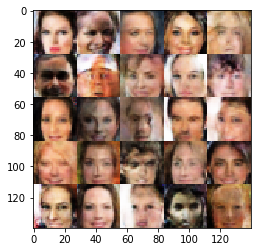

Epoch 4/7... Discriminator Loss: 0.5229 ... Generator Loss: 2.4644
Epoch 4/7... Discriminator Loss: 0.6454 ... Generator Loss: 1.9369
Epoch 4/7... Discriminator Loss: 0.6990 ... Generator Loss: 3.3754
Epoch 4/7... Discriminator Loss: 0.4693 ... Generator Loss: 2.9185
Epoch 4/7... Discriminator Loss: 0.6473 ... Generator Loss: 3.0038
Epoch 4/7... Discriminator Loss: 0.6850 ... Generator Loss: 1.5187
Epoch 4/7... Discriminator Loss: 1.5415 ... Generator Loss: 0.4406
Epoch 4/7... Discriminator Loss: 1.5776 ... Generator Loss: 0.5571
Epoch 4/7... Discriminator Loss: 0.7982 ... Generator Loss: 1.1006
Epoch 4/7... Discriminator Loss: 0.5316 ... Generator Loss: 2.2950


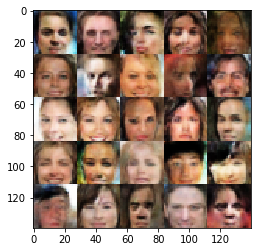

Epoch 4/7... Discriminator Loss: 0.6985 ... Generator Loss: 1.9264
Epoch 4/7... Discriminator Loss: 0.5766 ... Generator Loss: 2.1082
Epoch 4/7... Discriminator Loss: 0.6830 ... Generator Loss: 1.2558
Epoch 4/7... Discriminator Loss: 1.0719 ... Generator Loss: 0.8459
Epoch 4/7... Discriminator Loss: 0.6074 ... Generator Loss: 2.3954
Epoch 4/7... Discriminator Loss: 0.6353 ... Generator Loss: 2.0940
Epoch 4/7... Discriminator Loss: 0.5679 ... Generator Loss: 2.0346
Epoch 4/7... Discriminator Loss: 2.7102 ... Generator Loss: 0.2595
Epoch 4/7... Discriminator Loss: 1.1166 ... Generator Loss: 0.7252
Epoch 4/7... Discriminator Loss: 0.9701 ... Generator Loss: 1.3683


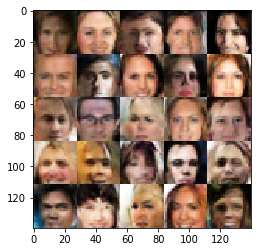

Epoch 4/7... Discriminator Loss: 3.1042 ... Generator Loss: 3.9051
Epoch 4/7... Discriminator Loss: 0.7631 ... Generator Loss: 2.2798
Epoch 4/7... Discriminator Loss: 0.5963 ... Generator Loss: 2.0191
Epoch 4/7... Discriminator Loss: 0.6811 ... Generator Loss: 3.3064
Epoch 4/7... Discriminator Loss: 0.7268 ... Generator Loss: 1.6678
Epoch 4/7... Discriminator Loss: 0.6287 ... Generator Loss: 1.6899
Epoch 4/7... Discriminator Loss: 0.9808 ... Generator Loss: 1.0047
Epoch 4/7... Discriminator Loss: 1.2191 ... Generator Loss: 2.6554
Epoch 4/7... Discriminator Loss: 0.8099 ... Generator Loss: 1.0967
Epoch 4/7... Discriminator Loss: 0.6846 ... Generator Loss: 2.0092


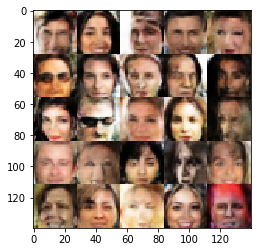

Epoch 4/7... Discriminator Loss: 0.4979 ... Generator Loss: 3.3261
Epoch 4/7... Discriminator Loss: 0.6911 ... Generator Loss: 3.5358
Epoch 4/7... Discriminator Loss: 0.7357 ... Generator Loss: 3.0491
Epoch 4/7... Discriminator Loss: 0.6052 ... Generator Loss: 1.8547
Epoch 4/7... Discriminator Loss: 0.7230 ... Generator Loss: 2.9465
Epoch 4/7... Discriminator Loss: 0.4886 ... Generator Loss: 2.9956
Epoch 4/7... Discriminator Loss: 0.4865 ... Generator Loss: 3.6477
Epoch 4/7... Discriminator Loss: 0.5455 ... Generator Loss: 2.3138
Epoch 4/7... Discriminator Loss: 0.5323 ... Generator Loss: 3.0173
Epoch 4/7... Discriminator Loss: 0.5046 ... Generator Loss: 2.7054


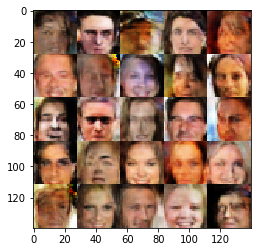

Epoch 4/7... Discriminator Loss: 0.4321 ... Generator Loss: 2.8617
Epoch 4/7... Discriminator Loss: 0.6549 ... Generator Loss: 2.2976
Epoch 4/7... Discriminator Loss: 0.7242 ... Generator Loss: 1.4224
Epoch 4/7... Discriminator Loss: 1.2377 ... Generator Loss: 0.7504
Epoch 4/7... Discriminator Loss: 1.9175 ... Generator Loss: 0.4036
Epoch 4/7... Discriminator Loss: 0.8609 ... Generator Loss: 1.3367
Epoch 4/7... Discriminator Loss: 1.1901 ... Generator Loss: 2.3279
Epoch 4/7... Discriminator Loss: 0.9134 ... Generator Loss: 1.0439
Epoch 4/7... Discriminator Loss: 0.9983 ... Generator Loss: 0.9566
Epoch 4/7... Discriminator Loss: 1.6957 ... Generator Loss: 2.8575


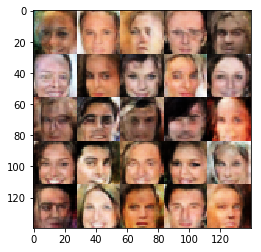

Epoch 4/7... Discriminator Loss: 0.8772 ... Generator Loss: 2.2594
Epoch 4/7... Discriminator Loss: 0.7683 ... Generator Loss: 2.2338
Epoch 4/7... Discriminator Loss: 0.9101 ... Generator Loss: 3.3733
Epoch 4/7... Discriminator Loss: 0.8988 ... Generator Loss: 1.0694
Epoch 4/7... Discriminator Loss: 1.1421 ... Generator Loss: 2.2190
Epoch 4/7... Discriminator Loss: 0.8443 ... Generator Loss: 1.8755
Epoch 4/7... Discriminator Loss: 0.8968 ... Generator Loss: 3.1886
Epoch 4/7... Discriminator Loss: 0.7637 ... Generator Loss: 3.0619
Epoch 4/7... Discriminator Loss: 0.6345 ... Generator Loss: 1.6454
Epoch 4/7... Discriminator Loss: 0.6339 ... Generator Loss: 1.9024


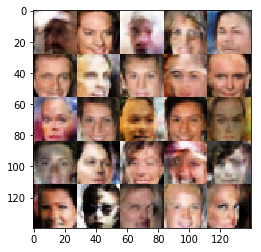

Epoch 4/7... Discriminator Loss: 0.6093 ... Generator Loss: 1.3596
Epoch 4/7... Discriminator Loss: 0.9996 ... Generator Loss: 0.7353
Epoch 4/7... Discriminator Loss: 2.2704 ... Generator Loss: 0.3510
Epoch 4/7... Discriminator Loss: 0.9880 ... Generator Loss: 1.0411
Epoch 4/7... Discriminator Loss: 1.2387 ... Generator Loss: 0.7658
Epoch 4/7... Discriminator Loss: 1.5025 ... Generator Loss: 2.8456
Epoch 4/7... Discriminator Loss: 1.2056 ... Generator Loss: 0.8981
Epoch 4/7... Discriminator Loss: 0.9329 ... Generator Loss: 2.1149
Epoch 4/7... Discriminator Loss: 0.7090 ... Generator Loss: 1.5674
Epoch 4/7... Discriminator Loss: 0.7626 ... Generator Loss: 2.3123


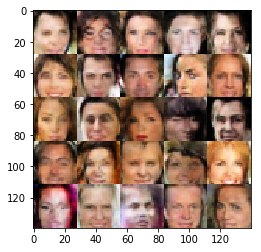

Epoch 4/7... Discriminator Loss: 0.6995 ... Generator Loss: 2.0583
Epoch 4/7... Discriminator Loss: 0.9144 ... Generator Loss: 1.0769
Epoch 4/7... Discriminator Loss: 0.5231 ... Generator Loss: 2.0540
Epoch 4/7... Discriminator Loss: 0.5942 ... Generator Loss: 1.9678
Epoch 4/7... Discriminator Loss: 1.7781 ... Generator Loss: 1.9477
Epoch 4/7... Discriminator Loss: 0.9310 ... Generator Loss: 1.2357
Epoch 4/7... Discriminator Loss: 2.2770 ... Generator Loss: 3.8050
Epoch 4/7... Discriminator Loss: 1.1246 ... Generator Loss: 2.1658
Epoch 4/7... Discriminator Loss: 0.8303 ... Generator Loss: 2.8959
Epoch 4/7... Discriminator Loss: 0.8898 ... Generator Loss: 1.8225


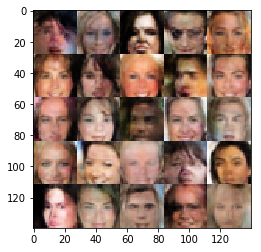

Epoch 4/7... Discriminator Loss: 0.7406 ... Generator Loss: 1.5369
Epoch 4/7... Discriminator Loss: 0.6829 ... Generator Loss: 1.7212
Epoch 4/7... Discriminator Loss: 0.8119 ... Generator Loss: 1.4576
Epoch 4/7... Discriminator Loss: 0.8772 ... Generator Loss: 1.0202
Epoch 4/7... Discriminator Loss: 0.5556 ... Generator Loss: 2.4524
Epoch 4/7... Discriminator Loss: 1.3041 ... Generator Loss: 3.1458
Epoch 4/7... Discriminator Loss: 0.8350 ... Generator Loss: 1.5636
Epoch 4/7... Discriminator Loss: 0.9039 ... Generator Loss: 2.0745
Epoch 4/7... Discriminator Loss: 0.7614 ... Generator Loss: 1.8807
Epoch 4/7... Discriminator Loss: 0.6252 ... Generator Loss: 2.0460


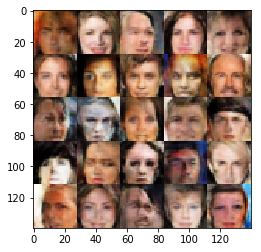

Epoch 4/7... Discriminator Loss: 1.4314 ... Generator Loss: 0.5732
Epoch 4/7... Discriminator Loss: 0.7645 ... Generator Loss: 1.6271
Epoch 4/7... Discriminator Loss: 1.2735 ... Generator Loss: 0.6065
Epoch 4/7... Discriminator Loss: 0.9118 ... Generator Loss: 1.1516
Epoch 4/7... Discriminator Loss: 0.7834 ... Generator Loss: 1.1995
Epoch 4/7... Discriminator Loss: 0.6812 ... Generator Loss: 1.7010
Epoch 4/7... Discriminator Loss: 0.8131 ... Generator Loss: 1.3580
Epoch 4/7... Discriminator Loss: 0.7696 ... Generator Loss: 1.2551
Epoch 4/7... Discriminator Loss: 1.5752 ... Generator Loss: 2.8216
Epoch 4/7... Discriminator Loss: 0.6763 ... Generator Loss: 1.8663


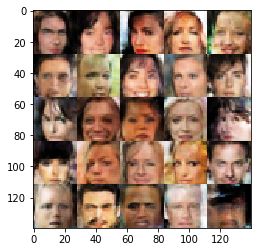

Epoch 4/7... Discriminator Loss: 0.7974 ... Generator Loss: 2.6904
Epoch 4/7... Discriminator Loss: 0.7055 ... Generator Loss: 1.5242
Epoch 4/7... Discriminator Loss: 1.3256 ... Generator Loss: 2.5676
Epoch 4/7... Discriminator Loss: 0.8498 ... Generator Loss: 2.0369
Epoch 4/7... Discriminator Loss: 0.8172 ... Generator Loss: 1.8165
Epoch 4/7... Discriminator Loss: 0.7249 ... Generator Loss: 2.7136
Epoch 4/7... Discriminator Loss: 0.6586 ... Generator Loss: 1.4241
Epoch 4/7... Discriminator Loss: 0.4821 ... Generator Loss: 2.8498
Epoch 4/7... Discriminator Loss: 0.6257 ... Generator Loss: 1.5858
Epoch 4/7... Discriminator Loss: 0.7008 ... Generator Loss: 1.9481


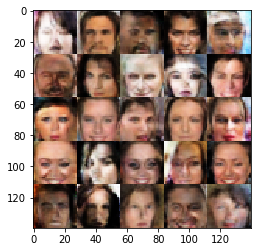

Epoch 4/7... Discriminator Loss: 1.2483 ... Generator Loss: 0.7254
Epoch 4/7... Discriminator Loss: 0.5987 ... Generator Loss: 2.1255
Epoch 4/7... Discriminator Loss: 1.3171 ... Generator Loss: 0.7476
Epoch 4/7... Discriminator Loss: 1.0478 ... Generator Loss: 0.8897
Epoch 4/7... Discriminator Loss: 0.9746 ... Generator Loss: 1.1226
Epoch 4/7... Discriminator Loss: 0.7000 ... Generator Loss: 1.9430
Epoch 4/7... Discriminator Loss: 0.6431 ... Generator Loss: 1.6157
Epoch 4/7... Discriminator Loss: 0.7560 ... Generator Loss: 1.4985
Epoch 4/7... Discriminator Loss: 0.8902 ... Generator Loss: 2.7185
Epoch 4/7... Discriminator Loss: 1.3196 ... Generator Loss: 3.1190


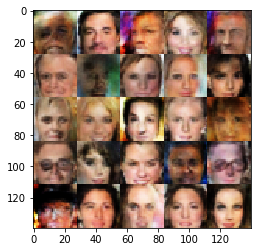

Epoch 4/7... Discriminator Loss: 0.6825 ... Generator Loss: 1.7814
Epoch 4/7... Discriminator Loss: 0.7684 ... Generator Loss: 1.7943
Epoch 4/7... Discriminator Loss: 1.0221 ... Generator Loss: 3.3630
Epoch 4/7... Discriminator Loss: 0.7087 ... Generator Loss: 2.8778
Epoch 4/7... Discriminator Loss: 0.4342 ... Generator Loss: 2.5895
Epoch 4/7... Discriminator Loss: 0.8652 ... Generator Loss: 1.8530
Epoch 4/7... Discriminator Loss: 0.6276 ... Generator Loss: 1.6820
Epoch 4/7... Discriminator Loss: 1.0578 ... Generator Loss: 0.8001
Epoch 4/7... Discriminator Loss: 0.7709 ... Generator Loss: 2.7799
Epoch 4/7... Discriminator Loss: 0.7948 ... Generator Loss: 2.6173


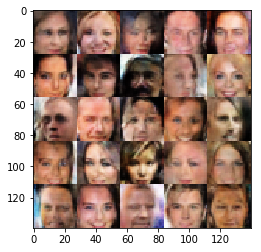

Epoch 4/7... Discriminator Loss: 1.9698 ... Generator Loss: 2.9009
Epoch 4/7... Discriminator Loss: 0.6981 ... Generator Loss: 1.6164
Epoch 4/7... Discriminator Loss: 1.7661 ... Generator Loss: 2.8710
Epoch 4/7... Discriminator Loss: 0.6326 ... Generator Loss: 3.6814
Epoch 4/7... Discriminator Loss: 0.7155 ... Generator Loss: 1.3314
Epoch 4/7... Discriminator Loss: 0.7146 ... Generator Loss: 1.4064
Epoch 4/7... Discriminator Loss: 0.6372 ... Generator Loss: 1.7474
Epoch 4/7... Discriminator Loss: 0.7348 ... Generator Loss: 1.4293
Epoch 4/7... Discriminator Loss: 0.9404 ... Generator Loss: 0.8762
Epoch 4/7... Discriminator Loss: 1.2861 ... Generator Loss: 2.9703


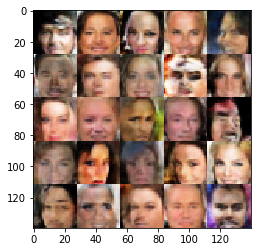

Epoch 4/7... Discriminator Loss: 1.0445 ... Generator Loss: 3.5943
Epoch 4/7... Discriminator Loss: 0.8306 ... Generator Loss: 2.0975
Epoch 4/7... Discriminator Loss: 0.8037 ... Generator Loss: 2.3705
Epoch 4/7... Discriminator Loss: 1.6685 ... Generator Loss: 2.9528
Epoch 4/7... Discriminator Loss: 0.6110 ... Generator Loss: 1.6126
Epoch 4/7... Discriminator Loss: 1.4297 ... Generator Loss: 0.5703
Epoch 4/7... Discriminator Loss: 0.7964 ... Generator Loss: 1.6405
Epoch 4/7... Discriminator Loss: 0.7426 ... Generator Loss: 2.5597
Epoch 4/7... Discriminator Loss: 0.5704 ... Generator Loss: 3.0582
Epoch 4/7... Discriminator Loss: 0.6981 ... Generator Loss: 1.7448


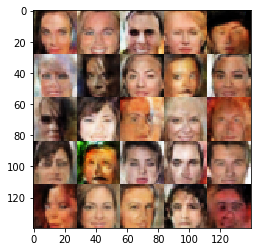

Epoch 4/7... Discriminator Loss: 1.5382 ... Generator Loss: 2.5776
Epoch 4/7... Discriminator Loss: 0.7996 ... Generator Loss: 2.3875
Epoch 4/7... Discriminator Loss: 0.6606 ... Generator Loss: 2.1303
Epoch 4/7... Discriminator Loss: 1.1149 ... Generator Loss: 0.7790
Epoch 4/7... Discriminator Loss: 0.6064 ... Generator Loss: 2.5679
Epoch 4/7... Discriminator Loss: 0.7893 ... Generator Loss: 1.0964
Epoch 4/7... Discriminator Loss: 0.6485 ... Generator Loss: 2.6699
Epoch 4/7... Discriminator Loss: 0.6149 ... Generator Loss: 2.0403
Epoch 4/7... Discriminator Loss: 1.0526 ... Generator Loss: 2.1994
Epoch 4/7... Discriminator Loss: 0.5633 ... Generator Loss: 1.8370


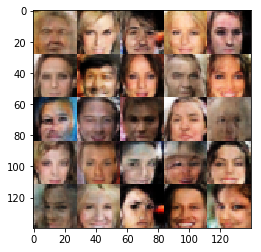

Epoch 4/7... Discriminator Loss: 0.6369 ... Generator Loss: 2.1374
Epoch 4/7... Discriminator Loss: 0.5328 ... Generator Loss: 1.9622
Epoch 4/7... Discriminator Loss: 1.3269 ... Generator Loss: 3.0019
Epoch 4/7... Discriminator Loss: 0.8588 ... Generator Loss: 1.6689
Epoch 4/7... Discriminator Loss: 0.7556 ... Generator Loss: 1.5593
Epoch 4/7... Discriminator Loss: 0.6071 ... Generator Loss: 1.7867
Epoch 4/7... Discriminator Loss: 1.4357 ... Generator Loss: 0.5078
Epoch 4/7... Discriminator Loss: 0.7398 ... Generator Loss: 1.5972
Epoch 4/7... Discriminator Loss: 1.0628 ... Generator Loss: 0.7186
Epoch 4/7... Discriminator Loss: 0.9091 ... Generator Loss: 1.2182


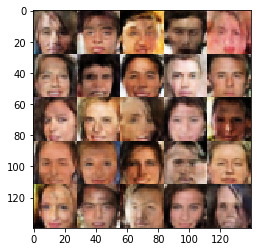

Epoch 4/7... Discriminator Loss: 0.7493 ... Generator Loss: 1.9107
Epoch 4/7... Discriminator Loss: 0.6344 ... Generator Loss: 1.8597
Epoch 4/7... Discriminator Loss: 0.4341 ... Generator Loss: 2.4396
Epoch 4/7... Discriminator Loss: 0.9290 ... Generator Loss: 0.9595
Epoch 4/7... Discriminator Loss: 1.6350 ... Generator Loss: 0.6071
Epoch 4/7... Discriminator Loss: 0.9364 ... Generator Loss: 0.9528
Epoch 4/7... Discriminator Loss: 0.9990 ... Generator Loss: 3.4929
Epoch 4/7... Discriminator Loss: 0.8505 ... Generator Loss: 2.4772
Epoch 4/7... Discriminator Loss: 0.7097 ... Generator Loss: 1.6820
Epoch 4/7... Discriminator Loss: 0.8303 ... Generator Loss: 1.0451


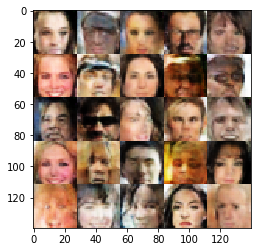

Epoch 4/7... Discriminator Loss: 0.6780 ... Generator Loss: 1.8656
Epoch 4/7... Discriminator Loss: 0.6749 ... Generator Loss: 1.9753
Epoch 4/7... Discriminator Loss: 0.6708 ... Generator Loss: 1.7526
Epoch 4/7... Discriminator Loss: 0.5445 ... Generator Loss: 3.0429
Epoch 4/7... Discriminator Loss: 0.7398 ... Generator Loss: 3.1012
Epoch 4/7... Discriminator Loss: 0.9173 ... Generator Loss: 2.7417
Epoch 4/7... Discriminator Loss: 0.7663 ... Generator Loss: 2.7534
Epoch 4/7... Discriminator Loss: 0.7981 ... Generator Loss: 1.1542
Epoch 4/7... Discriminator Loss: 1.3282 ... Generator Loss: 0.6493
Epoch 4/7... Discriminator Loss: 1.1952 ... Generator Loss: 0.7691


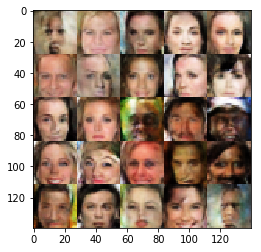

Epoch 4/7... Discriminator Loss: 0.9166 ... Generator Loss: 2.7590
Epoch 4/7... Discriminator Loss: 2.7208 ... Generator Loss: 4.0472
Epoch 4/7... Discriminator Loss: 0.9261 ... Generator Loss: 1.2397
Epoch 4/7... Discriminator Loss: 0.6435 ... Generator Loss: 1.8677
Epoch 4/7... Discriminator Loss: 1.0095 ... Generator Loss: 2.5811
Epoch 4/7... Discriminator Loss: 0.6778 ... Generator Loss: 2.6467
Epoch 4/7... Discriminator Loss: 0.8883 ... Generator Loss: 1.1286
Epoch 4/7... Discriminator Loss: 0.6069 ... Generator Loss: 2.1973
Epoch 4/7... Discriminator Loss: 0.6403 ... Generator Loss: 2.0493
Epoch 4/7... Discriminator Loss: 0.7293 ... Generator Loss: 1.1093


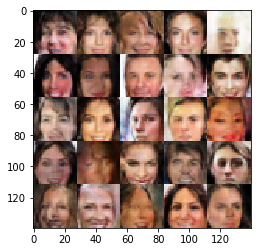

Epoch 4/7... Discriminator Loss: 1.4680 ... Generator Loss: 3.5414
Epoch 4/7... Discriminator Loss: 0.7542 ... Generator Loss: 1.4857
Epoch 4/7... Discriminator Loss: 1.0410 ... Generator Loss: 2.5276
Epoch 4/7... Discriminator Loss: 0.7204 ... Generator Loss: 1.9889
Epoch 4/7... Discriminator Loss: 0.6938 ... Generator Loss: 2.6393
Epoch 4/7... Discriminator Loss: 1.5690 ... Generator Loss: 2.6594
Epoch 4/7... Discriminator Loss: 0.7237 ... Generator Loss: 2.6432
Epoch 4/7... Discriminator Loss: 0.7612 ... Generator Loss: 1.9411
Epoch 4/7... Discriminator Loss: 0.9288 ... Generator Loss: 2.7779
Epoch 4/7... Discriminator Loss: 0.6278 ... Generator Loss: 1.3773


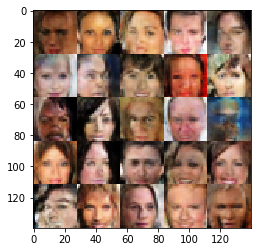

Epoch 4/7... Discriminator Loss: 0.7337 ... Generator Loss: 1.1683
Epoch 4/7... Discriminator Loss: 0.5485 ... Generator Loss: 1.8851
Epoch 4/7... Discriminator Loss: 0.7250 ... Generator Loss: 2.3717
Epoch 4/7... Discriminator Loss: 0.6438 ... Generator Loss: 3.3293
Epoch 4/7... Discriminator Loss: 0.5180 ... Generator Loss: 2.9409
Epoch 4/7... Discriminator Loss: 0.6112 ... Generator Loss: 2.0630
Epoch 5/7... Discriminator Loss: 0.7465 ... Generator Loss: 2.5099
Epoch 5/7... Discriminator Loss: 0.7958 ... Generator Loss: 2.5649
Epoch 5/7... Discriminator Loss: 1.8913 ... Generator Loss: 0.4489
Epoch 5/7... Discriminator Loss: 1.3037 ... Generator Loss: 0.7315


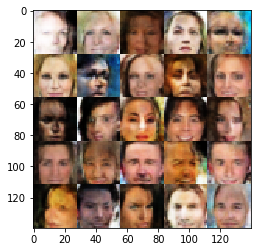

Epoch 5/7... Discriminator Loss: 1.2288 ... Generator Loss: 2.6816
Epoch 5/7... Discriminator Loss: 0.7646 ... Generator Loss: 3.3413
Epoch 5/7... Discriminator Loss: 0.7032 ... Generator Loss: 2.0207
Epoch 5/7... Discriminator Loss: 0.6120 ... Generator Loss: 2.0394
Epoch 5/7... Discriminator Loss: 0.5952 ... Generator Loss: 2.8299
Epoch 5/7... Discriminator Loss: 0.6519 ... Generator Loss: 1.9952
Epoch 5/7... Discriminator Loss: 1.6579 ... Generator Loss: 0.5314
Epoch 5/7... Discriminator Loss: 0.6314 ... Generator Loss: 1.9645
Epoch 5/7... Discriminator Loss: 1.9774 ... Generator Loss: 3.1063
Epoch 5/7... Discriminator Loss: 0.8306 ... Generator Loss: 2.0575


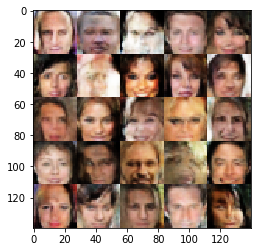

Epoch 5/7... Discriminator Loss: 0.7527 ... Generator Loss: 1.2635
Epoch 5/7... Discriminator Loss: 0.8796 ... Generator Loss: 0.8834
Epoch 5/7... Discriminator Loss: 0.7470 ... Generator Loss: 1.5157
Epoch 5/7... Discriminator Loss: 0.8431 ... Generator Loss: 1.1857
Epoch 5/7... Discriminator Loss: 0.7412 ... Generator Loss: 1.3978
Epoch 5/7... Discriminator Loss: 0.6404 ... Generator Loss: 1.8892
Epoch 5/7... Discriminator Loss: 0.5252 ... Generator Loss: 1.8737
Epoch 5/7... Discriminator Loss: 0.7096 ... Generator Loss: 2.0852
Epoch 5/7... Discriminator Loss: 0.4900 ... Generator Loss: 2.0039
Epoch 5/7... Discriminator Loss: 0.8198 ... Generator Loss: 2.2781


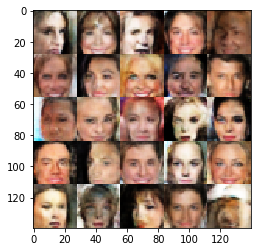

Epoch 5/7... Discriminator Loss: 0.8927 ... Generator Loss: 0.9347
Epoch 5/7... Discriminator Loss: 0.9778 ... Generator Loss: 0.8604
Epoch 5/7... Discriminator Loss: 1.2684 ... Generator Loss: 3.2474
Epoch 5/7... Discriminator Loss: 0.6166 ... Generator Loss: 2.1317
Epoch 5/7... Discriminator Loss: 0.6921 ... Generator Loss: 2.3922
Epoch 5/7... Discriminator Loss: 0.6756 ... Generator Loss: 2.1787
Epoch 5/7... Discriminator Loss: 0.6129 ... Generator Loss: 2.8004
Epoch 5/7... Discriminator Loss: 0.7343 ... Generator Loss: 1.2935
Epoch 5/7... Discriminator Loss: 0.5449 ... Generator Loss: 2.4684
Epoch 5/7... Discriminator Loss: 1.7725 ... Generator Loss: 2.8469


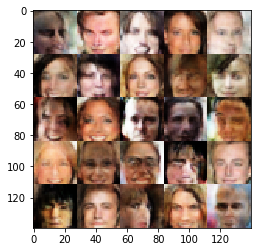

Epoch 5/7... Discriminator Loss: 0.6260 ... Generator Loss: 1.9319
Epoch 5/7... Discriminator Loss: 0.7813 ... Generator Loss: 1.4707
Epoch 5/7... Discriminator Loss: 0.7841 ... Generator Loss: 1.0845
Epoch 5/7... Discriminator Loss: 0.8993 ... Generator Loss: 2.1045
Epoch 5/7... Discriminator Loss: 0.4369 ... Generator Loss: 2.4796
Epoch 5/7... Discriminator Loss: 1.3945 ... Generator Loss: 0.6307
Epoch 5/7... Discriminator Loss: 0.8302 ... Generator Loss: 1.2683
Epoch 5/7... Discriminator Loss: 0.7791 ... Generator Loss: 2.1044
Epoch 5/7... Discriminator Loss: 0.8326 ... Generator Loss: 2.5283
Epoch 5/7... Discriminator Loss: 1.3582 ... Generator Loss: 2.3779


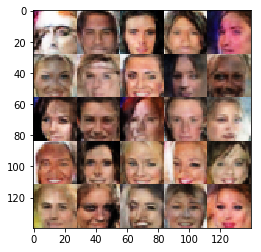

Epoch 5/7... Discriminator Loss: 0.8021 ... Generator Loss: 1.2588
Epoch 5/7... Discriminator Loss: 0.7588 ... Generator Loss: 2.1203
Epoch 5/7... Discriminator Loss: 1.1172 ... Generator Loss: 0.7330
Epoch 5/7... Discriminator Loss: 0.8782 ... Generator Loss: 1.0441
Epoch 5/7... Discriminator Loss: 1.0993 ... Generator Loss: 0.7678
Epoch 5/7... Discriminator Loss: 0.6513 ... Generator Loss: 1.8365
Epoch 5/7... Discriminator Loss: 0.6952 ... Generator Loss: 1.8065
Epoch 5/7... Discriminator Loss: 0.5919 ... Generator Loss: 2.1156
Epoch 5/7... Discriminator Loss: 0.7194 ... Generator Loss: 2.9625
Epoch 5/7... Discriminator Loss: 0.5297 ... Generator Loss: 1.9229


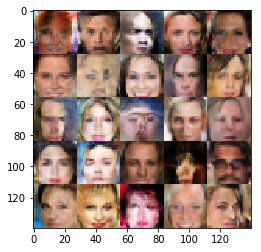

Epoch 5/7... Discriminator Loss: 0.5730 ... Generator Loss: 2.2664
Epoch 5/7... Discriminator Loss: 1.0844 ... Generator Loss: 2.1037
Epoch 5/7... Discriminator Loss: 0.5920 ... Generator Loss: 1.4785
Epoch 5/7... Discriminator Loss: 1.5250 ... Generator Loss: 0.5821
Epoch 5/7... Discriminator Loss: 0.6781 ... Generator Loss: 1.2101
Epoch 5/7... Discriminator Loss: 0.6292 ... Generator Loss: 3.1545
Epoch 5/7... Discriminator Loss: 0.6550 ... Generator Loss: 1.6011
Epoch 5/7... Discriminator Loss: 0.9306 ... Generator Loss: 1.1104
Epoch 5/7... Discriminator Loss: 0.8014 ... Generator Loss: 2.5859
Epoch 5/7... Discriminator Loss: 0.9304 ... Generator Loss: 3.1797


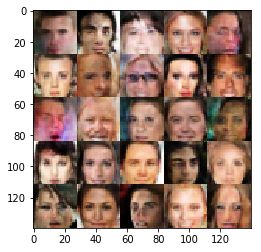

Epoch 5/7... Discriminator Loss: 0.7157 ... Generator Loss: 1.4015
Epoch 5/7... Discriminator Loss: 0.6132 ... Generator Loss: 2.0095
Epoch 5/7... Discriminator Loss: 1.0913 ... Generator Loss: 2.7444
Epoch 5/7... Discriminator Loss: 0.8229 ... Generator Loss: 1.3266
Epoch 5/7... Discriminator Loss: 0.5137 ... Generator Loss: 2.1960
Epoch 5/7... Discriminator Loss: 0.5863 ... Generator Loss: 2.4778
Epoch 5/7... Discriminator Loss: 0.7235 ... Generator Loss: 2.5807
Epoch 5/7... Discriminator Loss: 0.5105 ... Generator Loss: 2.2793
Epoch 5/7... Discriminator Loss: 0.5684 ... Generator Loss: 2.3414
Epoch 5/7... Discriminator Loss: 1.0499 ... Generator Loss: 2.7733


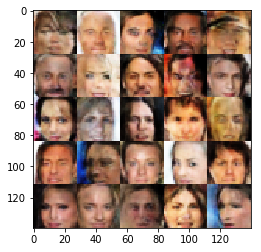

Epoch 5/7... Discriminator Loss: 0.7176 ... Generator Loss: 1.0305
Epoch 5/7... Discriminator Loss: 1.6204 ... Generator Loss: 0.5510
Epoch 5/7... Discriminator Loss: 0.6988 ... Generator Loss: 1.9489
Epoch 5/7... Discriminator Loss: 0.8438 ... Generator Loss: 1.9977
Epoch 5/7... Discriminator Loss: 0.5770 ... Generator Loss: 1.8320
Epoch 5/7... Discriminator Loss: 0.7698 ... Generator Loss: 1.4477
Epoch 5/7... Discriminator Loss: 0.4833 ... Generator Loss: 2.8111
Epoch 5/7... Discriminator Loss: 0.8336 ... Generator Loss: 2.7243
Epoch 5/7... Discriminator Loss: 0.4999 ... Generator Loss: 2.6145
Epoch 5/7... Discriminator Loss: 0.4738 ... Generator Loss: 2.0059


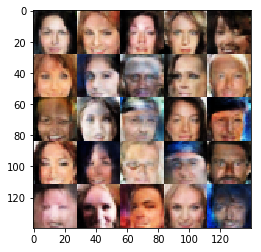

Epoch 5/7... Discriminator Loss: 0.6635 ... Generator Loss: 2.6052
Epoch 5/7... Discriminator Loss: 0.4986 ... Generator Loss: 2.5676
Epoch 5/7... Discriminator Loss: 0.6812 ... Generator Loss: 2.0084
Epoch 5/7... Discriminator Loss: 0.6684 ... Generator Loss: 1.2744
Epoch 5/7... Discriminator Loss: 0.7492 ... Generator Loss: 1.7148
Epoch 5/7... Discriminator Loss: 0.5814 ... Generator Loss: 2.4843
Epoch 5/7... Discriminator Loss: 0.9958 ... Generator Loss: 2.7881
Epoch 5/7... Discriminator Loss: 1.9914 ... Generator Loss: 3.2469
Epoch 5/7... Discriminator Loss: 0.7453 ... Generator Loss: 1.6631
Epoch 5/7... Discriminator Loss: 0.6673 ... Generator Loss: 2.5725


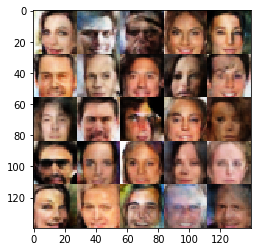

Epoch 5/7... Discriminator Loss: 0.8446 ... Generator Loss: 1.0821
Epoch 5/7... Discriminator Loss: 1.5188 ... Generator Loss: 3.2209
Epoch 5/7... Discriminator Loss: 0.7432 ... Generator Loss: 1.2417
Epoch 5/7... Discriminator Loss: 0.9010 ... Generator Loss: 1.0427
Epoch 5/7... Discriminator Loss: 1.0434 ... Generator Loss: 0.9323
Epoch 5/7... Discriminator Loss: 0.6512 ... Generator Loss: 1.3151
Epoch 5/7... Discriminator Loss: 0.6612 ... Generator Loss: 1.8175
Epoch 5/7... Discriminator Loss: 0.5905 ... Generator Loss: 1.8409
Epoch 5/7... Discriminator Loss: 1.1490 ... Generator Loss: 0.7310
Epoch 5/7... Discriminator Loss: 0.7231 ... Generator Loss: 2.2470


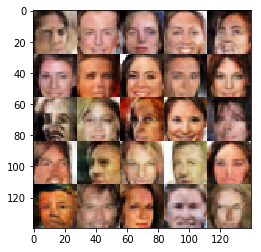

Epoch 5/7... Discriminator Loss: 0.8040 ... Generator Loss: 1.2094
Epoch 5/7... Discriminator Loss: 0.6682 ... Generator Loss: 1.8862
Epoch 5/7... Discriminator Loss: 0.7700 ... Generator Loss: 1.3403
Epoch 5/7... Discriminator Loss: 2.1596 ... Generator Loss: 0.3269
Epoch 5/7... Discriminator Loss: 0.7557 ... Generator Loss: 1.4545
Epoch 5/7... Discriminator Loss: 0.7996 ... Generator Loss: 2.6679
Epoch 5/7... Discriminator Loss: 2.3738 ... Generator Loss: 3.4966
Epoch 5/7... Discriminator Loss: 0.7601 ... Generator Loss: 2.1084
Epoch 5/7... Discriminator Loss: 0.7772 ... Generator Loss: 1.2349
Epoch 5/7... Discriminator Loss: 0.5962 ... Generator Loss: 1.7439


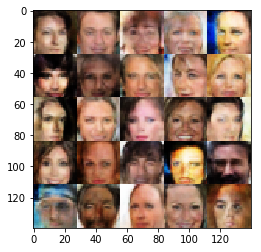

Epoch 5/7... Discriminator Loss: 1.0551 ... Generator Loss: 0.9353
Epoch 5/7... Discriminator Loss: 0.6168 ... Generator Loss: 2.3162
Epoch 5/7... Discriminator Loss: 0.7678 ... Generator Loss: 1.2692
Epoch 5/7... Discriminator Loss: 0.7211 ... Generator Loss: 1.3261
Epoch 5/7... Discriminator Loss: 0.8092 ... Generator Loss: 2.8143
Epoch 5/7... Discriminator Loss: 0.7702 ... Generator Loss: 1.9714
Epoch 5/7... Discriminator Loss: 1.1432 ... Generator Loss: 0.7348
Epoch 5/7... Discriminator Loss: 0.8198 ... Generator Loss: 1.3573
Epoch 5/7... Discriminator Loss: 1.5824 ... Generator Loss: 0.5802
Epoch 5/7... Discriminator Loss: 0.7652 ... Generator Loss: 1.9694


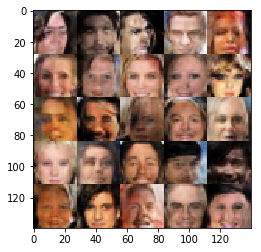

Epoch 5/7... Discriminator Loss: 0.7829 ... Generator Loss: 1.7685
Epoch 5/7... Discriminator Loss: 1.0951 ... Generator Loss: 2.6121
Epoch 5/7... Discriminator Loss: 0.6760 ... Generator Loss: 2.7440
Epoch 5/7... Discriminator Loss: 0.7457 ... Generator Loss: 2.2945
Epoch 5/7... Discriminator Loss: 0.5608 ... Generator Loss: 2.2505
Epoch 5/7... Discriminator Loss: 1.0587 ... Generator Loss: 3.5923
Epoch 5/7... Discriminator Loss: 0.7764 ... Generator Loss: 1.4021
Epoch 5/7... Discriminator Loss: 0.8650 ... Generator Loss: 1.1553
Epoch 5/7... Discriminator Loss: 0.6517 ... Generator Loss: 2.4367
Epoch 5/7... Discriminator Loss: 1.4325 ... Generator Loss: 0.6718


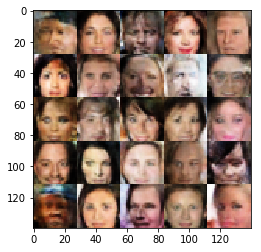

Epoch 5/7... Discriminator Loss: 0.7422 ... Generator Loss: 1.6555
Epoch 5/7... Discriminator Loss: 0.8790 ... Generator Loss: 1.0000
Epoch 5/7... Discriminator Loss: 0.8281 ... Generator Loss: 1.0726
Epoch 5/7... Discriminator Loss: 0.7337 ... Generator Loss: 1.3458
Epoch 5/7... Discriminator Loss: 0.9339 ... Generator Loss: 1.0835
Epoch 5/7... Discriminator Loss: 0.7638 ... Generator Loss: 1.4131
Epoch 5/7... Discriminator Loss: 0.5052 ... Generator Loss: 2.8891
Epoch 5/7... Discriminator Loss: 0.6030 ... Generator Loss: 2.6064
Epoch 5/7... Discriminator Loss: 0.7412 ... Generator Loss: 3.1008
Epoch 5/7... Discriminator Loss: 0.6091 ... Generator Loss: 1.8277


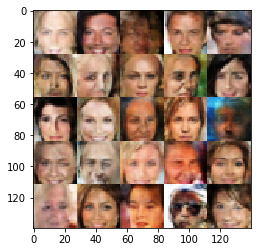

Epoch 5/7... Discriminator Loss: 0.6705 ... Generator Loss: 1.5846
Epoch 5/7... Discriminator Loss: 1.2961 ... Generator Loss: 0.5702
Epoch 5/7... Discriminator Loss: 0.7169 ... Generator Loss: 1.4912
Epoch 5/7... Discriminator Loss: 0.8597 ... Generator Loss: 2.9643
Epoch 5/7... Discriminator Loss: 0.8537 ... Generator Loss: 1.3998
Epoch 5/7... Discriminator Loss: 0.7261 ... Generator Loss: 2.4425
Epoch 5/7... Discriminator Loss: 0.8340 ... Generator Loss: 2.1715
Epoch 5/7... Discriminator Loss: 0.5997 ... Generator Loss: 1.9696
Epoch 5/7... Discriminator Loss: 0.6395 ... Generator Loss: 2.6961
Epoch 5/7... Discriminator Loss: 0.6618 ... Generator Loss: 2.0415


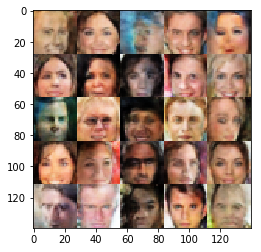

Epoch 5/7... Discriminator Loss: 0.6222 ... Generator Loss: 1.8281
Epoch 5/7... Discriminator Loss: 0.7125 ... Generator Loss: 1.8190
Epoch 5/7... Discriminator Loss: 0.6427 ... Generator Loss: 1.4654
Epoch 5/7... Discriminator Loss: 0.5004 ... Generator Loss: 3.1377
Epoch 5/7... Discriminator Loss: 1.9717 ... Generator Loss: 3.0206
Epoch 5/7... Discriminator Loss: 0.6143 ... Generator Loss: 1.7115
Epoch 5/7... Discriminator Loss: 0.7725 ... Generator Loss: 2.9533
Epoch 5/7... Discriminator Loss: 0.7748 ... Generator Loss: 2.1370
Epoch 5/7... Discriminator Loss: 0.9523 ... Generator Loss: 2.8665
Epoch 5/7... Discriminator Loss: 0.5752 ... Generator Loss: 1.5948


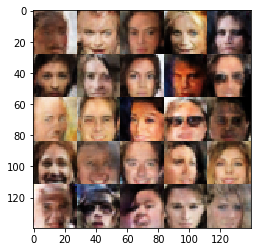

Epoch 5/7... Discriminator Loss: 0.8425 ... Generator Loss: 1.0484
Epoch 5/7... Discriminator Loss: 0.7915 ... Generator Loss: 2.7699
Epoch 5/7... Discriminator Loss: 1.1876 ... Generator Loss: 0.7591
Epoch 5/7... Discriminator Loss: 1.0848 ... Generator Loss: 0.7988
Epoch 5/7... Discriminator Loss: 0.7846 ... Generator Loss: 2.4138
Epoch 5/7... Discriminator Loss: 0.7522 ... Generator Loss: 1.6926
Epoch 5/7... Discriminator Loss: 0.9277 ... Generator Loss: 3.8182
Epoch 5/7... Discriminator Loss: 1.0141 ... Generator Loss: 0.8087
Epoch 5/7... Discriminator Loss: 0.7128 ... Generator Loss: 1.9761
Epoch 5/7... Discriminator Loss: 0.5570 ... Generator Loss: 3.0018


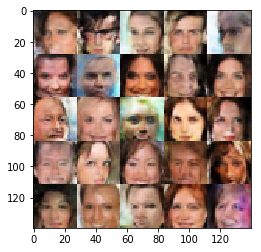

Epoch 5/7... Discriminator Loss: 1.3357 ... Generator Loss: 3.0284
Epoch 5/7... Discriminator Loss: 0.5489 ... Generator Loss: 2.2303
Epoch 5/7... Discriminator Loss: 1.2043 ... Generator Loss: 2.2577
Epoch 5/7... Discriminator Loss: 1.2490 ... Generator Loss: 0.7508
Epoch 5/7... Discriminator Loss: 0.8944 ... Generator Loss: 2.3823
Epoch 5/7... Discriminator Loss: 1.0971 ... Generator Loss: 0.8515
Epoch 5/7... Discriminator Loss: 0.6235 ... Generator Loss: 1.9958
Epoch 5/7... Discriminator Loss: 1.1400 ... Generator Loss: 3.0462
Epoch 5/7... Discriminator Loss: 0.7674 ... Generator Loss: 2.1760
Epoch 5/7... Discriminator Loss: 0.5986 ... Generator Loss: 2.1098


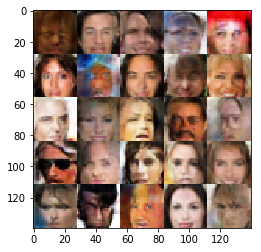

Epoch 5/7... Discriminator Loss: 0.5596 ... Generator Loss: 2.0980
Epoch 5/7... Discriminator Loss: 0.4614 ... Generator Loss: 2.1205
Epoch 5/7... Discriminator Loss: 0.5057 ... Generator Loss: 3.6839
Epoch 5/7... Discriminator Loss: 0.5035 ... Generator Loss: 2.7506
Epoch 5/7... Discriminator Loss: 0.6465 ... Generator Loss: 2.7965
Epoch 5/7... Discriminator Loss: 1.4611 ... Generator Loss: 0.5222
Epoch 5/7... Discriminator Loss: 1.0514 ... Generator Loss: 2.6572
Epoch 5/7... Discriminator Loss: 0.9411 ... Generator Loss: 1.2700
Epoch 5/7... Discriminator Loss: 0.6421 ... Generator Loss: 2.2839
Epoch 5/7... Discriminator Loss: 0.8403 ... Generator Loss: 1.3224


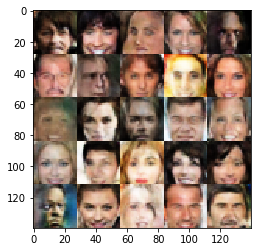

Epoch 5/7... Discriminator Loss: 0.5693 ... Generator Loss: 2.2400
Epoch 5/7... Discriminator Loss: 0.6541 ... Generator Loss: 2.0172
Epoch 5/7... Discriminator Loss: 0.7520 ... Generator Loss: 4.4447
Epoch 5/7... Discriminator Loss: 0.8518 ... Generator Loss: 0.8787
Epoch 5/7... Discriminator Loss: 0.6152 ... Generator Loss: 2.0530
Epoch 5/7... Discriminator Loss: 1.8386 ... Generator Loss: 0.4452
Epoch 5/7... Discriminator Loss: 1.1254 ... Generator Loss: 3.1185
Epoch 5/7... Discriminator Loss: 0.8063 ... Generator Loss: 2.7618
Epoch 5/7... Discriminator Loss: 1.0784 ... Generator Loss: 0.9430
Epoch 5/7... Discriminator Loss: 0.7120 ... Generator Loss: 1.9708


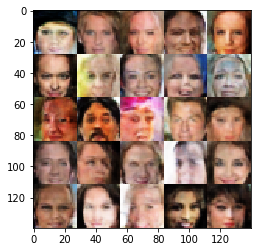

Epoch 5/7... Discriminator Loss: 1.3305 ... Generator Loss: 0.5984
Epoch 5/7... Discriminator Loss: 0.8809 ... Generator Loss: 1.3019
Epoch 5/7... Discriminator Loss: 0.7703 ... Generator Loss: 2.2909
Epoch 5/7... Discriminator Loss: 0.6163 ... Generator Loss: 3.1606
Epoch 5/7... Discriminator Loss: 0.7342 ... Generator Loss: 2.4015
Epoch 5/7... Discriminator Loss: 0.7618 ... Generator Loss: 1.6805
Epoch 5/7... Discriminator Loss: 0.7302 ... Generator Loss: 1.1496
Epoch 5/7... Discriminator Loss: 0.9633 ... Generator Loss: 0.8533
Epoch 5/7... Discriminator Loss: 0.5818 ... Generator Loss: 2.7087
Epoch 5/7... Discriminator Loss: 0.7830 ... Generator Loss: 1.4172


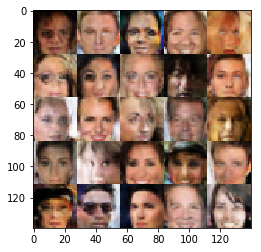

Epoch 5/7... Discriminator Loss: 0.6869 ... Generator Loss: 1.3222
Epoch 5/7... Discriminator Loss: 1.3383 ... Generator Loss: 0.6110
Epoch 5/7... Discriminator Loss: 0.7189 ... Generator Loss: 1.7413
Epoch 5/7... Discriminator Loss: 0.6845 ... Generator Loss: 1.5247
Epoch 5/7... Discriminator Loss: 0.5615 ... Generator Loss: 2.4690
Epoch 5/7... Discriminator Loss: 0.6088 ... Generator Loss: 2.2879
Epoch 5/7... Discriminator Loss: 0.4615 ... Generator Loss: 2.7885
Epoch 5/7... Discriminator Loss: 0.5405 ... Generator Loss: 3.6199
Epoch 5/7... Discriminator Loss: 0.9713 ... Generator Loss: 1.5094
Epoch 5/7... Discriminator Loss: 0.7527 ... Generator Loss: 1.2200


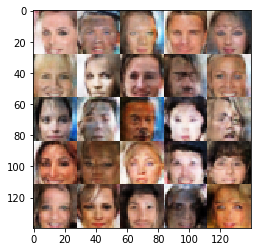

Epoch 5/7... Discriminator Loss: 0.7367 ... Generator Loss: 1.7376
Epoch 5/7... Discriminator Loss: 1.8017 ... Generator Loss: 0.4342
Epoch 5/7... Discriminator Loss: 0.6927 ... Generator Loss: 1.8468
Epoch 5/7... Discriminator Loss: 0.8624 ... Generator Loss: 1.1684
Epoch 5/7... Discriminator Loss: 0.8701 ... Generator Loss: 1.3099
Epoch 5/7... Discriminator Loss: 1.0926 ... Generator Loss: 0.8534
Epoch 5/7... Discriminator Loss: 0.9478 ... Generator Loss: 1.2008
Epoch 5/7... Discriminator Loss: 0.6130 ... Generator Loss: 1.9320
Epoch 5/7... Discriminator Loss: 0.5883 ... Generator Loss: 2.1095
Epoch 5/7... Discriminator Loss: 0.5687 ... Generator Loss: 2.5336


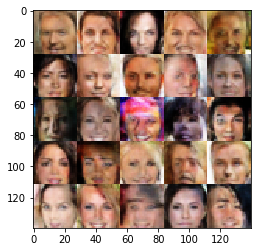

Epoch 5/7... Discriminator Loss: 0.5925 ... Generator Loss: 1.6924
Epoch 5/7... Discriminator Loss: 0.4943 ... Generator Loss: 2.5144
Epoch 5/7... Discriminator Loss: 0.8236 ... Generator Loss: 1.1771
Epoch 5/7... Discriminator Loss: 0.6920 ... Generator Loss: 3.3435
Epoch 5/7... Discriminator Loss: 0.7664 ... Generator Loss: 1.6357
Epoch 5/7... Discriminator Loss: 0.9859 ... Generator Loss: 1.0726
Epoch 5/7... Discriminator Loss: 1.1741 ... Generator Loss: 3.8305
Epoch 5/7... Discriminator Loss: 0.6248 ... Generator Loss: 2.2806
Epoch 5/7... Discriminator Loss: 0.7887 ... Generator Loss: 2.0120
Epoch 5/7... Discriminator Loss: 0.5794 ... Generator Loss: 2.5993


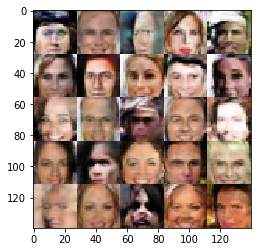

Epoch 5/7... Discriminator Loss: 0.8356 ... Generator Loss: 3.7162
Epoch 5/7... Discriminator Loss: 0.8500 ... Generator Loss: 2.7584
Epoch 5/7... Discriminator Loss: 0.7114 ... Generator Loss: 1.5423
Epoch 5/7... Discriminator Loss: 0.6329 ... Generator Loss: 1.9732
Epoch 5/7... Discriminator Loss: 0.6985 ... Generator Loss: 1.7580
Epoch 5/7... Discriminator Loss: 0.5504 ... Generator Loss: 2.1739
Epoch 5/7... Discriminator Loss: 2.0998 ... Generator Loss: 0.2950
Epoch 5/7... Discriminator Loss: 0.8415 ... Generator Loss: 1.4432
Epoch 5/7... Discriminator Loss: 2.0555 ... Generator Loss: 0.3687
Epoch 5/7... Discriminator Loss: 0.7705 ... Generator Loss: 1.8061


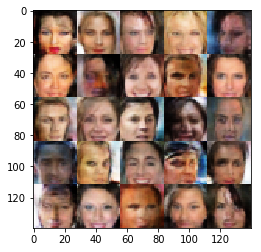

Epoch 5/7... Discriminator Loss: 1.3159 ... Generator Loss: 0.6217
Epoch 5/7... Discriminator Loss: 0.5971 ... Generator Loss: 1.9763
Epoch 5/7... Discriminator Loss: 0.7341 ... Generator Loss: 1.5344
Epoch 5/7... Discriminator Loss: 0.7435 ... Generator Loss: 2.7958
Epoch 5/7... Discriminator Loss: 0.8645 ... Generator Loss: 1.0765
Epoch 5/7... Discriminator Loss: 1.0078 ... Generator Loss: 1.1170
Epoch 5/7... Discriminator Loss: 0.4787 ... Generator Loss: 2.5348
Epoch 5/7... Discriminator Loss: 0.5927 ... Generator Loss: 2.5015
Epoch 5/7... Discriminator Loss: 0.5980 ... Generator Loss: 2.9191
Epoch 5/7... Discriminator Loss: 2.4239 ... Generator Loss: 0.3442


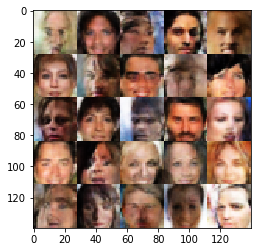

Epoch 5/7... Discriminator Loss: 0.8665 ... Generator Loss: 0.8907
Epoch 5/7... Discriminator Loss: 0.7139 ... Generator Loss: 1.5709
Epoch 5/7... Discriminator Loss: 0.7363 ... Generator Loss: 2.1297
Epoch 5/7... Discriminator Loss: 0.5196 ... Generator Loss: 2.2343
Epoch 5/7... Discriminator Loss: 0.6048 ... Generator Loss: 2.1156
Epoch 5/7... Discriminator Loss: 0.5527 ... Generator Loss: 3.0698
Epoch 5/7... Discriminator Loss: 0.4865 ... Generator Loss: 2.2517
Epoch 5/7... Discriminator Loss: 2.6853 ... Generator Loss: 3.6962
Epoch 5/7... Discriminator Loss: 1.4112 ... Generator Loss: 3.3280
Epoch 5/7... Discriminator Loss: 0.8535 ... Generator Loss: 1.0856


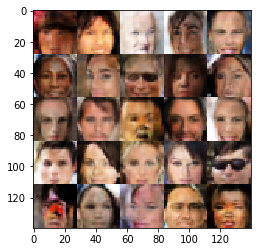

Epoch 5/7... Discriminator Loss: 1.0888 ... Generator Loss: 0.7480
Epoch 5/7... Discriminator Loss: 0.7667 ... Generator Loss: 1.6843
Epoch 5/7... Discriminator Loss: 1.4497 ... Generator Loss: 3.1893
Epoch 5/7... Discriminator Loss: 0.7293 ... Generator Loss: 2.0447
Epoch 5/7... Discriminator Loss: 0.7152 ... Generator Loss: 2.1970
Epoch 5/7... Discriminator Loss: 0.4381 ... Generator Loss: 2.4428
Epoch 5/7... Discriminator Loss: 0.5684 ... Generator Loss: 2.1787
Epoch 5/7... Discriminator Loss: 1.5293 ... Generator Loss: 0.6110
Epoch 5/7... Discriminator Loss: 0.9730 ... Generator Loss: 0.7921
Epoch 5/7... Discriminator Loss: 0.6826 ... Generator Loss: 2.7152


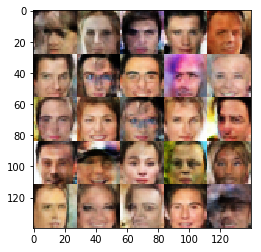

Epoch 5/7... Discriminator Loss: 0.8056 ... Generator Loss: 3.1208
Epoch 5/7... Discriminator Loss: 0.8978 ... Generator Loss: 1.6351
Epoch 5/7... Discriminator Loss: 1.4994 ... Generator Loss: 0.5276
Epoch 5/7... Discriminator Loss: 0.8405 ... Generator Loss: 1.2632
Epoch 5/7... Discriminator Loss: 0.6685 ... Generator Loss: 1.9998
Epoch 5/7... Discriminator Loss: 0.6601 ... Generator Loss: 2.5841
Epoch 5/7... Discriminator Loss: 0.7569 ... Generator Loss: 1.4834
Epoch 5/7... Discriminator Loss: 0.7279 ... Generator Loss: 1.8873
Epoch 5/7... Discriminator Loss: 0.5872 ... Generator Loss: 2.5137
Epoch 5/7... Discriminator Loss: 0.7338 ... Generator Loss: 2.4256


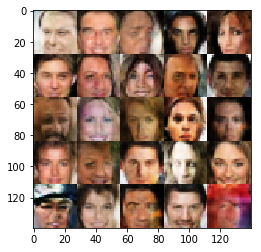

Epoch 5/7... Discriminator Loss: 0.8735 ... Generator Loss: 3.1349
Epoch 5/7... Discriminator Loss: 0.5132 ... Generator Loss: 3.1804
Epoch 5/7... Discriminator Loss: 0.6126 ... Generator Loss: 2.5503
Epoch 5/7... Discriminator Loss: 1.3943 ... Generator Loss: 2.9462
Epoch 5/7... Discriminator Loss: 1.4808 ... Generator Loss: 0.6019
Epoch 5/7... Discriminator Loss: 0.6684 ... Generator Loss: 2.9864
Epoch 5/7... Discriminator Loss: 1.1187 ... Generator Loss: 0.8288
Epoch 5/7... Discriminator Loss: 0.6129 ... Generator Loss: 2.8338
Epoch 5/7... Discriminator Loss: 1.1482 ... Generator Loss: 0.7492
Epoch 5/7... Discriminator Loss: 0.7133 ... Generator Loss: 1.7498


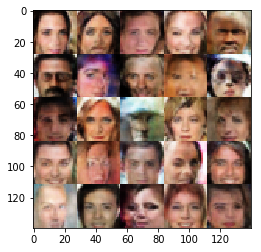

Epoch 5/7... Discriminator Loss: 0.7376 ... Generator Loss: 2.1096
Epoch 5/7... Discriminator Loss: 0.5925 ... Generator Loss: 1.5182
Epoch 5/7... Discriminator Loss: 0.5047 ... Generator Loss: 3.0780
Epoch 5/7... Discriminator Loss: 0.5343 ... Generator Loss: 2.2634
Epoch 5/7... Discriminator Loss: 0.5214 ... Generator Loss: 2.6158
Epoch 5/7... Discriminator Loss: 1.1778 ... Generator Loss: 0.7308
Epoch 5/7... Discriminator Loss: 1.3212 ... Generator Loss: 0.7066
Epoch 5/7... Discriminator Loss: 0.7288 ... Generator Loss: 1.2121
Epoch 5/7... Discriminator Loss: 1.1359 ... Generator Loss: 0.7866
Epoch 5/7... Discriminator Loss: 0.8163 ... Generator Loss: 1.1723


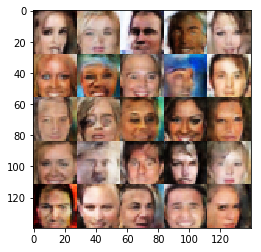

Epoch 5/7... Discriminator Loss: 1.1089 ... Generator Loss: 0.8359
Epoch 5/7... Discriminator Loss: 0.5967 ... Generator Loss: 2.0659
Epoch 6/7... Discriminator Loss: 0.8398 ... Generator Loss: 2.3430
Epoch 6/7... Discriminator Loss: 0.6052 ... Generator Loss: 1.9643
Epoch 6/7... Discriminator Loss: 0.6461 ... Generator Loss: 2.3076
Epoch 6/7... Discriminator Loss: 0.7056 ... Generator Loss: 1.5248
Epoch 6/7... Discriminator Loss: 1.0452 ... Generator Loss: 0.9121
Epoch 6/7... Discriminator Loss: 0.7490 ... Generator Loss: 1.4367
Epoch 6/7... Discriminator Loss: 0.5723 ... Generator Loss: 2.1537
Epoch 6/7... Discriminator Loss: 0.5958 ... Generator Loss: 2.7660


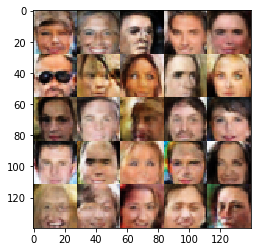

Epoch 6/7... Discriminator Loss: 1.4513 ... Generator Loss: 2.9167
Epoch 6/7... Discriminator Loss: 0.6026 ... Generator Loss: 2.2531
Epoch 6/7... Discriminator Loss: 0.8196 ... Generator Loss: 1.4366
Epoch 6/7... Discriminator Loss: 1.3402 ... Generator Loss: 0.6569
Epoch 6/7... Discriminator Loss: 0.8659 ... Generator Loss: 1.7626
Epoch 6/7... Discriminator Loss: 0.9456 ... Generator Loss: 1.8595
Epoch 6/7... Discriminator Loss: 0.7428 ... Generator Loss: 2.1381
Epoch 6/7... Discriminator Loss: 0.8506 ... Generator Loss: 0.8433
Epoch 6/7... Discriminator Loss: 0.7125 ... Generator Loss: 1.6737
Epoch 6/7... Discriminator Loss: 0.8908 ... Generator Loss: 3.1072


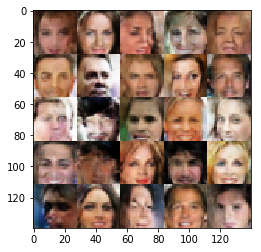

Epoch 6/7... Discriminator Loss: 1.2881 ... Generator Loss: 3.7688
Epoch 6/7... Discriminator Loss: 0.7220 ... Generator Loss: 1.4347
Epoch 6/7... Discriminator Loss: 0.6875 ... Generator Loss: 2.0543
Epoch 6/7... Discriminator Loss: 1.0780 ... Generator Loss: 2.5084
Epoch 6/7... Discriminator Loss: 0.7181 ... Generator Loss: 2.2010
Epoch 6/7... Discriminator Loss: 1.3722 ... Generator Loss: 0.6063
Epoch 6/7... Discriminator Loss: 0.8868 ... Generator Loss: 1.1111
Epoch 6/7... Discriminator Loss: 0.8601 ... Generator Loss: 1.4930
Epoch 6/7... Discriminator Loss: 0.9169 ... Generator Loss: 0.9160
Epoch 6/7... Discriminator Loss: 0.5591 ... Generator Loss: 2.7697


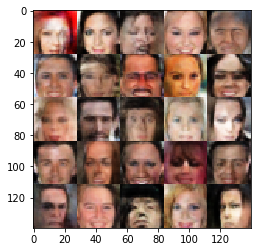

Epoch 6/7... Discriminator Loss: 0.6362 ... Generator Loss: 2.4260
Epoch 6/7... Discriminator Loss: 0.7201 ... Generator Loss: 1.8285
Epoch 6/7... Discriminator Loss: 0.4218 ... Generator Loss: 2.4496
Epoch 6/7... Discriminator Loss: 1.1224 ... Generator Loss: 3.0871
Epoch 6/7... Discriminator Loss: 1.0562 ... Generator Loss: 0.8066
Epoch 6/7... Discriminator Loss: 0.7877 ... Generator Loss: 1.1742
Epoch 6/7... Discriminator Loss: 0.8155 ... Generator Loss: 1.1279
Epoch 6/7... Discriminator Loss: 1.3604 ... Generator Loss: 0.7445
Epoch 6/7... Discriminator Loss: 0.8090 ... Generator Loss: 2.3630
Epoch 6/7... Discriminator Loss: 0.5774 ... Generator Loss: 2.3701


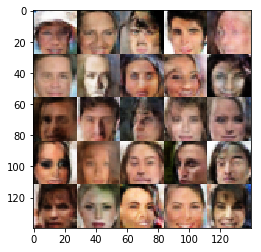

Epoch 6/7... Discriminator Loss: 0.6100 ... Generator Loss: 2.0766
Epoch 6/7... Discriminator Loss: 0.6450 ... Generator Loss: 1.7955
Epoch 6/7... Discriminator Loss: 0.6443 ... Generator Loss: 1.8182
Epoch 6/7... Discriminator Loss: 0.6027 ... Generator Loss: 1.5831
Epoch 6/7... Discriminator Loss: 0.8671 ... Generator Loss: 2.9708
Epoch 6/7... Discriminator Loss: 0.7982 ... Generator Loss: 2.1771
Epoch 6/7... Discriminator Loss: 0.7152 ... Generator Loss: 2.6863
Epoch 6/7... Discriminator Loss: 0.8172 ... Generator Loss: 1.3338
Epoch 6/7... Discriminator Loss: 1.5911 ... Generator Loss: 3.6651
Epoch 6/7... Discriminator Loss: 0.6658 ... Generator Loss: 2.3140


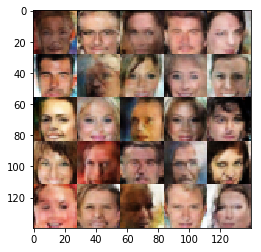

Epoch 6/7... Discriminator Loss: 0.5653 ... Generator Loss: 2.1750
Epoch 6/7... Discriminator Loss: 0.7370 ... Generator Loss: 1.2464
Epoch 6/7... Discriminator Loss: 0.7068 ... Generator Loss: 1.5651
Epoch 6/7... Discriminator Loss: 1.1682 ... Generator Loss: 0.7083
Epoch 6/7... Discriminator Loss: 0.8675 ... Generator Loss: 1.1404
Epoch 6/7... Discriminator Loss: 0.7534 ... Generator Loss: 1.7876
Epoch 6/7... Discriminator Loss: 1.5840 ... Generator Loss: 2.8911
Epoch 6/7... Discriminator Loss: 0.7349 ... Generator Loss: 1.4867
Epoch 6/7... Discriminator Loss: 0.5292 ... Generator Loss: 3.0011
Epoch 6/7... Discriminator Loss: 0.7343 ... Generator Loss: 1.4281


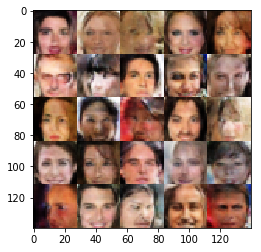

Epoch 6/7... Discriminator Loss: 0.5728 ... Generator Loss: 2.6797
Epoch 6/7... Discriminator Loss: 0.6667 ... Generator Loss: 2.0396
Epoch 6/7... Discriminator Loss: 0.8122 ... Generator Loss: 3.1410
Epoch 6/7... Discriminator Loss: 0.7895 ... Generator Loss: 1.7451
Epoch 6/7... Discriminator Loss: 0.8846 ... Generator Loss: 1.1588
Epoch 6/7... Discriminator Loss: 0.5676 ... Generator Loss: 2.2736
Epoch 6/7... Discriminator Loss: 0.5279 ... Generator Loss: 1.6386
Epoch 6/7... Discriminator Loss: 2.1558 ... Generator Loss: 0.3189
Epoch 6/7... Discriminator Loss: 0.6792 ... Generator Loss: 1.6201
Epoch 6/7... Discriminator Loss: 2.8896 ... Generator Loss: 3.4889


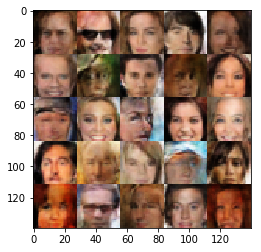

Epoch 6/7... Discriminator Loss: 0.7441 ... Generator Loss: 1.2807
Epoch 6/7... Discriminator Loss: 0.7565 ... Generator Loss: 1.3111
Epoch 6/7... Discriminator Loss: 0.5683 ... Generator Loss: 2.9863
Epoch 6/7... Discriminator Loss: 0.6349 ... Generator Loss: 1.8051
Epoch 6/7... Discriminator Loss: 0.8065 ... Generator Loss: 2.4855
Epoch 6/7... Discriminator Loss: 0.8075 ... Generator Loss: 2.7351
Epoch 6/7... Discriminator Loss: 0.5607 ... Generator Loss: 2.5451
Epoch 6/7... Discriminator Loss: 0.7450 ... Generator Loss: 1.7076
Epoch 6/7... Discriminator Loss: 0.7557 ... Generator Loss: 1.6124
Epoch 6/7... Discriminator Loss: 0.7878 ... Generator Loss: 1.5443


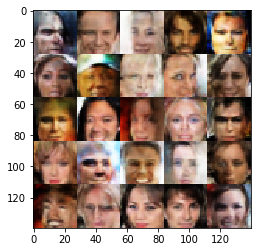

Epoch 6/7... Discriminator Loss: 0.5073 ... Generator Loss: 2.5846
Epoch 6/7... Discriminator Loss: 0.6996 ... Generator Loss: 1.7343
Epoch 6/7... Discriminator Loss: 0.5833 ... Generator Loss: 2.7523
Epoch 6/7... Discriminator Loss: 0.9695 ... Generator Loss: 3.5394
Epoch 6/7... Discriminator Loss: 0.4982 ... Generator Loss: 2.2377
Epoch 6/7... Discriminator Loss: 0.5474 ... Generator Loss: 1.9474
Epoch 6/7... Discriminator Loss: 0.7091 ... Generator Loss: 2.1780
Epoch 6/7... Discriminator Loss: 0.7120 ... Generator Loss: 2.0545
Epoch 6/7... Discriminator Loss: 1.1213 ... Generator Loss: 0.6854
Epoch 6/7... Discriminator Loss: 1.0762 ... Generator Loss: 0.8834


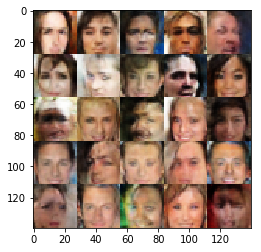

Epoch 6/7... Discriminator Loss: 0.6623 ... Generator Loss: 1.6508
Epoch 6/7... Discriminator Loss: 0.8310 ... Generator Loss: 1.4764
Epoch 6/7... Discriminator Loss: 0.6581 ... Generator Loss: 2.1650
Epoch 6/7... Discriminator Loss: 0.6905 ... Generator Loss: 1.3718
Epoch 6/7... Discriminator Loss: 0.6064 ... Generator Loss: 1.9181
Epoch 6/7... Discriminator Loss: 0.5079 ... Generator Loss: 2.1849
Epoch 6/7... Discriminator Loss: 1.1478 ... Generator Loss: 2.9829
Epoch 6/7... Discriminator Loss: 0.9924 ... Generator Loss: 0.8959
Epoch 6/7... Discriminator Loss: 0.7470 ... Generator Loss: 1.1954
Epoch 6/7... Discriminator Loss: 0.8169 ... Generator Loss: 2.3386


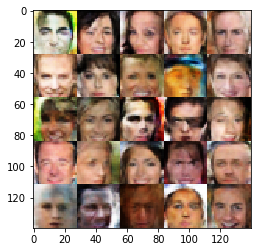

Epoch 6/7... Discriminator Loss: 0.7298 ... Generator Loss: 1.6091
Epoch 6/7... Discriminator Loss: 0.8062 ... Generator Loss: 1.6326
Epoch 6/7... Discriminator Loss: 0.9468 ... Generator Loss: 0.9845
Epoch 6/7... Discriminator Loss: 0.6430 ... Generator Loss: 1.9373
Epoch 6/7... Discriminator Loss: 0.6022 ... Generator Loss: 1.8053
Epoch 6/7... Discriminator Loss: 1.0917 ... Generator Loss: 0.8189
Epoch 6/7... Discriminator Loss: 0.5064 ... Generator Loss: 2.8473
Epoch 6/7... Discriminator Loss: 0.9479 ... Generator Loss: 1.7425
Epoch 6/7... Discriminator Loss: 0.7778 ... Generator Loss: 1.6328
Epoch 6/7... Discriminator Loss: 1.0018 ... Generator Loss: 0.8289


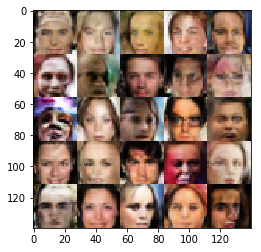

Epoch 6/7... Discriminator Loss: 0.7915 ... Generator Loss: 1.5394
Epoch 6/7... Discriminator Loss: 0.7754 ... Generator Loss: 1.7742
Epoch 6/7... Discriminator Loss: 0.6523 ... Generator Loss: 1.7920
Epoch 6/7... Discriminator Loss: 1.0302 ... Generator Loss: 2.6852
Epoch 6/7... Discriminator Loss: 0.6729 ... Generator Loss: 2.2229
Epoch 6/7... Discriminator Loss: 0.7718 ... Generator Loss: 1.8190
Epoch 6/7... Discriminator Loss: 1.1205 ... Generator Loss: 0.8434
Epoch 6/7... Discriminator Loss: 0.6165 ... Generator Loss: 2.0982
Epoch 6/7... Discriminator Loss: 0.6542 ... Generator Loss: 2.6690
Epoch 6/7... Discriminator Loss: 0.4729 ... Generator Loss: 3.2757


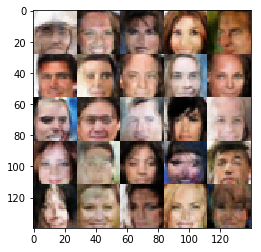

Epoch 6/7... Discriminator Loss: 0.7766 ... Generator Loss: 3.5737
Epoch 6/7... Discriminator Loss: 0.5587 ... Generator Loss: 2.8875
Epoch 6/7... Discriminator Loss: 1.4214 ... Generator Loss: 2.4813
Epoch 6/7... Discriminator Loss: 0.7175 ... Generator Loss: 2.7135
Epoch 6/7... Discriminator Loss: 0.8558 ... Generator Loss: 2.2330
Epoch 6/7... Discriminator Loss: 0.8461 ... Generator Loss: 1.1112
Epoch 6/7... Discriminator Loss: 0.7532 ... Generator Loss: 1.2817
Epoch 6/7... Discriminator Loss: 0.8197 ... Generator Loss: 2.5399
Epoch 6/7... Discriminator Loss: 0.6469 ... Generator Loss: 1.9348
Epoch 6/7... Discriminator Loss: 0.6363 ... Generator Loss: 1.9318


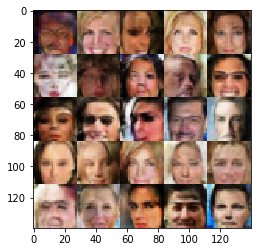

Epoch 6/7... Discriminator Loss: 0.9444 ... Generator Loss: 3.4913
Epoch 6/7... Discriminator Loss: 0.9440 ... Generator Loss: 2.3246
Epoch 6/7... Discriminator Loss: 0.7006 ... Generator Loss: 2.5752
Epoch 6/7... Discriminator Loss: 1.0550 ... Generator Loss: 0.8466
Epoch 6/7... Discriminator Loss: 0.6761 ... Generator Loss: 2.5453


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 7

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.